# Выпускная квалификационная работа Поликаркина Эдуарда

слушателя курса "Data Science" Образовательного центра Московского государственного технического университета им. Н.Э. Баумана

Тема исследования: Прогнозирование конечных свойств новых материалов (композиционных материалов). Цель исследования: построение моделей прогнозирования следующих параметров: «модуль упругости при растяжении»; «прочность при растяжении»; «соотношение матрица-наполнитель» Итог работы: Разработка приложения с графическим интерфейсом, которое будет выдавать прогноз параметра «соотношение матрица-наполнитель».

# План работы:

### Загружаем и обрабатываем входящие датасеты

-	Удаляем неинформативные столбцы

-	Объединяем датасеты по методу INNER

### Проводим разведочный анализ данных:

-	Данные в столбце "Угол нашивки» приведём к 0 и 1

-	Изучим описательную статистику каждой переменной - среднее, медиана, стандартное отклонение, минимум, максимум, 
квартили

-	Проверим датасет на пропуски и дубликаты данных

-	Получим среднее, медианное значение для каждой колонки

-	Вычислим коэффициенты ранговой корреляции Кендалла и Пирсона

### Визуализируем наш разведочный анализ сырых данных

-	Построим гистограмму распределения каждой переменной

-	Построим диаграмму ящиков с усами каждой переменной

-	Построим гистограмму распределения и диаграмма "ящик с усами" одновременно вместе с данными по каждому столбцу

-	Построим график рассеяния точек (матрицы диаграмм рассеяния) 

-	Построим графики квантиль-квантиль

-	Построим корреляционную матрицу с помощью тепловой карты

### Проведём предобработку данных

-	Проверим выбросы по 2 методам: 3-х сигм или межквартильных расстояний 

-	Посчитаем распределение выбросов по каждому столбцу 

-	Исключим выбросы методом межквартильного расстояния

-	Удалим строки c выбросами

-	Визуализируем датасет без выбросов, и убедимся, что выбросы еще есть.

-	Изучим чистые данные по всем параметрам

-	Визуализируем «чистый» датасет (без выбросов)

### Проведём нормализацию и стандартизацию

-	Визуализируем плотность ядра

-	Нормализуем данные

-	Сравним с данными до нормализации

-	Проверим перевод данных из нормализованных в исходные

-	Рассмотрим несколько вариантов корреляции между параметрами после нормализации

-	Стандартизируем данные

-	Визуализируем данные корреляции

-	Посмотрим на описательную статистику после нормализации и после стандартизации

### Разработаем и обучим нескольких моделей прогноза прочности при растяжении (с 30% тестовой выборки)

-	Определим входы и выходы для моделей

-	Разобьём данные на обучающую и тестовую выборки

-	Проверим правильность разбивки

-	Построим модели и найдём лучшие гиперпараметры

-	Построим и визуализируем результат работы моделей

-	Сравним наши модели по метрике МАЕ

-	Проверим все модели и процессинги и выведем лучшую модель и процессинг


### Нейронная сеть для рекомендации соотношения матрица-наполнитель

-	Сформируем входы и выход для модели

-	Нормализуем данные

-	Построим модель, определим параметры

-	Найдем оптимальные параметры для модели

-	Обучим нейросеть 80/20

-	Оценим модель

### Создание удалённого репозитория и загрузка результатов работы на него.

-	https://github.com/PolikarkinDS777

-	Создадим README (https://github.com/PolikarkinDS777#readme)

-	Выгрузим все необходимые файлы и репозиторий

Импортируем сразу все необходимые библиотеки для нашего исследования

In [1]:
!pip install tensorflow

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import sklearn
import tensorflow as tf

from sklearn import linear_model
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.linear_model import LinearRegression, LogisticRegression, SGDRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error, mean_absolute_error
from sklearn.model_selection import train_test_split, GridSearchCV, KFold, cross_val_score
from sklearn.neighbors import KNeighborsRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.pipeline import make_pipeline, Pipeline
from sklearn import preprocessing
from sklearn.preprocessing import Normalizer, LabelEncoder, MinMaxScaler, StandardScaler
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor

from tensorflow import keras as keras
from tensorflow.keras import layers
from tensorflow.keras.layers import Dense, Flatten, Dropout, BatchNormalization, Activation
from pandas import read_excel, DataFrame, Series
from keras.wrappers.scikit_learn import KerasClassifier, KerasRegressor
from tensorflow.keras.models import Sequential
from numpy.random import seed
from scipy import stats
import warnings
warnings.filterwarnings("ignore")

Загружаем исходные данные из excel таблиц и удаляем колонку с индексом

In [3]:
#Загружаем первый датасет (базальтопластик) и посмотрим на названия столбцов
df_bp = pd.read_excel(r"C:\Users\Alex\Desktop\учеба\Бауманка\вкр\X_bp.xlsx")
df_bp.shape

(1023, 11)

In [4]:
#Удаляем первый неинформативный столбец
df_bp.drop(['Unnamed: 0'], axis=1, inplace=True)
#Посмотрим на первые 5 строк первого датасета и убедимся, что первый столбец удалился
df_bp.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"
0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0
2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0


In [5]:
# Проверим размерность первого файла
df_bp.shape

(1023, 10)

In [6]:
# Загружаем второй датасет (углепластик) 
df_nup = pd.read_excel(r"C:\Users\Alex\Desktop\учеба\Бауманка\вкр\X_nup.xlsx")
df_nup.shape

(1040, 4)

In [7]:
#Удаляем первый неинформативный столбец
df_nup.drop(['Unnamed: 0'], axis=1, inplace=True)
#Посмотрим на первые 5 строк второго датасета и убедимся, что и здесь не нужный первый столбец успешно удалился
df_nup.head()

,"Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0,4.0,57.0
1,0,4.0,60.0
2,0,4.0,70.0
3,0,5.0,47.0
4,0,5.0,57.0


In [8]:
# Проверим размерность второго файла
df_nup.shape

(1040, 3)

Объединим по индексу, тип объединения INNER, смотрим итоговый датасет

In [9]:
# Понимаем, что эти два датасета имеют разный объем строк. 
# Но наша задача собрать исходные данные файлы в один, единый набор данных. 
# По условию задачи объединяем их по типу INNER. 
df = df_bp.merge(df_nup, left_index = True, right_index = True, how = 'inner')
df.head().T

,0,1,2,3,4
Соотношение матрица-наполнитель,1.857143,1.857143,1.857143,1.857143,2.771331
"Плотность, кг/м3",2030.000000,2030.000000,2030.000000,2030.000000,2030.000000
"модуль упругости, ГПа",738.736842,738.736842,738.736842,738.736842,753.000000
"Количество отвердителя, м.%",30.000000,50.000000,49.900000,129.000000,111.860000
"Содержание эпоксидных групп,%_2",22.267857,23.750000,33.000000,21.250000,22.267857
"Температура вспышки, С_2",100.000000,284.615385,284.615385,300.000000,284.615385
"Поверхностная плотность, г/м2",210.000000,210.000000,210.000000,210.000000,210.000000
"Модуль упругости при растяжении, ГПа",70.000000,70.000000,70.000000,70.000000,70.000000
"Прочность при растяжении, МПа",3000.000000,3000.000000,3000.000000,3000.000000,3000.000000
"Потребление смолы, г/м2",220.000000,220.000000,220.000000,220.000000,220.000000


Проверяем размеры данных

In [10]:
#Посмотрим количество колонок и столбцов
df.shape

(1023, 13)

Итоговый датасет имеет 13 столбцов и 1023 строки, 17 строк из таблицы X_nup было отброшено,т.е часть данных удалена на начальном этапе исследования.

Познакомимся с датасетом ближе, проведем разведочный анализ.

Знакомство с данными

In [11]:
# Посмотрим на начальные и конечные строки нашего датасета на данном этапе работы
df

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,1.857143,2030.000000,738.736842,30.000000,22.267857,100.000000,210.000000,70.000000,3000.000000,220.000000,0,4.000000,57.000000
1,1.857143,2030.000000,738.736842,50.000000,23.750000,284.615385,210.000000,70.000000,3000.000000,220.000000,0,4.000000,60.000000
2,1.857143,2030.000000,738.736842,49.900000,33.000000,284.615385,210.000000,70.000000,3000.000000,220.000000,0,4.000000,70.000000
3,1.857143,2030.000000,738.736842,129.000000,21.250000,300.000000,210.000000,70.000000,3000.000000,220.000000,0,5.000000,47.000000
4,2.771331,2030.000000,753.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0,5.000000,57.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669,90,9.076380,47.019770
1019,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099,90,10.565614,53.750790
1020,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764,90,4.161154,67.629684
1021,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067,90,6.313201,58.261074


In [12]:
#Просмотрим информацию о датасете, проверим тип данных в каждом столбце (типы признаков)
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1023 entries, 0 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       1023 non-null   float64
 1   Плотность, кг/м3                      1023 non-null   float64
 2   модуль упругости, ГПа                 1023 non-null   float64
 3   Количество отвердителя, м.%           1023 non-null   float64
 4   Содержание эпоксидных групп,%_2       1023 non-null   float64
 5   Температура вспышки, С_2              1023 non-null   float64
 6   Поверхностная плотность, г/м2         1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа  1023 non-null   float64
 8   Прочность при растяжении, МПа         1023 non-null   float64
 9   Потребление смолы, г/м2               1023 non-null   float64
 10  Угол нашивки, град                    1023 non-null   int64  
 11  Шаг нашивки      

все переменные содержат значения float64, качественные характеристики отсутствуют. Пропусков не имеется. Ни одна из записей не является NaN, очистка не требуется. Объединенный файл имеет всего 1023 строки

In [13]:
#Поиск уникальных значений с помощью функции nunique
df.nunique() 

Соотношение матрица-наполнитель         1014
Плотность, кг/м3                        1013
модуль упругости, ГПа                   1020
Количество отвердителя, м.%             1005
Содержание эпоксидных групп,%_2         1004
Температура вспышки, С_2                1003
Поверхностная плотность, г/м2           1004
Модуль упругости при растяжении, ГПа    1004
Прочность при растяжении, МПа           1004
Потребление смолы, г/м2                 1003
Угол нашивки, град                         2
Шаг нашивки                              989
Плотность нашивки                        988
dtype: int64

Видим в основном общее число уникальных значений в каждом столбце, но в столбце "Угол нашивки" всего 2 значения. Поработаем с ним

Поработаем со столбцом "Угол нашивки"

In [14]:
df['Угол нашивки, град'].nunique()

2

Так как кол-во уникальных значений в колонке Угол нашивки равно 2, можем привести данные в этой колонке к значениям 0 и 1

In [15]:
#Проверим кол-во элементов, где Угол нашивки равен 0 градусов
df['Угол нашивки, град'][df['Угол нашивки, град'] == 0.0].count()

520

In [16]:
# Приведем столбец "Угол нашивки" к значениям 0 и 1 и integer
df = df.replace({'Угол нашивки, град': {0.0 : 0, 90.0 : 1}})
df['Угол нашивки, град'] = df['Угол нашивки, град'].astype(int)

In [17]:
#Переименуем столбец
df = df.rename(columns={'Угол нашивки, град' : 'Угол нашивки'})
df

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Угол нашивки,Шаг нашивки,Плотность нашивки
0,1.857143,2030.000000,738.736842,30.000000,22.267857,100.000000,210.000000,70.000000,3000.000000,220.000000,0,4.000000,57.000000
1,1.857143,2030.000000,738.736842,50.000000,23.750000,284.615385,210.000000,70.000000,3000.000000,220.000000,0,4.000000,60.000000
2,1.857143,2030.000000,738.736842,49.900000,33.000000,284.615385,210.000000,70.000000,3000.000000,220.000000,0,4.000000,70.000000
3,1.857143,2030.000000,738.736842,129.000000,21.250000,300.000000,210.000000,70.000000,3000.000000,220.000000,0,5.000000,47.000000
4,2.771331,2030.000000,753.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0,5.000000,57.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669,1,9.076380,47.019770
1019,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099,1,10.565614,53.750790
1020,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764,1,4.161154,67.629684
1021,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067,1,6.313201,58.261074


In [18]:
#Посчитаем количество элементов, где угол нашивки равен 0 градусов и убедимся, что количество не изменилось после наших манипуляций
df['Угол нашивки'][df['Угол нашивки'] == 0.0].count()

520

После преобразования колонки Угол нашивки к значениям 0 и 1, кол-во элементов, где угол нашивки равен 0 не изменилось (520 до и после преобразования)

In [19]:
# Переведем столбец с нумерацией в integer
df.index = df.index.astype('int')

In [20]:
#Изучим описательную статистику наших данных (максимальное, минимальное, квартили, медиана, стандартное отклонение, среднее значение и т.д.), посмотрим на основные параметры анализа данных
df.describe()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Угол нашивки,Шаг нашивки,Плотность нашивки
count,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000
mean,2.930366,1975.734888,739.923233,110.570769,22.244390,285.882151,482.731833,73.328571,2466.922843,218.423144,0.491691,6.899222,57.153929
std,0.913222,73.729231,330.231581,28.295911,2.406301,40.943260,281.314690,3.118983,485.628006,59.735931,0.500175,2.563467,12.350969
min,0.389403,1731.764635,2.436909,17.740275,14.254985,100.000000,0.603740,64.054061,1036.856605,33.803026,0.000000,0.000000,0.000000
25%,2.317887,1924.155467,500.047452,92.443497,20.608034,259.066528,266.816645,71.245018,2135.850448,179.627520,0.000000,5.080033,49.799212
50%,2.906878,1977.621657,739.664328,110.564840,22.230744,285.896812,451.864365,73.268805,2459.524526,219.198882,0.000000,6.916144,57.341920
75%,3.552660,2021.374375,961.812526,129.730366,23.961934,313.002106,693.225017,75.356612,2767.193119,257.481724,1.000000,8.586293,64.944961
max,5.591742,2207.773481,1911.536477,198.953207,33.000000,413.273418,1399.542362,82.682051,3848.436732,414.590628,1.000000,14.440522,103.988901


In [21]:
a = df.describe()
a.T

,count,mean,std,min,25%,50%,75%,max
Соотношение матрица-наполнитель,1023.0,2.930366,0.913222,0.389403,2.317887,2.906878,3.552660,5.591742
"Плотность, кг/м3",1023.0,1975.734888,73.729231,1731.764635,1924.155467,1977.621657,2021.374375,2207.773481
"модуль упругости, ГПа",1023.0,739.923233,330.231581,2.436909,500.047452,739.664328,961.812526,1911.536477
"Количество отвердителя, м.%",1023.0,110.570769,28.295911,17.740275,92.443497,110.564840,129.730366,198.953207
"Содержание эпоксидных групп,%_2",1023.0,22.244390,2.406301,14.254985,20.608034,22.230744,23.961934,33.000000
"Температура вспышки, С_2",1023.0,285.882151,40.943260,100.000000,259.066528,285.896812,313.002106,413.273418
"Поверхностная плотность, г/м2",1023.0,482.731833,281.314690,0.603740,266.816645,451.864365,693.225017,1399.542362
"Модуль упругости при растяжении, ГПа",1023.0,73.328571,3.118983,64.054061,71.245018,73.268805,75.356612,82.682051
"Прочность при растяжении, МПа",1023.0,2466.922843,485.628006,1036.856605,2135.850448,2459.524526,2767.193119,3848.436732
"Потребление смолы, г/м2",1023.0,218.423144,59.735931,33.803026,179.627520,219.198882,257.481724,414.590628


# Описательная статистика содержит по каждому столбцу (по каждой переменной):
* count - количество значений
* mean - среднее значение
* std - стандартное отклонение
* min - минимум
* 25% - верхнее значение первого квартиля
* 50% - медиана
* 75% - верхнее значение третьего квартиля
* max - максимум

# Пропуски данных

In [22]:
# Проверим на пропущенные данные
df.isnull().sum()

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           0
Потребление смолы, г/м2                 0
Угол нашивки                            0
Шаг нашивки                             0
Плотность нашивки                       0
dtype: int64

Пропущенных данных нет = нулевых значений нет, очистка не требуется

In [23]:
for col in df.columns:
    pct_missing = np.mean(df[col].isnull())
    print('{} - {}%'.format(col, round(pct_missing*100)))

Соотношение матрица-наполнитель - 0%
Плотность, кг/м3 - 0%
модуль упругости, ГПа - 0%
Количество отвердителя, м.% - 0%
Содержание эпоксидных групп,%_2 - 0%
Температура вспышки, С_2 - 0%
Поверхностная плотность, г/м2 - 0%
Модуль упругости при растяжении, ГПа - 0%
Прочность при растяжении, МПа - 0%
Потребление смолы, г/м2 - 0%
Угол нашивки - 0%
Шаг нашивки - 0%
Плотность нашивки - 0%


# Дубликаты

In [24]:
# Проверим датасет на дубликаты
df.duplicated().sum()

0

Дубликатов нет

По заданию необходимо получить среднее, медианное значение для каждой колонки среднее значение

In [25]:
#получим среднее и медианное значения данных в колонках
mean_and_50 = df.describe()
mean_and_50.loc[['mean', '50%']]

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Угол нашивки,Шаг нашивки,Плотность нашивки
mean,2.930366,1975.734888,739.923233,110.570769,22.244390,285.882151,482.731833,73.328571,2466.922843,218.423144,0.491691,6.899222,57.153929
50%,2.906878,1977.621657,739.664328,110.564840,22.230744,285.896812,451.864365,73.268805,2459.524526,219.198882,0.000000,6.916144,57.341920


в целом мы видим близкие друг к другу значения

# Cреднее значение

In [26]:
df.mean()

Соотношение матрица-наполнитель            2.930366
Плотность, кг/м3                        1975.734888
модуль упругости, ГПа                    739.923233
Количество отвердителя, м.%              110.570769
Содержание эпоксидных групп,%_2           22.244390
Температура вспышки, С_2                 285.882151
Поверхностная плотность, г/м2            482.731833
Модуль упругости при растяжении, ГПа      73.328571
Прочность при растяжении, МПа           2466.922843
Потребление смолы, г/м2                  218.423144
Угол нашивки                               0.491691
Шаг нашивки                                6.899222
Плотность нашивки                         57.153929
dtype: float64

# Медианное значение

In [27]:
df.median()

Соотношение матрица-наполнитель            2.906878
Плотность, кг/м3                        1977.621657
модуль упругости, ГПа                    739.664328
Количество отвердителя, м.%              110.564840
Содержание эпоксидных групп,%_2           22.230744
Температура вспышки, С_2                 285.896812
Поверхностная плотность, г/м2            451.864365
Модуль упругости при растяжении, ГПа      73.268805
Прочность при растяжении, МПа           2459.524526
Потребление смолы, г/м2                  219.198882
Угол нашивки                               0.000000
Шаг нашивки                                6.916144
Плотность нашивки                         57.341920
dtype: float64

In [28]:
# Вычисляем коэффициенты ранговой корреляции Кендалла. Статистической зависимости не наблюдаем.
df.corr(method = 'kendall')

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Угол нашивки,Шаг нашивки,Плотность нашивки
Соотношение матрица-наполнитель,1.000000,-0.003135,0.021247,0.001410,0.010180,-0.009480,-0.002060,-0.004157,0.011614,0.035145,-0.021395,0.022723,0.002788
"Плотность, кг/м3",-0.003135,1.000000,-0.008059,-0.021963,-0.007758,-0.019947,0.037302,-0.021151,-0.047426,-0.017079,-0.051525,-0.031220,0.052935
"модуль упругости, ГПа",0.021247,-0.008059,1.000000,0.022382,0.002351,0.021028,-0.000442,0.005458,0.022959,0.005169,-0.031695,-0.008305,0.049347
"Количество отвердителя, м.%",0.001410,-0.021963,0.022382,1.000000,0.000010,0.059034,0.033110,-0.043140,-0.046507,-0.003677,0.024690,0.006232,0.016607
"Содержание эпоксидных групп,%_2",0.010180,-0.007758,0.002351,0.000010,1.000000,-0.002170,-0.006859,0.041994,-0.013441,0.009756,0.004668,-0.004539,-0.021968
"Температура вспышки, С_2",-0.009480,-0.019947,0.021028,0.059034,-0.002170,1.000000,0.017196,0.016481,-0.019106,0.035313,0.017880,0.029552,0.005268
"Поверхностная плотность, г/м2",-0.002060,0.037302,-0.000442,0.033110,-0.006859,0.017196,1.000000,0.024051,-0.005099,-0.004446,0.045452,0.025514,-0.022320
"Модуль упругости при растяжении, ГПа",-0.004157,-0.021151,0.005458,-0.043140,0.041994,0.016481,0.024051,1.000000,-0.006599,0.034814,0.022431,-0.010024,-0.002600
"Прочность при растяжении, МПа",0.011614,-0.047426,0.022959,-0.046507,-0.013441,-0.019106,-0.005099,-0.006599,1.000000,0.013580,0.020609,-0.048049,0.009821
"Потребление смолы, г/м2",0.035145,-0.017079,0.005169,-0.003677,0.009756,0.035313,-0.004446,0.034814,0.013580,1.000000,-0.002402,0.005962,0.010792


In [29]:
#Вычисляем коэффициенты корреляции Пирсона. Статистической зависимости не наблюдаем.
df.corr(method ='pearson')

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Угол нашивки,Шаг нашивки,Плотность нашивки
Соотношение матрица-наполнитель,1.000000,0.003841,0.031700,-0.006445,0.019766,-0.004776,-0.006272,-0.008411,0.024148,0.072531,-0.031073,0.036437,-0.004652
"Плотность, кг/м3",0.003841,1.000000,-0.009647,-0.035911,-0.008278,-0.020695,0.044930,-0.017602,-0.069981,-0.015937,-0.068474,-0.061015,0.080304
"модуль упругости, ГПа",0.031700,-0.009647,1.000000,0.024049,-0.006804,0.031174,-0.005306,0.023267,0.041868,0.001840,-0.025417,-0.009875,0.056346
"Количество отвердителя, м.%",-0.006445,-0.035911,0.024049,1.000000,-0.000684,0.095193,0.055198,-0.065929,-0.075375,0.007446,0.038570,0.014887,0.017248
"Содержание эпоксидных групп,%_2",0.019766,-0.008278,-0.006804,-0.000684,1.000000,-0.009769,-0.012940,0.056828,-0.023899,0.015165,0.008052,0.003022,-0.039073
"Температура вспышки, С_2",-0.004776,-0.020695,0.031174,0.095193,-0.009769,1.000000,0.020121,0.028414,-0.031763,0.059954,0.020695,0.025795,0.011391
"Поверхностная плотность, г/м2",-0.006272,0.044930,-0.005306,0.055198,-0.012940,0.020121,1.000000,0.036702,-0.003210,0.015692,0.052299,0.038332,-0.049923
"Модуль упругости при растяжении, ГПа",-0.008411,-0.017602,0.023267,-0.065929,0.056828,0.028414,0.036702,1.000000,-0.009009,0.050938,0.023003,-0.029468,0.006476
"Прочность при растяжении, МПа",0.024148,-0.069981,0.041868,-0.075375,-0.023899,-0.031763,-0.003210,-0.009009,1.000000,0.028602,0.023398,-0.059547,0.019604
"Потребление смолы, г/м2",0.072531,-0.015937,0.001840,0.007446,0.015165,0.059954,0.015692,0.050938,0.028602,1.000000,-0.015334,0.013394,0.012239


In [30]:
#Создадим переменную для названия всех столбцов. Это нам пригодится при построении моделей. И перейдем к визуализации данных
df.columns
#column_names = ["Соотношение матрица-наполнитель","Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%",
#         "Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2",
#         "Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",
#        "Угол нашивки, град","Шаг нашивки","Плотность нашивки"]
column_names = df.columns

# Визуализируем сырые данные и проведем анализ

* Построим гистограмму распределения каждой из переменных и боксплоты,
* диаграмму "ящиков с усами",
* попарный график рассеяния точек
* график квантиль-квантиль

Т.к. беглый взгляд на общий файл и дополнительный анализ в excel не дал каких-то явных и бросающихся в глаза закономерностей, то используем разные варианты визуализации в надежде, что получится увидеть какую-то корреляцию. И разные варианты одного и того же типа визуализации используются для отображения результата, потому что какие-то графики отображаются в jupiter, но не работают в colab, какие-то не работают в Github

Показатели описательной статистики и визуализация гистограмм и/или диа-грамм размаха («ящик с усами») позволяют получить наглядное представление о характерах распределений переменных. Такое частотное распределение показыва-ет, какие именно конкретные значения или диапазоны значений исследуемой пере-менной встречаются наиболее часто, насколько различаются эти значения, распо-ложено ли большинство наблюдений около среднего значения, является распреде-ление симметричным или асимметричным, многомодальным (т.е. имеет две или более вершины) или одномодальным и т.д. По форме распределения можно судить о природе исследуемой переменной (например, бимодальное распределение позволяет предположить, что выборка не является однородной и содержит наблюдения, принадлежащие двум различным множествам, которые в свою очередь нормально распределены).

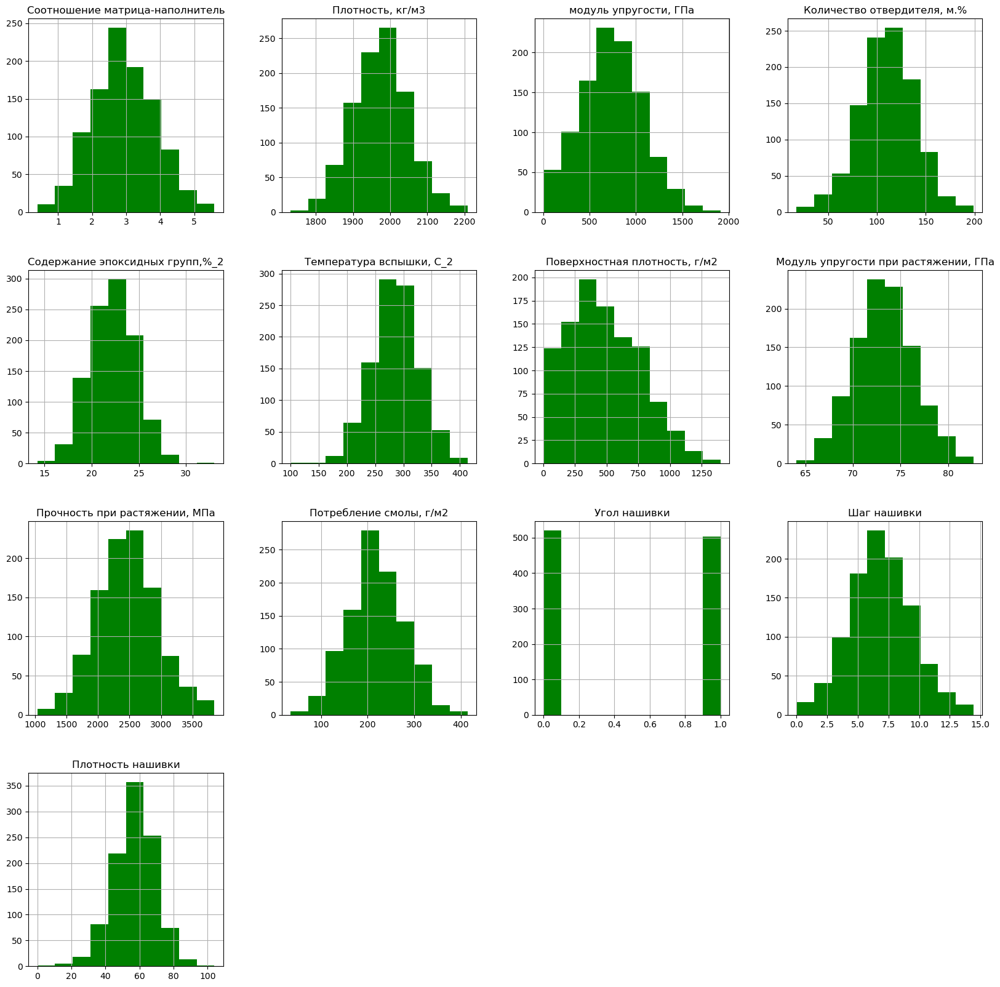

In [31]:
# Построим гистограммы распределения каждой из переменных без нормализации и исключения шумов
df.hist(figsize = (20,20), color = "g")
plt.show()

При проведении анализа выявлены параметры близкие к нормальному: Соотношение матрица-наполнитель; Плотность, кг/м3; Модуль упругости, Гпа; Количество отвердителя, м.%; Содержание эпоксидных групп,%_2; Температура вспышки, С_2; Поверхностная плотность, г/м2; Модуль упругости при растяжении, Гпа; Прочность при растяжении, Мпа; Потребление смолы, г/м2; Шаг нашивки; Плотность нашивки. Преимущественно данные стремятся к нормальному распределению. Угол нашивки, как и отражено в датасете, имеет только два значения 90 градусов и 0 градусов, что отражает общий подход к проведению нашивки материалов, а также может быть использовано при обработке данных. Учитывая отсутствие иных показателей для угла нашивки, предлагаем в прогнозе использовать категориальный, а не непрерывный подход при анализе данного параметра.

Гистограммы показывают ярковыраженные выбросы в столбцах: плотность, содержание эпоксидных групп, температура вспышки, плотность нашивки. 
Данные стремятся к нормальному распределению практически везде, кроме угла нашивки, имеющим только 2 значения, с которым мы уже поработали ранее. 

Многие алгоритмы машинного обучения чувствительны к разбросу и рас-пределению значений признаков обрабатываемых объектов. Соответственно, вы-бросы во входных данных могут исказить и ввести в заблуждение процесс обучения алгоритмов машинного обучения, что приводит к увеличению времени обучения, снижению точности моделей и, в конечном итоге, к снижению результатов.

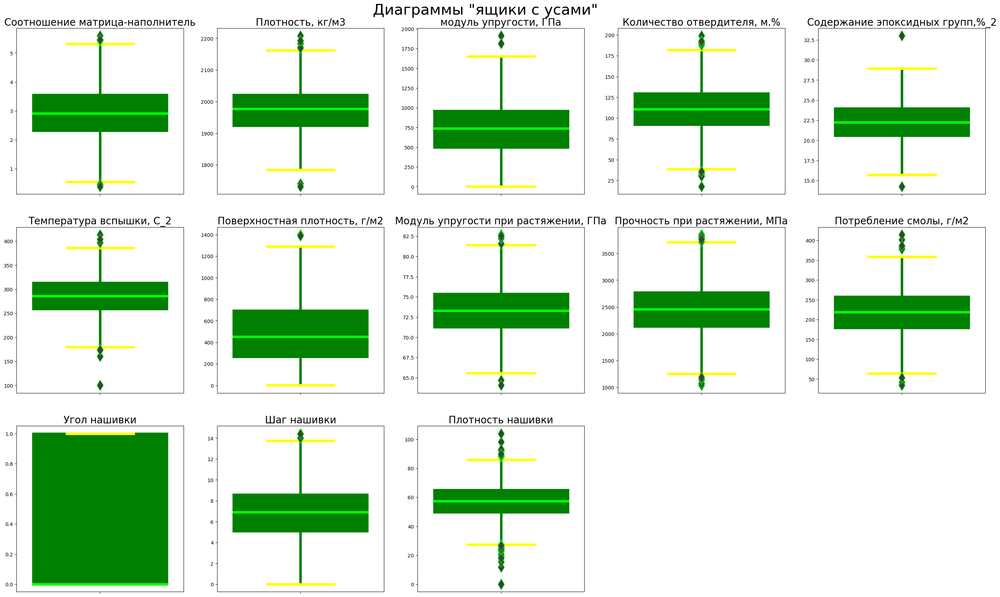

In [35]:
# Ящики с усами 
a = 5 # количество строк
b = 5 # количество столцбцов
c = 1 # инициализация plot counter

plt.figure(figsize = (35,35))
plt.suptitle('Диаграммы "ящики с усами"', y = 0.9 ,
             fontsize = 30)
for col in df.columns:
    plt.subplot(a, b, c)
    #plt.figure(figsize=(7,5))
    sns.boxplot(data = df, y = df[col], fliersize = 15, linewidth = 5, boxprops = dict(facecolor = 'y', color = 'g'), medianprops = dict(color = 'lime'), whiskerprops = dict(color="g"), capprops = dict(color = "yellow"), flierprops = dict(color="y", markeredgecolor = "lime"))
    plt.ylabel(None)
    plt.title(col, size = 20)
    #plt.show()
    c += 1

"Ящики с усами" показывают наличие выбросов во всех столбцах, кроме углов нашивки, значит, с ними будем работать

Соотношение матрица-наполнитель


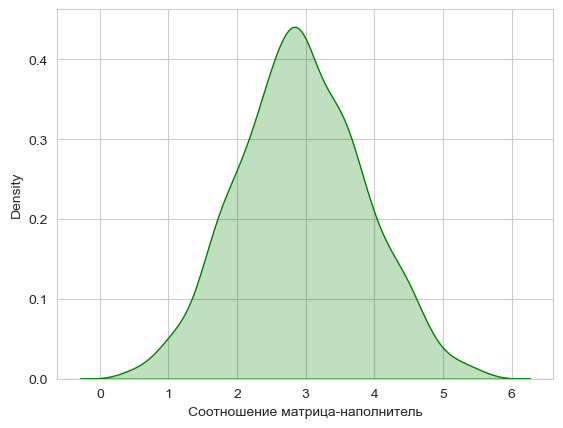

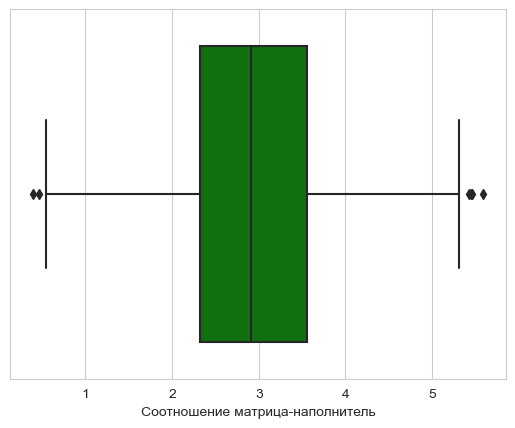

Минимальное значение:  0.389402605178414
Максимальное значение:  5.59174159869754
Среднее значение:  2.9303657734325483
Медианное значение:  2.90687765033521



Плотность, кг/м3


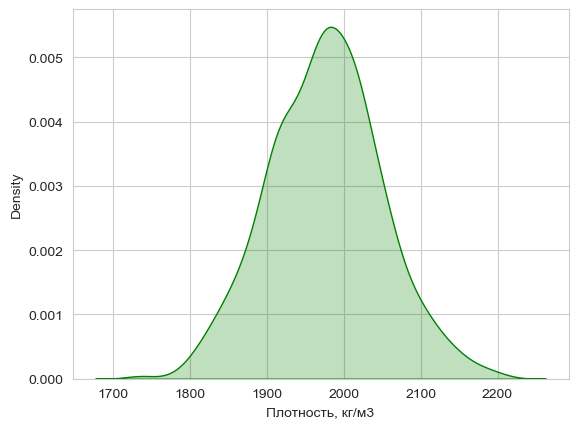

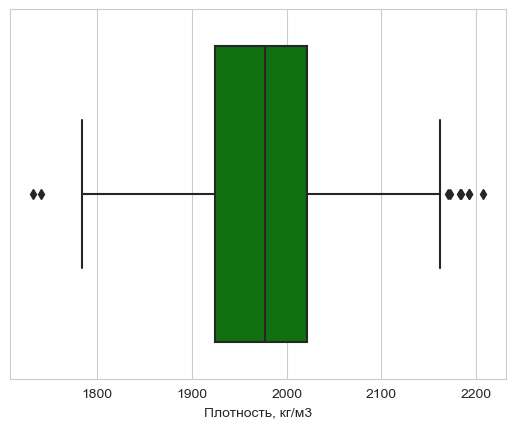

Минимальное значение:  1731.764635096
Максимальное значение:  2207.77348061119
Среднее значение:  1975.7348881101545
Медианное значение:  1977.62165679058



модуль упругости, ГПа


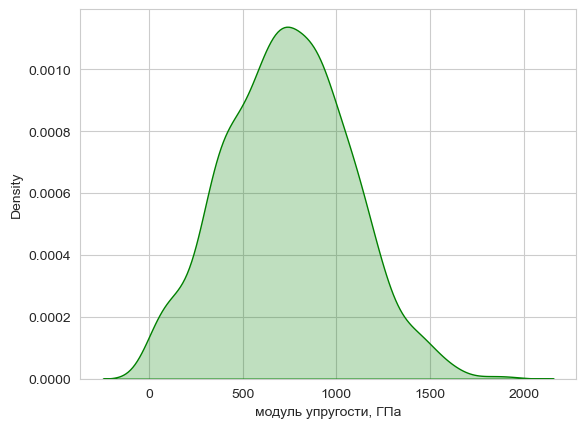

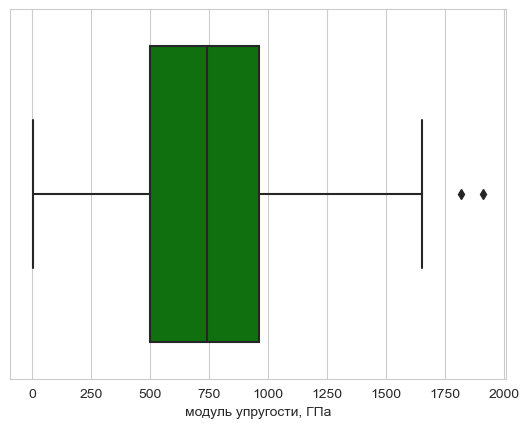

Минимальное значение:  2.4369087535075
Максимальное значение:  1911.53647700054
Среднее значение:  739.9232327560721
Медианное значение:  739.664327697792



Количество отвердителя, м.%


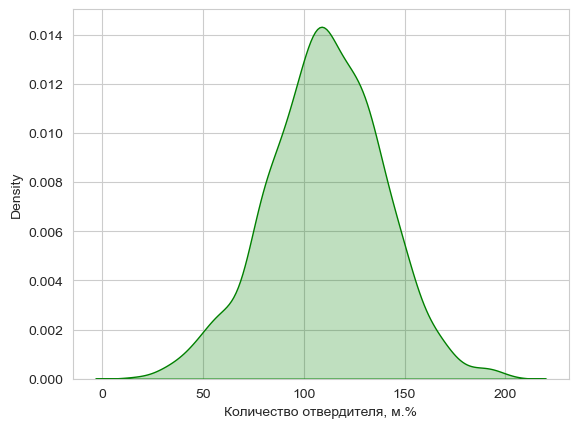

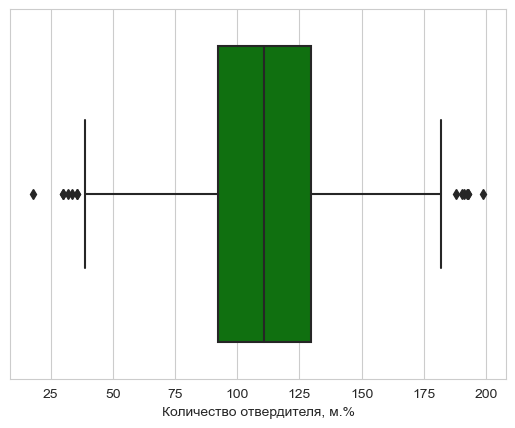

Минимальное значение:  17.7402745562519
Максимальное значение:  198.953207190451
Среднее значение:  110.57076864736254
Медианное значение:  110.564839894065



Содержание эпоксидных групп,%_2


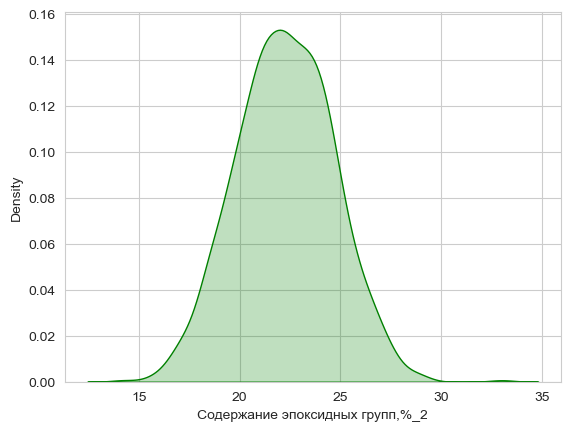

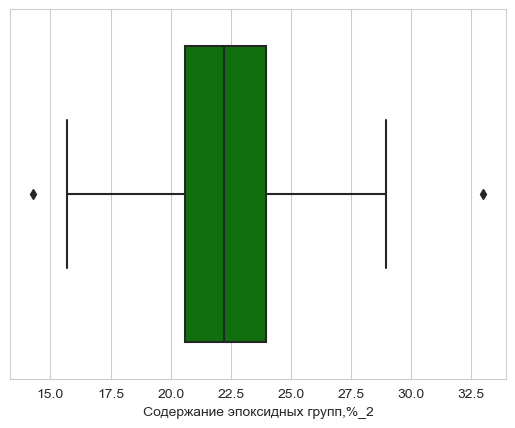

Минимальное значение:  14.2549854977161
Максимальное значение:  33.0
Среднее значение:  22.24438954776773
Медианное значение:  22.2307437560244



Температура вспышки, С_2


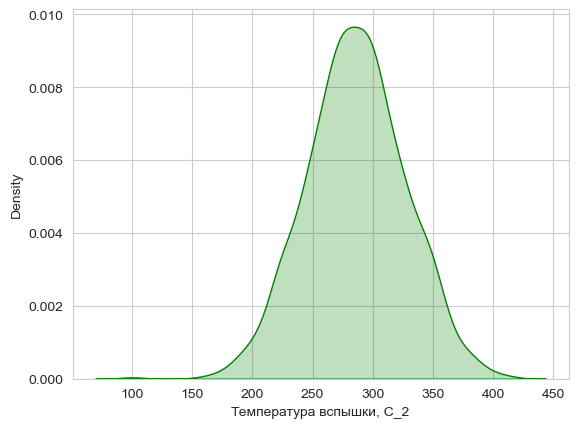

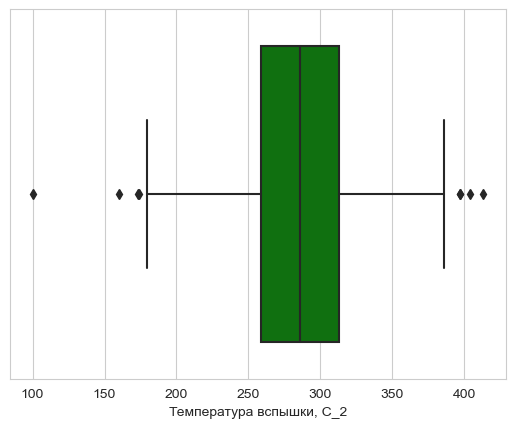

Минимальное значение:  100.0
Максимальное значение:  413.273418243566
Среднее значение:  285.88215135162187
Медианное значение:  285.896812331237



Поверхностная плотность, г/м2


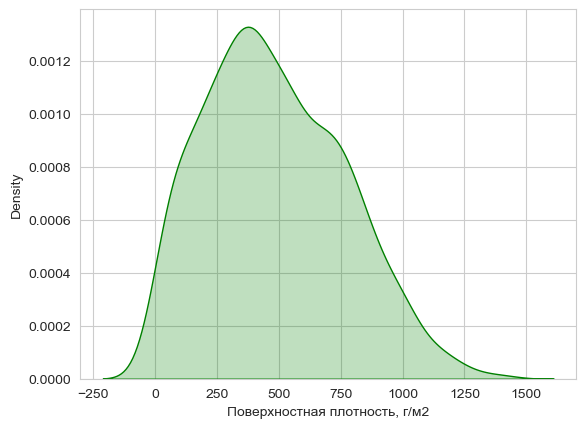

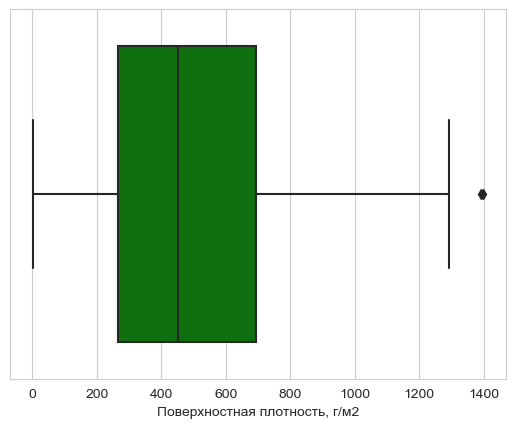

Минимальное значение:  0.603739925153945
Максимальное значение:  1399.54236233989
Среднее значение:  482.73183303841853
Медианное значение:  451.86436518306



Модуль упругости при растяжении, ГПа


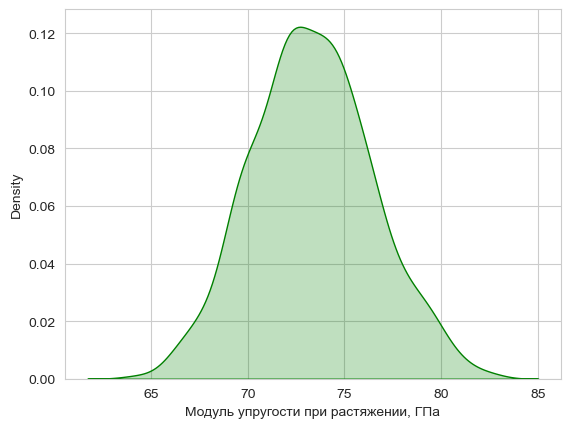

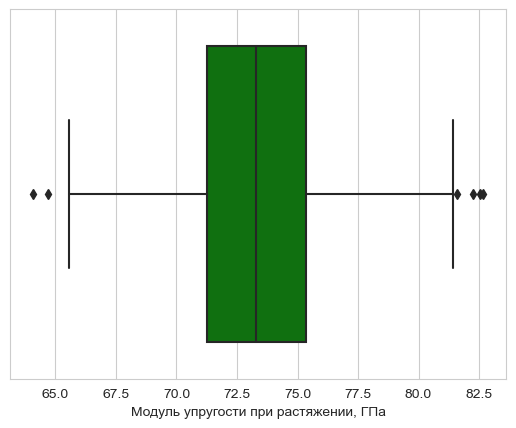

Минимальное значение:  64.0540605597917
Максимальное значение:  82.682051035271
Среднее значение:  73.32857125009068
Медианное значение:  73.2688045943481



Прочность при растяжении, МПа


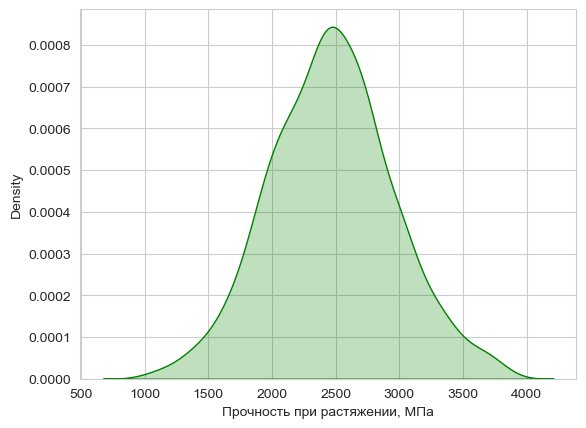

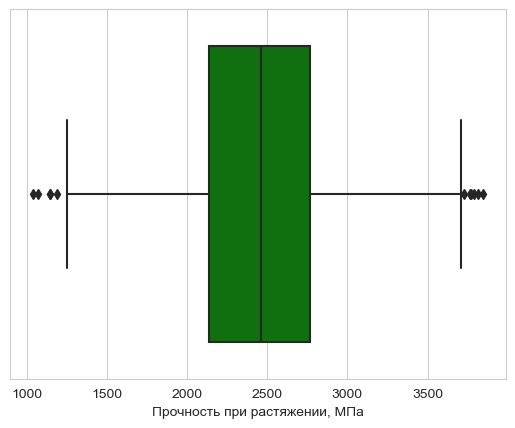

Минимальное значение:  1036.85660535
Максимальное значение:  3848.43673187618
Среднее значение:  2466.922842697902
Медианное значение:  2459.52452600309



Потребление смолы, г/м2


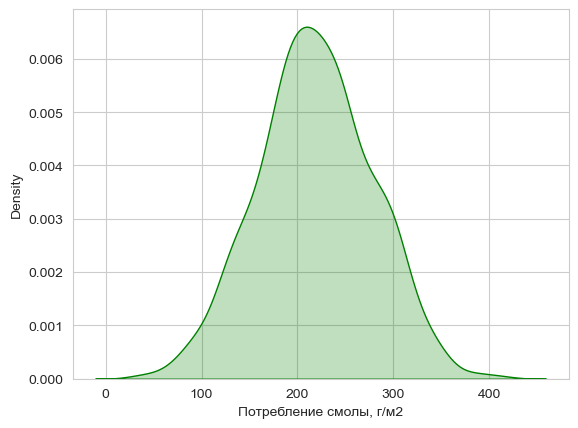

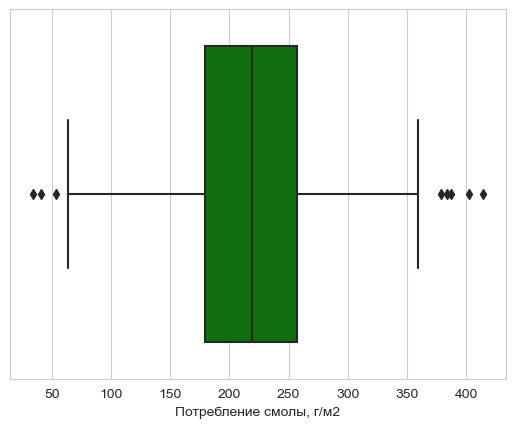

Минимальное значение:  33.8030255329625
Максимальное значение:  414.590628361534
Среднее значение:  218.42314367654285
Медианное значение:  219.198882195134



Угол нашивки


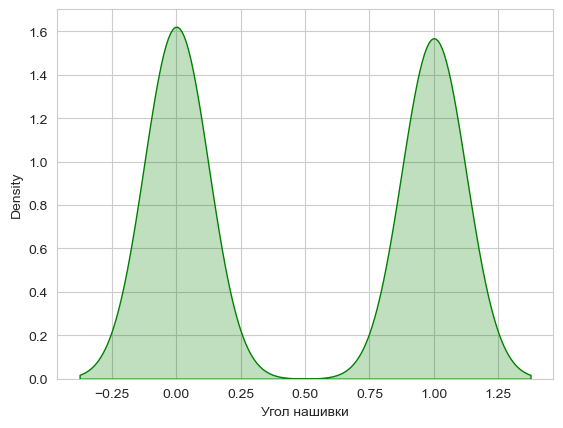

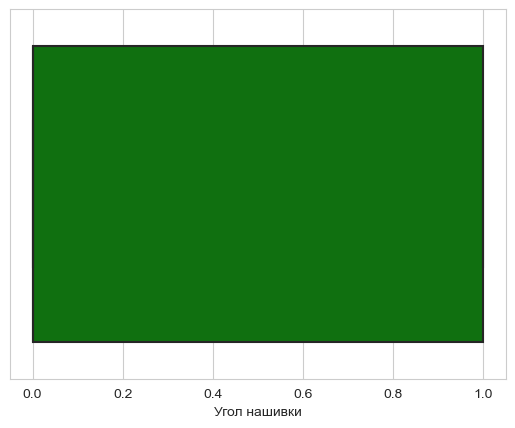

Минимальное значение:  0
Максимальное значение:  1
Среднее значение:  0.4916911045943304
Медианное значение:  0.0



Шаг нашивки


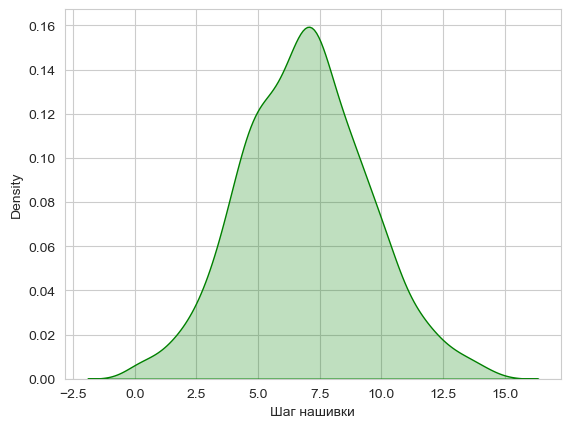

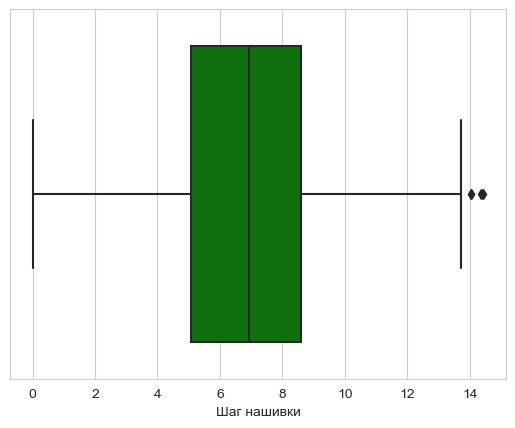

Минимальное значение:  0.0
Максимальное значение:  14.4405218753969
Среднее значение:  6.8992220776750175
Медианное значение:  6.9161438559491



Плотность нашивки


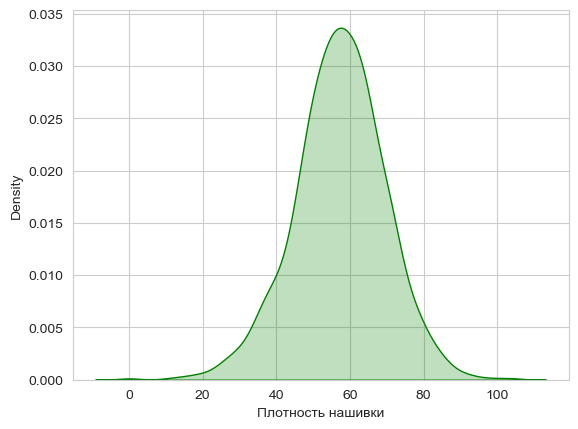

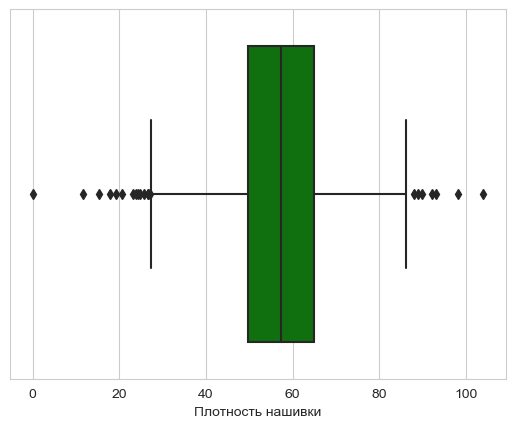

Минимальное значение:  0.0
Максимальное значение:  103.988901301494
Среднее значение:  57.153929432857645
Медианное значение:  57.3419198469929





In [36]:
# Гистограмма распределения и диаграмма "ящик с усами" вместе с данными по каждому столбцу
for column_name in column_names:
    print(column_name)
    
    #Гистограмма распределения
    gis = df[column_name]
    sns.set_style("whitegrid")
    sns.kdeplot(data = gis, shade = True, palette ='colorblind', color = "g")
    plt.show()
    
    #Диаграмма "Ящик с усами"
    sns.boxplot(x=gis, color = "g");
    plt.show()
    
    #Значения (мин макс ср)
    print("Минимальное значение: ", end = " ")
    print(np.min(gis))
    print("Максимальное значение: ", end=" ")
    print(np.max(gis))
    print("Среднее значение: ", end = " ")
    print(np.mean(gis))

    print("Медианное значение: ", end = " ")
    print(np.median(gis))
    print("\n\n")

Кроме "Угол нашивки, град" и "Поверхностная плотность, г/м2" остальные переменные относительно хорошо соответствуют нормальному распределению

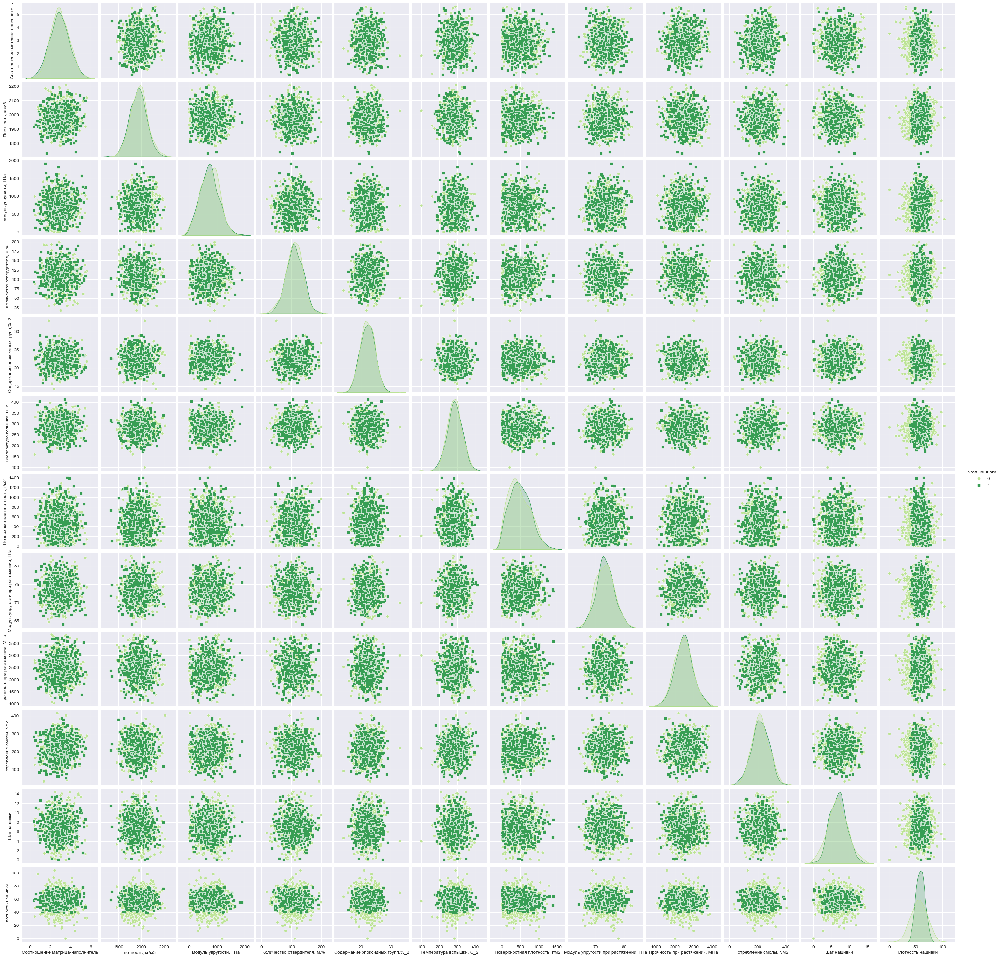

In [37]:
# Попарные графики рассеяния точек (диаграмма рассеяния)
sns.set_style('darkgrid')
sns.pairplot(df, hue = 'Угол нашивки', markers = ["o", "s"], diag_kind = 'auto', palette='YlGn')

Попарные графики рассеяния точек так же не показывают какой-либо зависимости между данными. Зависимость между показателями не линейная, взаимосвязь отсутствует, необходимо использовать несколько показателей. Из графиков можно наблюдать выбросы, потому что некоторые точки располагаются далеко от общего облака
Отсутствие линейной корреляции наверняка подтвердится при построении регрессии?

Корреляции нет

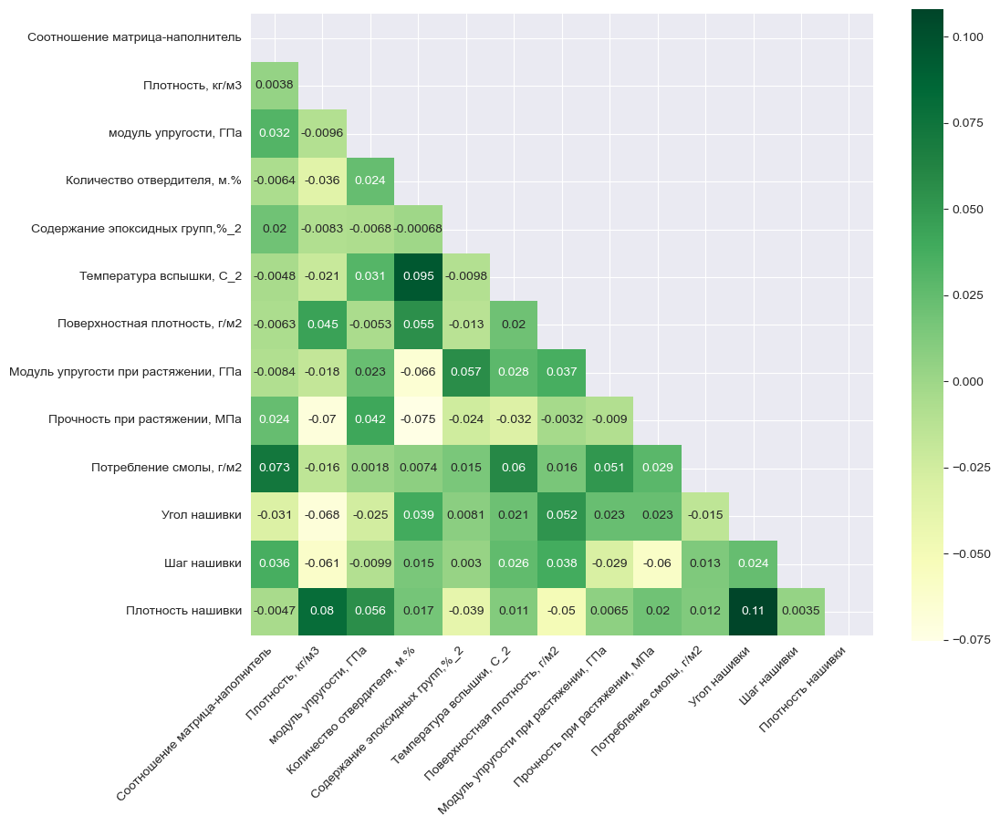

In [39]:
#Визуализация корреляционной матрицы с помощью тепловой карты
mask = np.triu(df.corr())
# Создаем полотно для отображения большого графика
f, ax = plt.subplots(figsize = (11, 9))
# # Визуализируем данные кореляции и создаем цветовую палитру
sns.heatmap(df.corr(), mask = mask, annot = True, square = True, cmap = 'YlGn')
plt.xticks(rotation = 45, ha='right')
plt.show()

Максимальная корреляция между Плотностью нашивки и углом нашивки и составляет 0.11, что говорит об отсутствии зависимости между этими данными. 
Корреляция между всеми параметрами очень близка к 0, что говорит об отсутствии корреляционных связей между переменными.

График корреляции подтверждает данные теории композитных материалов. Мы видим, что на качество материла влияет температура вспышки и количество отвердителя из-за взаимодействия отвердителя с матрицей и наполнителем под влиянием температуры. Угол нашивки и плотность нашивки несомненно оказывают влияние на свойства материала. А потребление смолы и соотношение матрицы-наполнителя, плотности и плотности нашивки, модуля упругости и плотности нашивки имеют не особенно выраженную корреляцию.

На наших данных мы наблюдаем выбросы в каждом столбце, кроме столбца "Угол нашивки" корреляция входных переменных очень слабая.

In [40]:
#Создадим переменную для названия всех столбцов. Это нам пригодится при построении моделей. И перейдем к визуализации данных
df.columns
#column_names = ["Соотношение матрица-наполнитель","Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%",
#         "Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2",
#         "Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",
#        "Угол нашивки, град","Шаг нашивки","Плотность нашивки"]
column_names = df.columns

# Проведем предобработку данных

In [41]:
#Вспомним, что пропуски в данных отсутствуют. Значит, сразу приступаем к работе с выбросами
# Шаг 1 Удаление выбросов. Посчитаем, сколько значений у нас в каждом столбце выбивающихся из распределения.
df.isna().sum()
#Т.к.значений не очень много, их вполне можно исключить.

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           0
Потребление смолы, г/м2                 0
Угол нашивки                            0
Шаг нашивки                             0
Плотность нашивки                       0
dtype: int64

In [42]:
#Для удаления выбросов существует 2 основных метода - метод 3-х сигм и межквартильных расстояний. Сравним эти 2 метода.
metod_3s = 0
metod_iq = 0
count_iq = [] # Список, куда записывается количество выбросов по каждой колонке датафрейма методом.
count_3s = [] # Список, куда записывается количество выбросов по каждой колонке датафрейма.
for column in df:
    d = df.loc[:, [column]]
    # методом 3-х сигм
    zscore = (df[column] - df[column].mean()) / df[column].std()
    d['3s'] = zscore.abs() > 3
    metod_3s += d['3s'].sum()
    count_3s.append(d['3s'].sum())
    print(column,'3s', ': ', d['3s'].sum())

    # методом межквартильных расстояний
    q1 = np.quantile(df[column], 0.25)
    q3 = np.quantile(df[column], 0.75)
    iqr = q3 - q1
    lower = q1 - 1.5 * iqr
    upper = q3 + 1.5 * iqr
    d['iq'] = (df[column] <= lower) | (df[column] >= upper)
    metod_iq += d['iq'].sum()
    count_iq.append(d['iq'].sum())
    print(column, ': ', d['iq'].sum())
print('Метод 3-х сигм, выбросов:', metod_3s)
print('Метод межквартильных расстояний, выбросов:', metod_iq)

Соотношение матрица-наполнитель 3s :  0
Соотношение матрица-наполнитель :  6
Плотность, кг/м3 3s :  3
Плотность, кг/м3 :  9
модуль упругости, ГПа 3s :  2
модуль упругости, ГПа :  2
Количество отвердителя, м.% 3s :  2
Количество отвердителя, м.% :  14
Содержание эпоксидных групп,%_2 3s :  2
Содержание эпоксидных групп,%_2 :  2
Температура вспышки, С_2 3s :  3
Температура вспышки, С_2 :  8
Поверхностная плотность, г/м2 3s :  2
Поверхностная плотность, г/м2 :  2
Модуль упругости при растяжении, ГПа 3s :  0
Модуль упругости при растяжении, ГПа :  6
Прочность при растяжении, МПа 3s :  0
Прочность при растяжении, МПа :  11
Потребление смолы, г/м2 3s :  3
Потребление смолы, г/м2 :  8
Угол нашивки 3s :  0
Угол нашивки :  0
Шаг нашивки 3s :  0
Шаг нашивки :  4
Плотность нашивки 3s :  7
Плотность нашивки :  21
Метод 3-х сигм, выбросов: 24
Метод межквартильных расстояний, выбросов: 93


С целью предотвращения удаления особенностей признака или допущения ошибки, посчитаем распределение выбросов по каждому столбцу.

In [43]:
m = df.copy()
for i in df.columns:
    m[i] = abs((df[i] - df[i].mean()) / df[i].std())
    print(f"{sum(m[i] > 3)} выбросов в признаке {i}")
print(f' Всего {sum(sum(m.values > 3))} выброса')

0 выбросов в признаке Соотношение матрица-наполнитель
3 выбросов в признаке Плотность, кг/м3
2 выбросов в признаке модуль упругости, ГПа
2 выбросов в признаке Количество отвердителя, м.%
2 выбросов в признаке Содержание эпоксидных групп,%_2
3 выбросов в признаке Температура вспышки, С_2
2 выбросов в признаке Поверхностная плотность, г/м2
0 выбросов в признаке Модуль упругости при растяжении, ГПа
0 выбросов в признаке Прочность при растяжении, МПа
3 выбросов в признаке Потребление смолы, г/м2
0 выбросов в признаке Угол нашивки
0 выбросов в признаке Шаг нашивки
7 выбросов в признаке Плотность нашивки
 Всего 24 выброса


Результаты показывают, что выбросы распределены по разным признакам. Какого-то скопления выбросов в одном из признаков не обнаружено. Поэтому можно удалять выбросы, потому что глобальных изменений в зависимостях они не дадут.

In [44]:
#Создадим переменную со списком всех параметров, в которых есть выбросы
df.columns
column_list_drop = ["Соотношение матрица-наполнитель",
                 "Плотность, кг/м3",
                 "модуль упругости, ГПа",
                 "Количество отвердителя, м.%",
                 "Содержание эпоксидных групп,%_2",
                 "Температура вспышки, С_2",
                 "Поверхностная плотность, г/м2",
                 "Модуль упругости при растяжении, ГПа",
                 "Прочность при растяжении, МПа",
                 "Потребление смолы, г/м2",
                 "Шаг нашивки",
                 "Плотность нашивки"]

In [45]:
# Исключим выбросы, очистим данные от выбросов методом межквартильного расстояния (далее 1,5 межквартильных размахов)
# Выбор сделан в пользу этого метода, потому что хотим добиться в данной работе полностью избавления от выборов, и метод межквартильного расстояния позволяет удалить практически 10% датасета сразу
for i in column_list_drop:
    q75, q25 = np.percentile(df.loc[:,i], [75,25])
    intr_qr = q75 - q25
    max = q75 + (1.5 * intr_qr)
    min = q25 - (1.5 * intr_qr)
    df.loc[df[i] < min, i] = np.nan
    df.loc[df[i] > max, i] = np.nan

In [46]:
# Можно так же удалить выборосы методом 3-х сигм, но мы не будем. Просто отсвим код здесь на будущее
m_3s = pd.DataFrame(index=df.index)
for column in df:
    zscore = (df[column] - df[column].mean()) / df[column].std()
    m_3s[column] = (zscore.abs() > 3)
df = df[m_3s.sum(axis=1)==0]
df.shape

(1023, 13)

In [47]:
#Посмотрим на сумму выбросов по каждому из столбцов
df.isnull().sum()
#Всего 64 выброса, можно их удалить.

Соотношение матрица-наполнитель          6
Плотность, кг/м3                         9
модуль упругости, ГПа                    2
Количество отвердителя, м.%             14
Содержание эпоксидных групп,%_2          2
Температура вспышки, С_2                 8
Поверхностная плотность, г/м2            2
Модуль упругости при растяжении, ГПа     6
Прочность при растяжении, МПа           11
Потребление смолы, г/м2                  8
Угол нашивки                             0
Шаг нашивки                              4
Плотность нашивки                       21
dtype: int64

In [48]:
#Удаляем строки c выбросами
df = df.dropna(axis=0)

In [49]:
#И еще раз посмотрим на сумму выбросов по каждому из столбцов, чтобы убедиться, что все работает
df.isnull().sum()

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           0
Потребление смолы, г/м2                 0
Угол нашивки                            0
Шаг нашивки                             0
Плотность нашивки                       0
dtype: int64

In [50]:
#Просмотрим информацию о "чистом" датасете после удаления пропусков. Видим, что строк стало меньше
df.info()
# После удаления выбросов в датасете осталось 936 строк и 13 колонок

<class 'pandas.core.frame.DataFrame'>
Int64Index: 936 entries, 1 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       936 non-null    float64
 1   Плотность, кг/м3                      936 non-null    float64
 2   модуль упругости, ГПа                 936 non-null    float64
 3   Количество отвердителя, м.%           936 non-null    float64
 4   Содержание эпоксидных групп,%_2       936 non-null    float64
 5   Температура вспышки, С_2              936 non-null    float64
 6   Поверхностная плотность, г/м2         936 non-null    float64
 7   Модуль упругости при растяжении, ГПа  936 non-null    float64
 8   Прочность при растяжении, МПа         936 non-null    float64
 9   Потребление смолы, г/м2               936 non-null    float64
 10  Угол нашивки                          936 non-null    int32  
 11  Шаг нашивки       

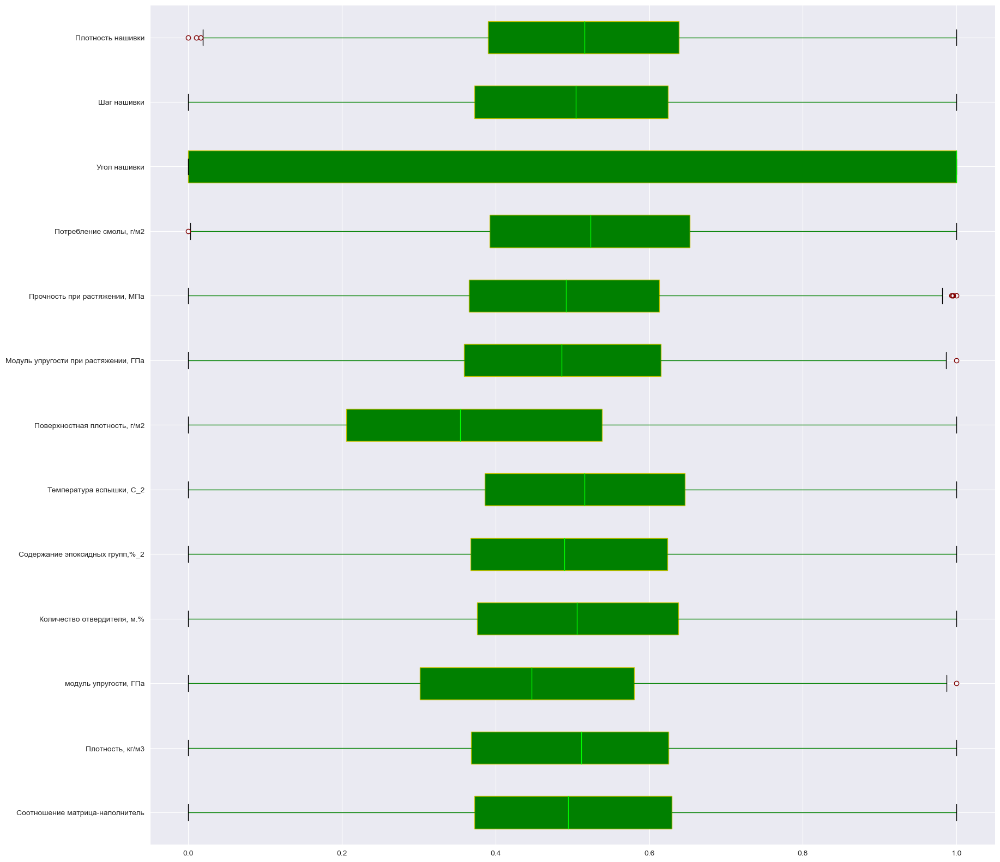

In [52]:
#Построим "ящики с усами" и наблюдаем все еще наличие выбросов
scaler = MinMaxScaler()
scaler.fit(df)
plt.figure(figsize = (20, 20))
#Посмотрим на  "ящики с усами",чтобы наглядно увидеть, что выбросов нет, но они есть
plt.boxplot(pd.DataFrame(scaler.transform(df)), labels = df.columns,patch_artist = True, meanline = True, vert = False, boxprops = dict(facecolor = 'g', color = 'y'),medianprops = dict(color = 'lime'), whiskerprops = dict(color = "g"), capprops = dict(color = "black"), flierprops = dict(color = "y", markeredgecolor = "maroon"))
plt.show()

In [53]:
# На графиках выше мы видим выбросы в некоторых столбцах. Они всё ещё есть, поэтому повторяем удаление выбросов

for i in column_list_drop:
    q75, q25 = np.percentile(df.loc[:,i],[75, 25])
    intr_qr = q75 - q25
    max = q75 + (1.5 * intr_qr)
    min = q25 - (1.5 * intr_qr)
    df.loc[df[i] < min, i] = np.nan
    df.loc[df[i] > max, i] = np.nan

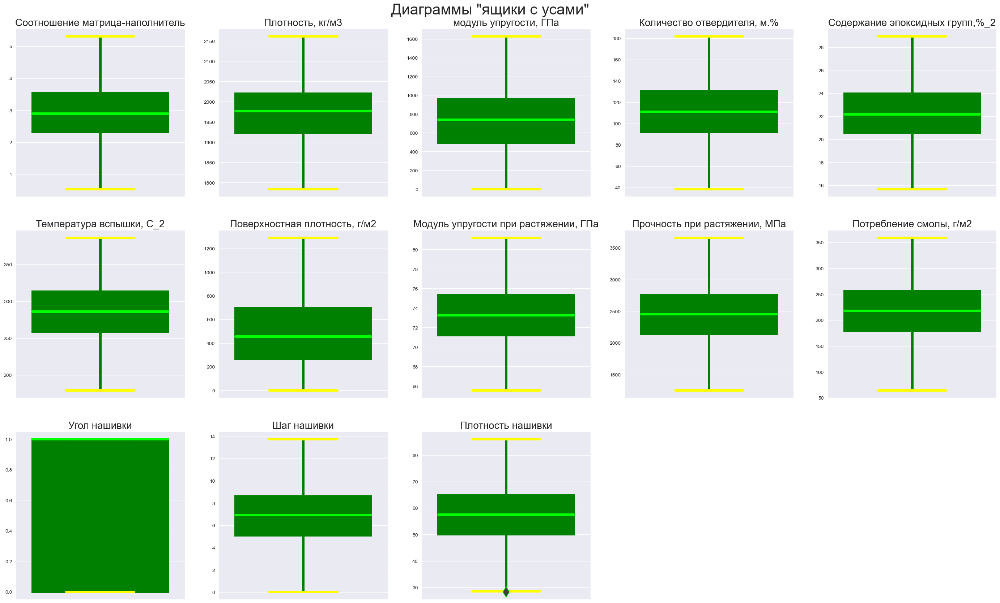

In [54]:
# Ящики с усами
a = 5 # количество строк
b = 5 # количество столцбцов
c = 1 # инициализация plot counter

plt.figure(figsize=(35,35))
plt.suptitle('Диаграммы "ящики с усами"', y = 0.9 ,
             fontsize = 30)
for col in df.columns:
    plt.subplot(a, b, c)
    #plt.figure(figsize=(7,5))
    sns.boxplot(data = df, y = df[col], fliersize = 15, linewidth = 5, boxprops = dict(facecolor = 'y', color = 'g'), medianprops = dict(color = 'lime'), whiskerprops = dict(color = "g"), capprops = dict(color="yellow"), flierprops = dict(color = "y", markeredgecolor = "lime"))
    plt.ylabel(None)
    plt.title(col, size = 20)
    #plt.show()
    c += 1

In [55]:
df.skew()#ассиметрия по всем колонкам. Никак не использовал в дальнейшем.

Соотношение матрица-наполнитель         0.058917
Плотность, кг/м3                        0.002822
модуль упругости, ГПа                   0.070329
Количество отвердителя, м.%            -0.120959
Содержание эпоксидных групп,%_2         0.027075
Температура вспышки, С_2                0.007521
Поверхностная плотность, г/м2           0.357603
Модуль упругости при растяжении, ГПа    0.103130
Прочность при растяжении, МПа           0.063061
Потребление смолы, г/м2                -0.026155
Угол нашивки                           -0.047097
Шаг нашивки                             0.051818
Плотность нашивки                      -0.047335
dtype: float64

In [56]:
df.kurt()# эксцесс по всем колонкам. Никак не использовал в дальнейшем

Соотношение матрица-наполнитель        -0.308087
Плотность, кг/м3                       -0.215627
модуль упругости, ГПа                  -0.373035
Количество отвердителя, м.%            -0.249075
Содержание эпоксидных групп,%_2        -0.318102
Температура вспышки, С_2               -0.307474
Поверхностная плотность, г/м2          -0.548925
Модуль упругости при растяжении, ГПа   -0.308785
Прочность при растяжении, МПа          -0.217998
Потребление смолы, г/м2                -0.398795
Угол нашивки                           -2.002064
Шаг нашивки                            -0.114436
Плотность нашивки                      -0.193072
dtype: float64

In [57]:
#Проверим сумму выбросов по каждому из столбцов
df.isnull().sum()

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   1
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    1
Прочность при растяжении, МПа           4
Потребление смолы, г/м2                 1
Угол нашивки                            0
Шаг нашивки                             0
Плотность нашивки                       3
dtype: int64

In [58]:
#И снова удаляем строки, которые содержат выбросы
df = df.dropna(axis=0)

In [59]:
#Третий раз проверим сумму выбросов по каждому столбцу
df.isnull().sum()

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           0
Потребление смолы, г/м2                 0
Угол нашивки                            0
Шаг нашивки                             0
Плотность нашивки                       0
dtype: int64

In [60]:
#Просмотрим информацию о нашем датасете после еще одного удаления пропусков. Видим, что строк стало еще меньше
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 926 entries, 1 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       926 non-null    float64
 1   Плотность, кг/м3                      926 non-null    float64
 2   модуль упругости, ГПа                 926 non-null    float64
 3   Количество отвердителя, м.%           926 non-null    float64
 4   Содержание эпоксидных групп,%_2       926 non-null    float64
 5   Температура вспышки, С_2              926 non-null    float64
 6   Поверхностная плотность, г/м2         926 non-null    float64
 7   Модуль упругости при растяжении, ГПа  926 non-null    float64
 8   Прочность при растяжении, МПа         926 non-null    float64
 9   Потребление смолы, г/м2               926 non-null    float64
 10  Угол нашивки                          926 non-null    int32  
 11  Шаг нашивки       

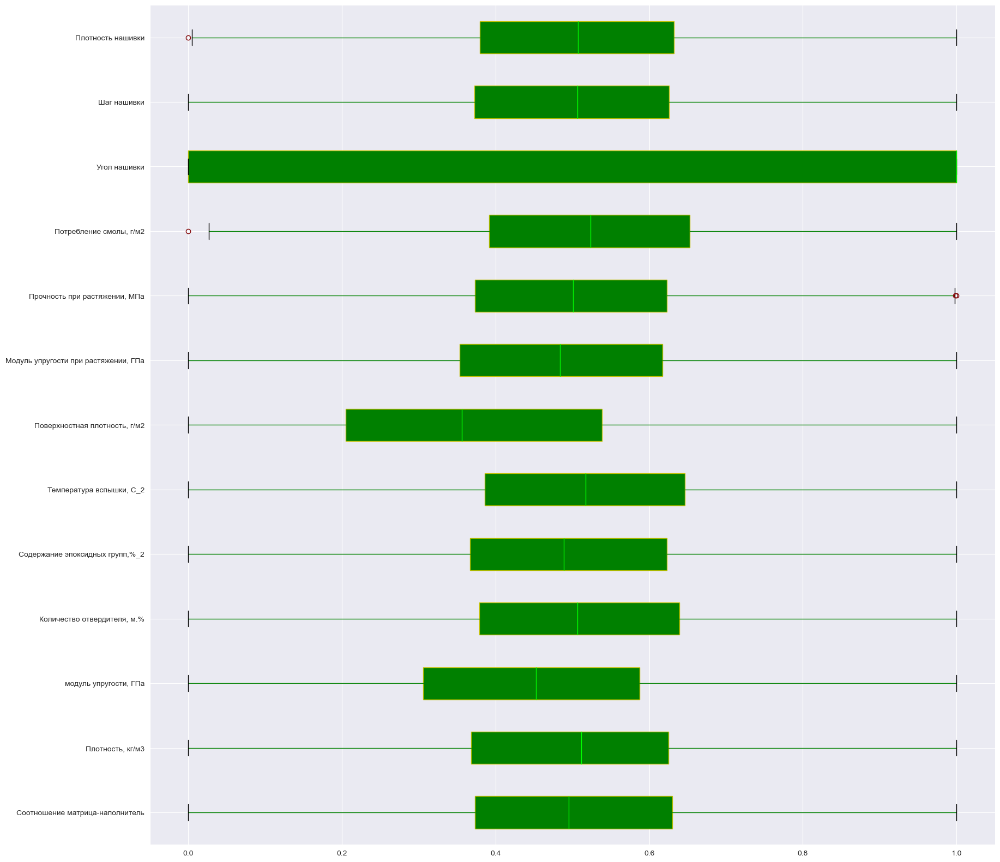

In [61]:
#В третий раз построим на "ящики с усами"
scaler = MinMaxScaler()
scaler.fit(df)
plt.figure(figsize = (20, 20))
#Выводим "ящики"
plt.boxplot(pd.DataFrame(scaler.transform(df)), labels = df.columns,patch_artist = True, meanline = True, vert = False, boxprops = dict(facecolor = 'g', color = 'y'),medianprops = dict(color = 'lime'), whiskerprops = dict(color = "g"), capprops = dict(color = "black"), flierprops = dict(color = "y", markeredgecolor = "maroon"))
plt.show()

И снова видим, что выбросы остались в некоторых исходных данных

In [62]:
# Повторяем процедуру с выбросами еще раз
for i in column_list_drop:
    q75, q25 = np.percentile(df.loc[:,i],[75, 25])
    intr_qr = q75 - q25
    max = q75 + (1.5*intr_qr)
    min = q25 - (1.5*intr_qr)
    df.loc[df[i] < min,i] = np.nan
    df.loc[df[i] > max,i] = np.nan
    
df.isnull().sum()
df = df.dropna(axis=0)
df.isnull().sum()

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           0
Потребление смолы, г/м2                 0
Угол нашивки                            0
Шаг нашивки                             0
Плотность нашивки                       0
dtype: int64

In [63]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 922 entries, 1 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       922 non-null    float64
 1   Плотность, кг/м3                      922 non-null    float64
 2   модуль упругости, ГПа                 922 non-null    float64
 3   Количество отвердителя, м.%           922 non-null    float64
 4   Содержание эпоксидных групп,%_2       922 non-null    float64
 5   Температура вспышки, С_2              922 non-null    float64
 6   Поверхностная плотность, г/м2         922 non-null    float64
 7   Модуль упругости при растяжении, ГПа  922 non-null    float64
 8   Прочность при растяжении, МПа         922 non-null    float64
 9   Потребление смолы, г/м2               922 non-null    float64
 10  Угол нашивки                          922 non-null    int32  
 11  Шаг нашивки       

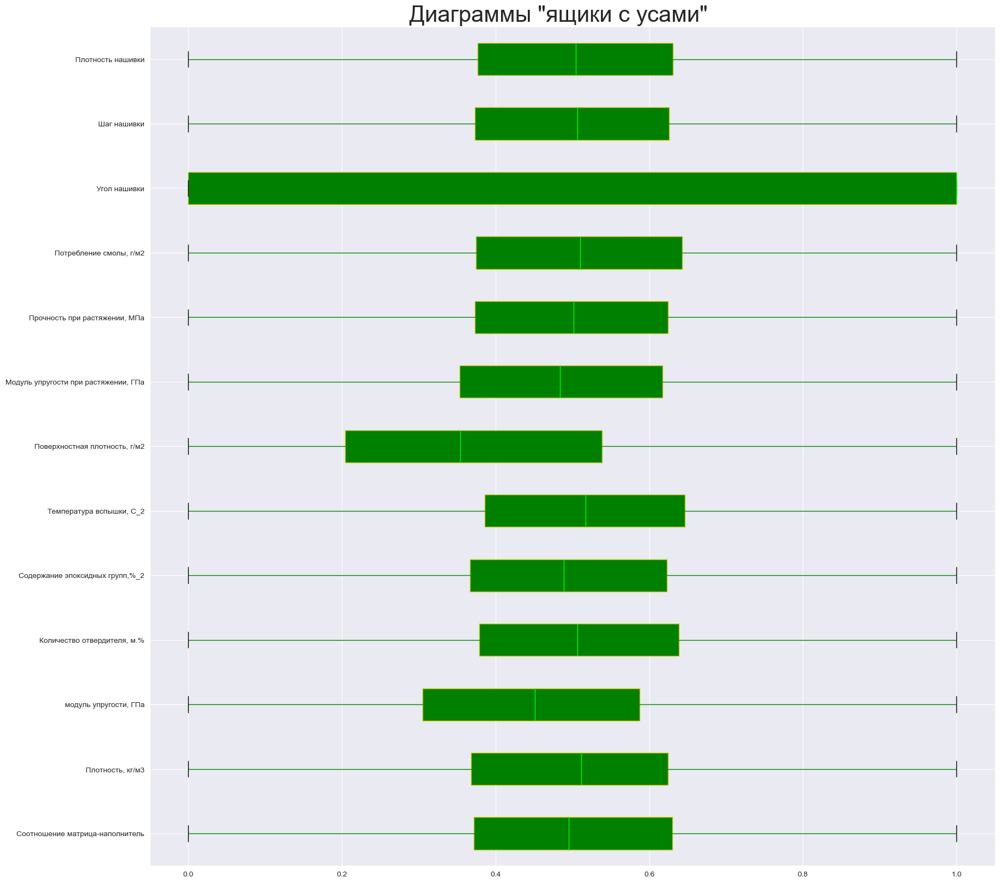

In [64]:
scaler = MinMaxScaler()
scaler.fit(df)
plt.figure(figsize = (20, 20))
plt.suptitle('Диаграммы "ящики с усами"', y = 0.9 ,
             fontsize = 30)
plt.boxplot(pd.DataFrame(scaler.transform(df)), labels = df.columns,patch_artist = True, meanline = True, vert = False, boxprops = dict(facecolor = 'g', color = 'y'),medianprops = dict(color = 'lime'), whiskerprops = dict(color = "g"), capprops = dict(color = "black"), flierprops = dict(color = "y", markeredgecolor = "maroon"))
plt.show()

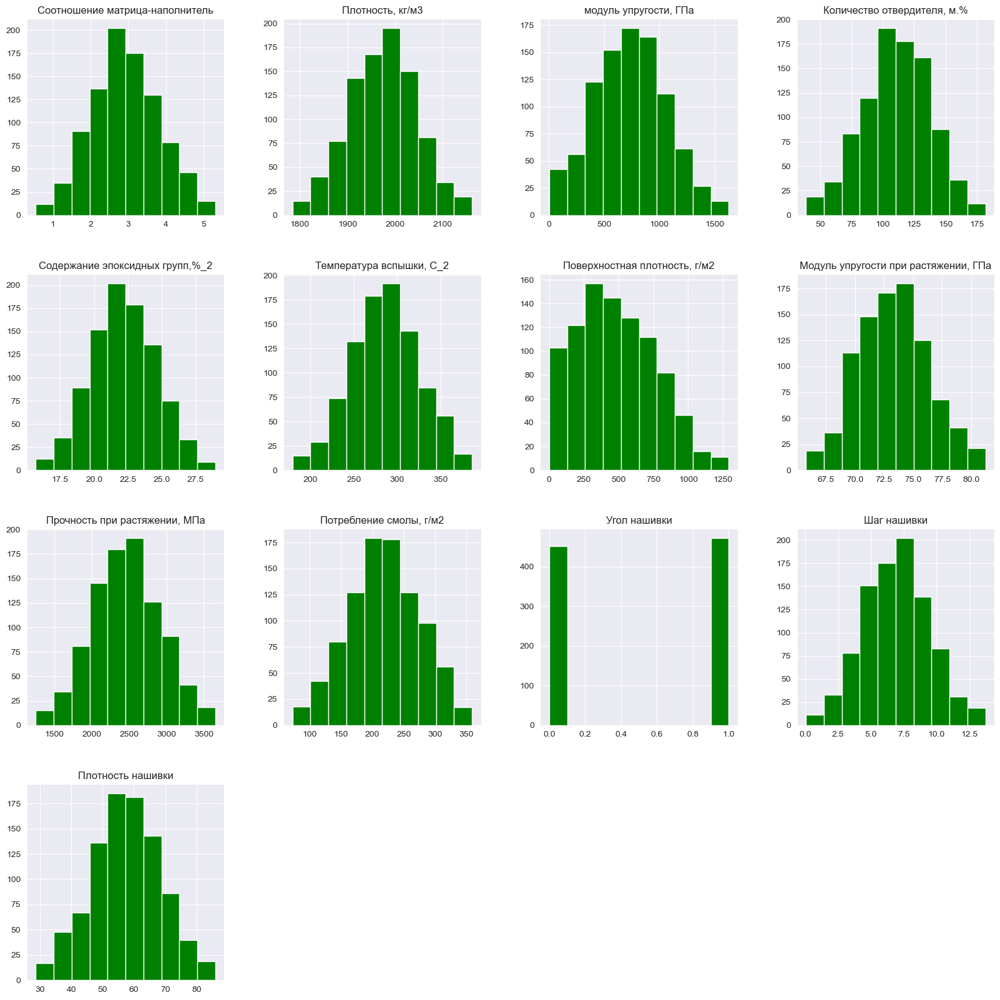

In [65]:
# Построим гистограммы распределения каждой из переменных без нормализации
df.hist(figsize = (20,20), color = "g")
plt.show()

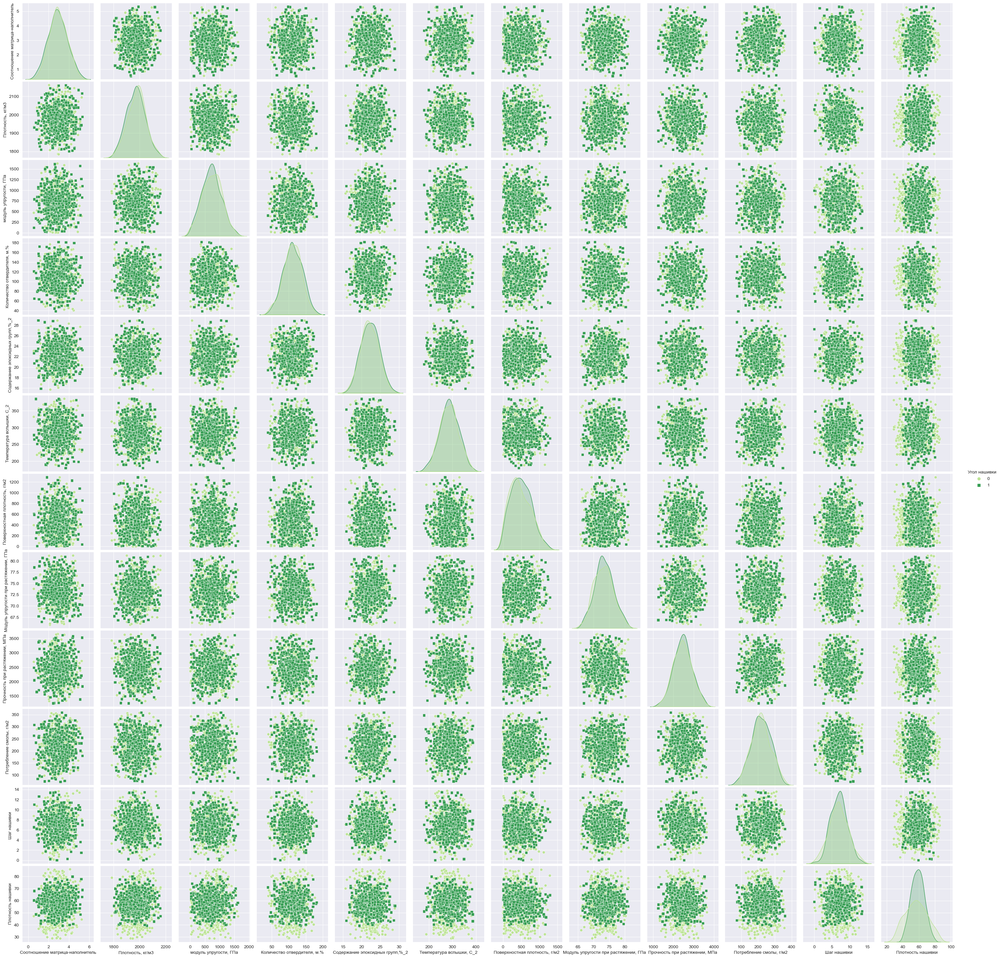

In [67]:
sns.set_style('darkgrid')
sns.pairplot(df, hue = 'Угол нашивки', markers = ["o", "s"], diag_kind = 'auto', palette = 'YlGn')

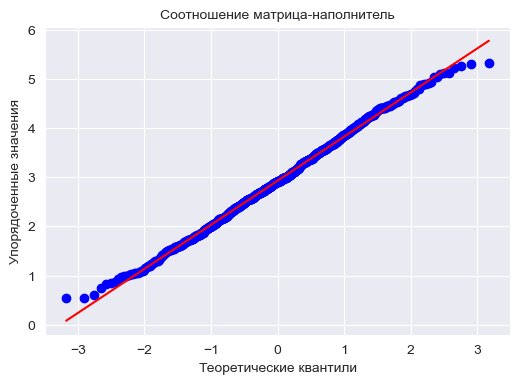

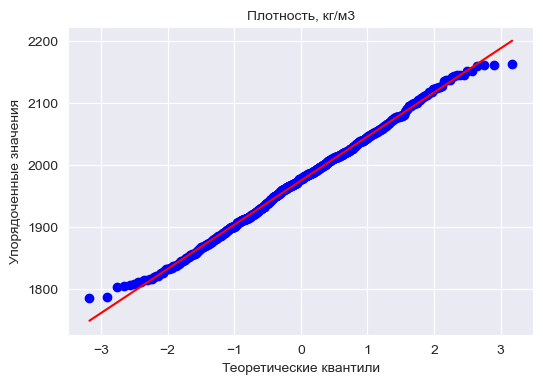

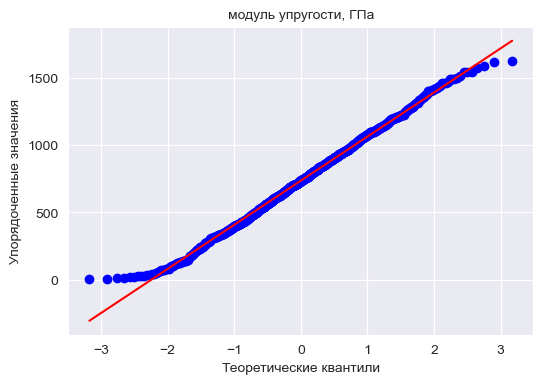

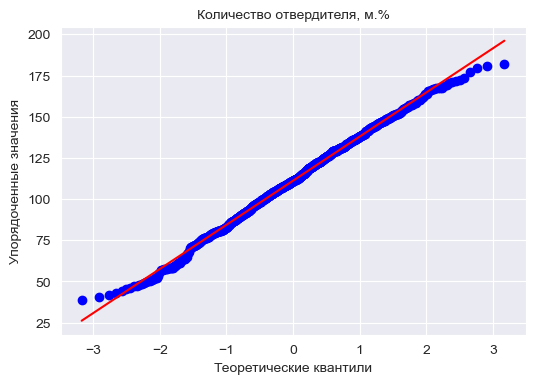

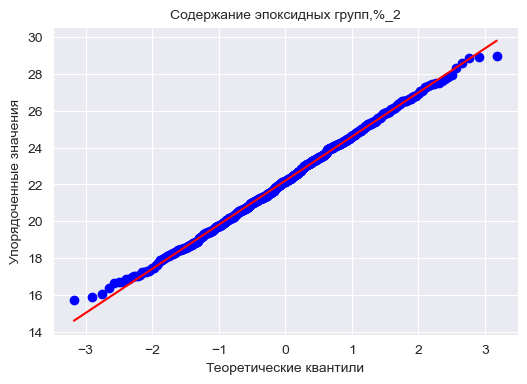

...

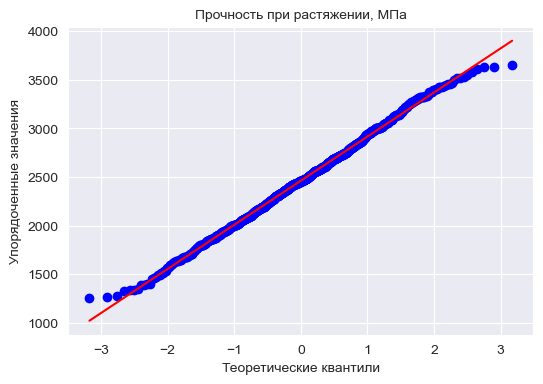

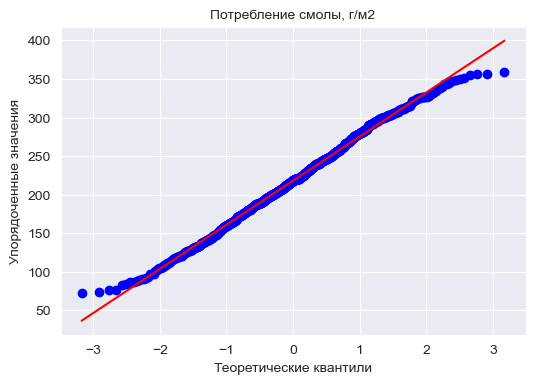

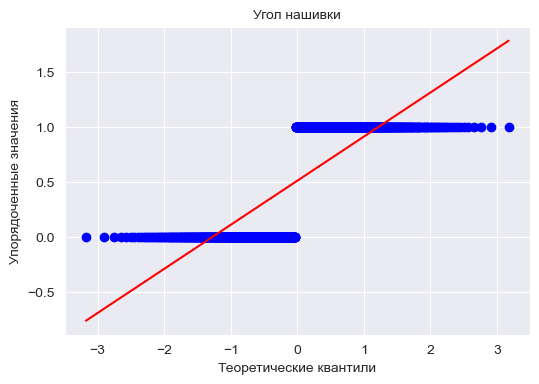

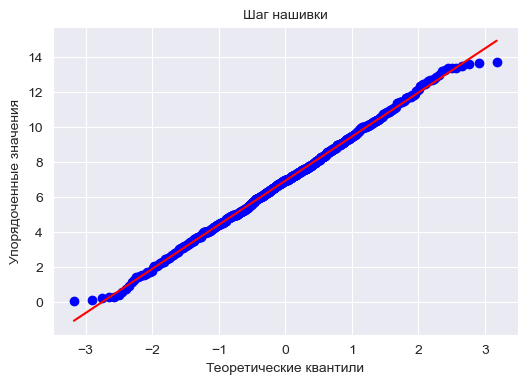

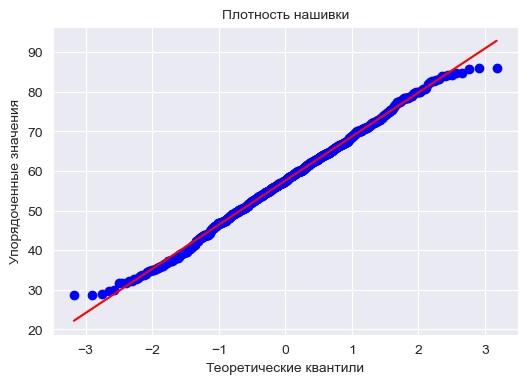

In [68]:
for i in df.columns:
    plt.figure(figsize = (6, 4))
    res = stats.probplot(df[i], plot = plt)
    plt.title(i, fontsize = 10)
    plt.xlabel("Теоретические квантили", fontsize = 10)
    plt.ylabel("Упорядоченные значения", fontsize = 10)
    plt.show()

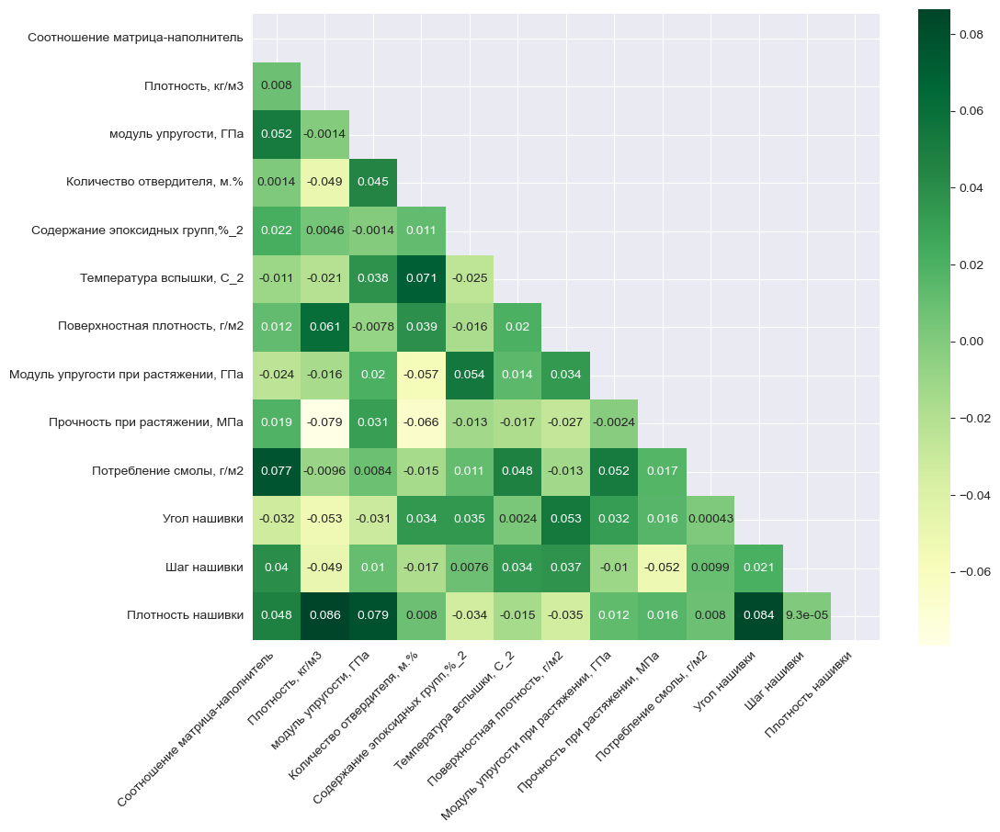

In [69]:
#Визуализация корреляционной матрицы с помощью тепловой карты
mask = np.triu(df.corr())
# Создаем полотно для отображения большого графика
f, ax = plt.subplots(figsize=(11, 9))
# # Визуализируем данные кореляции и создаем цветовую политру
sns.heatmap(df.corr(), mask = mask, annot = True, square = True, cmap = 'YlGn')
plt.xticks(rotation = 45, ha = 'right')
plt.show()

In [70]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 922 entries, 1 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       922 non-null    float64
 1   Плотность, кг/м3                      922 non-null    float64
 2   модуль упругости, ГПа                 922 non-null    float64
 3   Количество отвердителя, м.%           922 non-null    float64
 4   Содержание эпоксидных групп,%_2       922 non-null    float64
 5   Температура вспышки, С_2              922 non-null    float64
 6   Поверхностная плотность, г/м2         922 non-null    float64
 7   Модуль упругости при растяжении, ГПа  922 non-null    float64
 8   Прочность при растяжении, МПа         922 non-null    float64
 9   Потребление смолы, г/м2               922 non-null    float64
 10  Угол нашивки                          922 non-null    int32  
 11  Шаг нашивки       

In [71]:
# Посмотрим на средние и медианные знчения датасета после выбросов 
mean_and_50 = df.describe()
mean_and_50.loc[['mean', '50%']]
# Убедимся, что после удаления выбросов среднее и медианное значение остались в пределах предыдущих значений

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Угол нашивки,Шаг нашивки,Плотность нашивки
mean,2.927964,1974.118744,736.119982,111.136066,22.200570,286.181128,482.429070,73.303464,2461.491315,218.048059,0.510846,6.931939,57.562887
50%,2.907832,1977.321002,736.178435,111.162090,22.177681,286.220763,457.732246,73.247594,2455.974462,218.697660,1.000000,6.972862,57.584225


In [72]:
df_norm = df.copy()

In [73]:
df_norm.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 922 entries, 1 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       922 non-null    float64
 1   Плотность, кг/м3                      922 non-null    float64
 2   модуль упругости, ГПа                 922 non-null    float64
 3   Количество отвердителя, м.%           922 non-null    float64
 4   Содержание эпоксидных групп,%_2       922 non-null    float64
 5   Температура вспышки, С_2              922 non-null    float64
 6   Поверхностная плотность, г/м2         922 non-null    float64
 7   Модуль упругости при растяжении, ГПа  922 non-null    float64
 8   Прочность при растяжении, МПа         922 non-null    float64
 9   Потребление смолы, г/м2               922 non-null    float64
 10  Угол нашивки                          922 non-null    int32  
 11  Шаг нашивки       

# Предобработка данных.

Нормализуем данные

У нас в основном количественные признаки, поэтому можно применить нормализацию (приведение в диапазон от 0 до 1) или стандартизацию (приведение к матожиданию 0, стандартному отклонению 1). Т.к. это в том числе учебная работа, то используем и нормализацию, и стандартизацию.

Этап предобработки данных нужен нам и для введенных данных в будущем приложении, которое явится результатом нашей работы.

<Axes: ylabel='Density'>

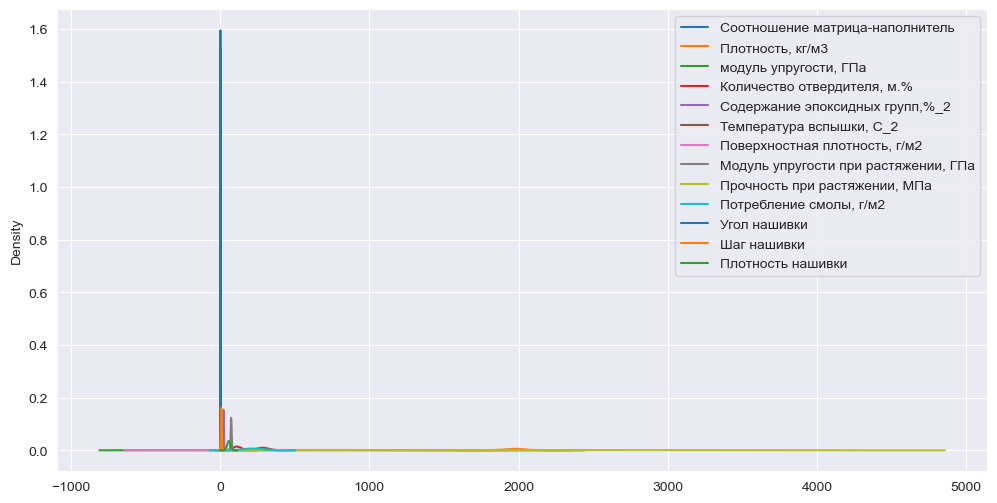

In [74]:
# На данный момент в нашем датасете всего 922 строки. Они все без выбросов, пропущенных значений, все имеют int или float. 
fig, ax = plt.subplots(figsize = (12, 6))
df_norm.plot(kind = 'kde', ax = ax)
# Оценка плотности ядра показывает, что наши данные находятся в разных диапазонах. А в связи с тем, что диапазоны очень разные, данные нужно нормализовать. Можем приступать к нормализации данных.

In [75]:
#Нормализуем данные с помощью MinMaxScaler() 
scaler = preprocessing.MinMaxScaler()
col = df.columns
result = scaler.fit_transform(df)

df_minmax_n = pd.DataFrame(result, columns = col)
df_minmax_n.describe()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Угол нашивки,Шаг нашивки,Плотность нашивки
count,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000
mean,0.499412,0.502904,0.451341,0.506200,0.490578,0.516739,0.373295,0.487343,0.503776,0.507876,0.510846,0.503426,0.503938
std,0.187858,0.188395,0.201534,0.186876,0.180548,0.190721,0.217269,0.196366,0.188668,0.199418,0.500154,0.183587,0.193933
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.371909,0.368184,0.305188,0.378514,0.366571,0.386228,0.204335,0.353512,0.373447,0.374647,0.000000,0.372844,0.376869
50%,0.495189,0.511396,0.451377,0.506382,0.488852,0.516931,0.354161,0.483718,0.501481,0.510143,1.000000,0.506414,0.504310
75%,0.629774,0.624719,0.587193,0.638735,0.623046,0.646553,0.538397,0.617568,0.624299,0.642511,1.000000,0.626112,0.630842
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [76]:
#Нормализуем данные с помощью Normalizer()

normalizer = Normalizer()
res = normalizer.fit_transform(df)
df_norm_n = pd.DataFrame(res, columns = df.columns)
df_norm_n

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Угол нашивки,Шаг нашивки,Плотность нашивки
0,0.000499,0.545436,0.198490,0.013434,0.006381,0.076473,0.056424,0.018808,0.806064,0.059111,0.000000,0.001075,0.016121
1,0.000499,0.545011,0.198335,0.034634,0.005705,0.080543,0.056380,0.018793,0.805435,0.059065,0.000000,0.001342,0.012618
2,0.000744,0.544829,0.202097,0.030022,0.005976,0.076388,0.056362,0.018787,0.805167,0.059046,0.000000,0.001342,0.015298
3,0.000746,0.539271,0.201687,0.030161,0.006004,0.076742,0.056623,0.018874,0.808906,0.059320,0.000000,0.001348,0.016178
4,0.000699,0.519919,0.219673,0.030449,0.006062,0.077475,0.057164,0.019055,0.816627,0.059886,0.000000,0.001361,0.019055
...,...,...,...,...,...,...,...,...,...,...,...,...,...
917,0.000700,0.601751,0.281397,0.026816,0.006203,0.100115,0.064488,0.022531,0.735908,0.038535,0.000308,0.002798,0.014494
918,0.001078,0.641795,0.139227,0.045701,0.006136,0.079584,0.109777,0.022828,0.738938,0.036856,0.000313,0.003308,0.016827
919,0.000953,0.573123,0.121122,0.032118,0.006961,0.072186,0.215067,0.021716,0.773775,0.068752,0.000291,0.001209,0.019652
920,0.001192,0.664667,0.238453,0.045473,0.006190,0.088689,0.206291,0.023812,0.666248,0.063394,0.000322,0.002030,0.018736


## Стандартизируем данные

In [77]:
X1 = df_minmax_n.copy()
X2 = df_norm_n.copy()

In [78]:
df_std_X1 = preprocessing.StandardScaler().fit(X1)
df_standart_X1 = df_std_X1.transform(X1)
df_standart_1 = pd.DataFrame(df_standart_X1)

<Axes: ylabel='Density'>

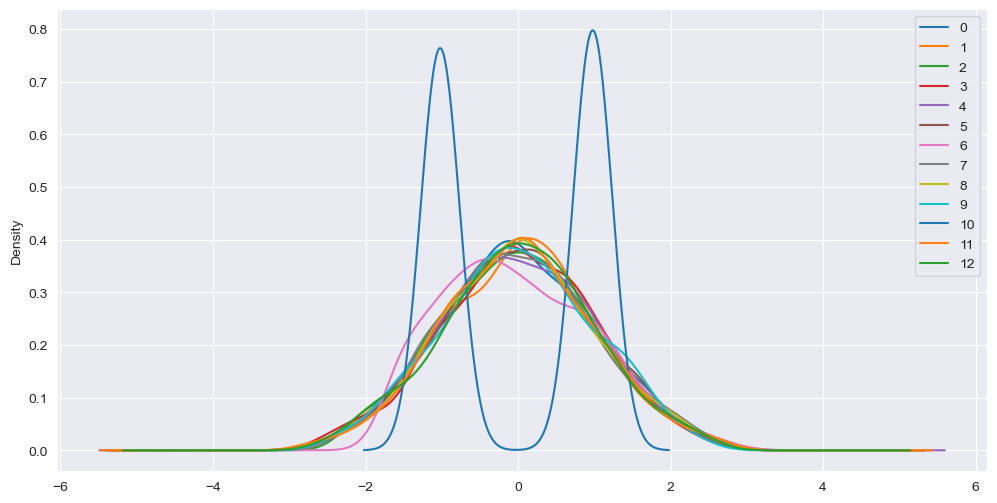

In [79]:
fig, ax = plt.subplots(figsize = (12, 6))
df_standart_1.plot(kind = 'kde', ax = ax)

In [80]:
df_standart_1

,0,1,2,3,4,5,6,7,8,9,10,11,12
0,-1.196467,0.787037,0.007992,-2.286425,0.647585,-0.039740,-0.971971,-1.092335,1.187925,0.034181,-1.021932,-1.166792,0.219240
1,-1.196467,0.787037,0.007992,0.668092,-0.397291,0.350738,-0.971971,-1.092335,1.187925,0.034181,-1.021932,-0.768833,-0.950227
2,-0.175012,0.787037,0.051553,0.027074,0.028123,-0.039740,-0.971971,-1.092335,1.187925,0.034181,-1.021932,-0.768833,-0.050637
3,-0.178825,0.364514,0.036283,0.027074,0.028123,-0.039740,-0.971971,-1.092335,1.187925,0.034181,-1.021932,-0.768833,0.219240
4,-0.400390,-0.903054,0.216474,0.027074,0.028123,-0.039740,-0.971971,-1.092335,1.187925,0.034181,-1.021932,-0.768833,1.118831
...,...,...,...,...,...,...,...,...,...,...,...,...,...
917,-0.733662,-0.310284,0.539767,-0.902956,-0.868217,0.979545,-0.974830,-0.070267,-0.163679,-1.629244,0.978538,0.853400,-0.948449
918,0.576611,1.069974,-0.889924,1.303201,-1.087006,-0.811326,-0.470122,-0.126524,-0.223019,-1.756683,0.978538,1.446055,-0.342933
919,0.394018,-0.024589,-0.975122,-0.022536,0.734311,-0.958342,0.919470,0.473140,0.444312,0.324984,0.978538,-1.102660,0.905599
920,0.868603,1.305328,0.016356,1.131763,-1.234469,-0.263996,0.567419,0.244441,-0.859827,-0.366368,0.978538,-0.246233,0.062808


In [81]:
df_std_X2 = preprocessing.StandardScaler().fit(X2)
df_standart_X2 = df_std_X2.transform(X2)
df_standart_2 = pd.DataFrame(df_standart_X2)

<Axes: ylabel='Density'>

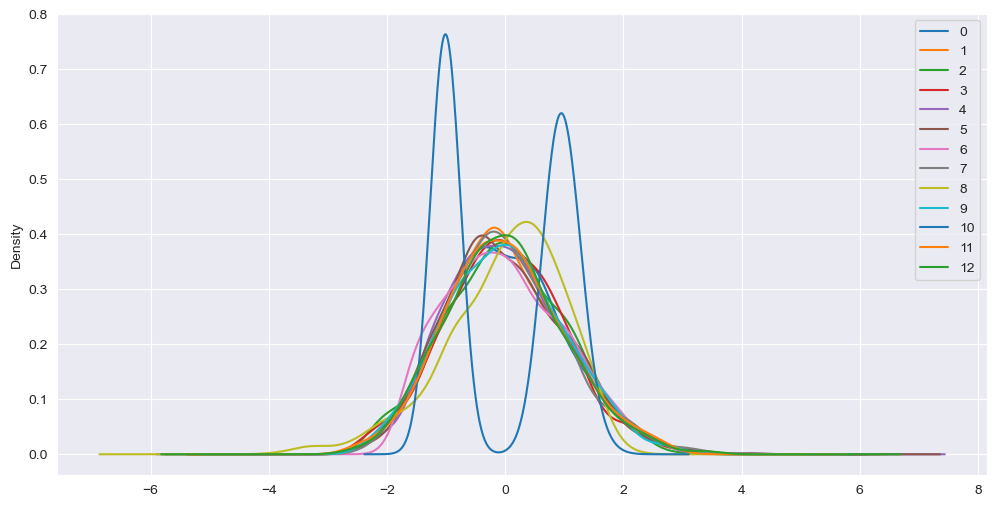

In [82]:
fig, ax = plt.subplots(figsize = (12, 6))
df_standart_2.plot(kind = 'kde', ax=ax)

In [83]:
df_standart_2

,0,1,2,3,4,5,6,7,8,9,10,11,12
0,-1.350498,-0.800587,-0.225645,-2.254951,-0.330124,-0.671638,-1.055275,-1.355362,1.083430,-0.367448,-1.010316,-1.270050,-0.337462
1,-1.351860,-0.807188,-0.227264,0.108938,-0.995822,-0.400917,-1.055800,-1.361270,1.074341,-0.369941,-1.010316,-0.938747,-1.261078
2,-0.493829,-0.810003,-0.187937,-0.405305,-0.728743,-0.677298,-1.056024,-1.363790,1.070465,-0.371004,-1.010316,-0.939301,-0.554499
3,-0.484962,-0.896227,-0.192219,-0.389758,-0.701418,-0.653706,-1.052902,-1.328659,1.124504,-0.356180,-1.010316,-0.931586,-0.322473
4,-0.648927,-1.196396,-0.004208,-0.357656,-0.644997,-0.604992,-1.046455,-1.256122,1.236081,-0.325573,-1.010316,-0.915657,0.436003
...,...,...,...,...,...,...,...,...,...,...,...,...,...
917,-0.646503,0.072936,0.641033,-0.762769,-0.505500,0.900672,-0.959086,0.143638,0.069576,-1.479779,1.005415,0.862968,-0.766453
918,0.676313,0.694067,-0.845152,1.342997,-0.571810,-0.464729,-0.418815,0.263359,0.113365,-1.570525,1.036781,1.493975,-0.151358
919,0.239190,-0.371131,-1.034407,-0.171548,0.241010,-0.956746,0.837232,-0.184553,0.616810,0.153718,0.889772,-1.103709,0.593392
920,1.073279,1.048848,0.192114,1.317553,-0.518818,0.140773,0.732541,0.659236,-0.937103,-0.135918,1.092595,-0.087233,0.352074


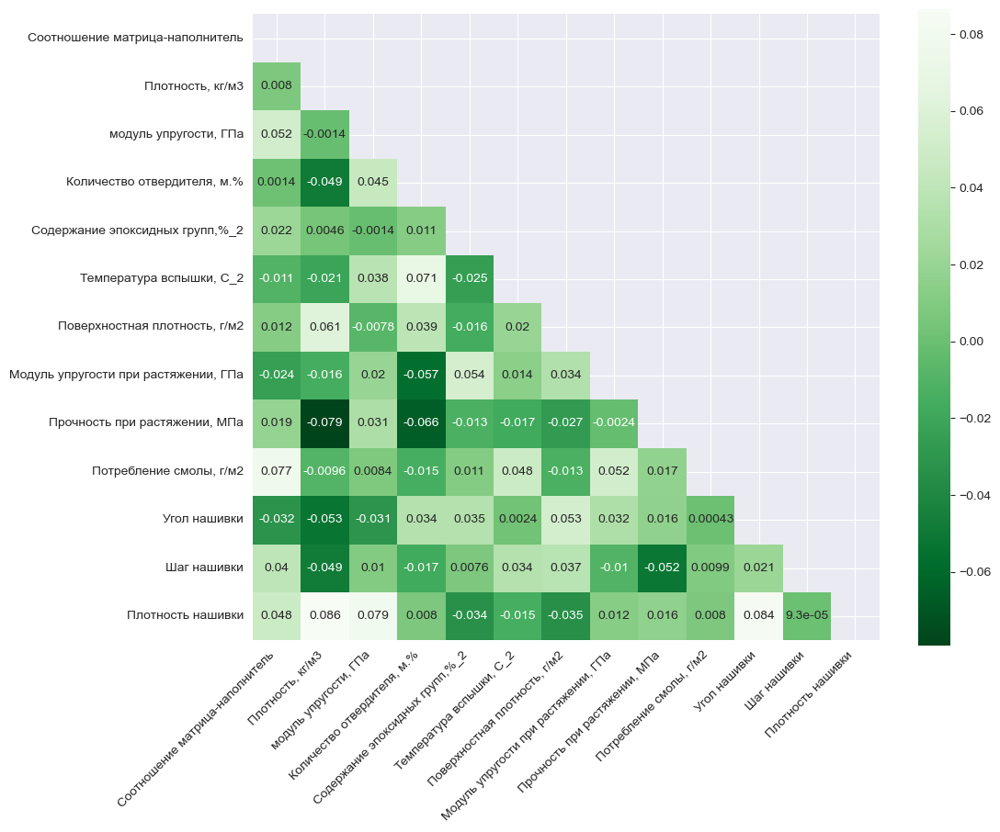

In [84]:
mask = np.triu(X1.corr())
f, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(X1.corr(), mask=mask, annot=True, square=True, cmap='Greens_r')
plt.xticks(rotation=45, ha='right')
plt.show()

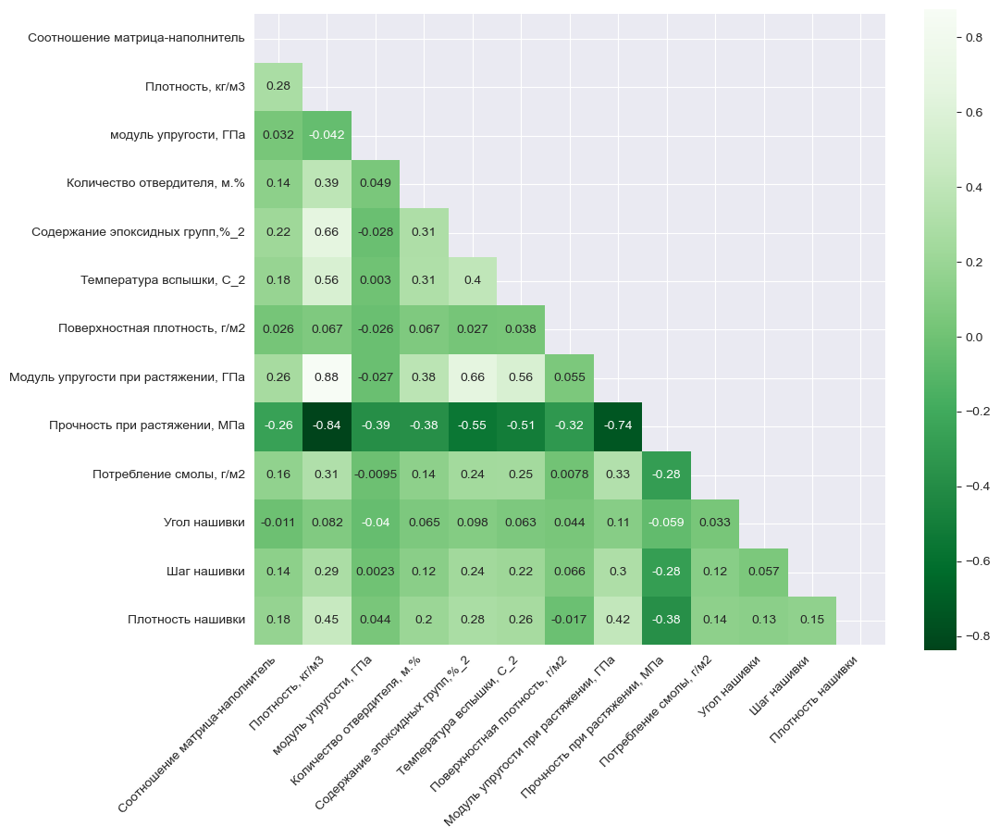

In [85]:
mask = np.triu(X2.corr())
f, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(X2.corr(), mask=mask, annot=True, square=True, cmap='Greens_r')
plt.xticks(rotation=45, ha='right')
plt.show()

In [86]:
df_norm_n.describe()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Угол нашивки,Шаг нашивки,Плотность нашивки
count,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000
mean,0.000885,0.597049,0.220075,0.033657,0.006717,0.086572,0.144885,0.022174,0.731093,0.065909,0.000155,0.002101,0.017401
std,0.000286,0.064504,0.095713,0.008973,0.001016,0.015045,0.083872,0.002485,0.069235,0.018509,0.000153,0.000808,0.003795
min,0.000163,0.444650,0.000709,0.011339,0.004113,0.049402,0.000230,0.016108,0.463136,0.021630,0.000000,0.000011,0.007195
25%,0.000685,0.552643,0.150901,0.027607,0.005990,0.076193,0.080748,0.020407,0.688177,0.052457,0.000000,0.001543,0.014860
50%,0.000872,0.592130,0.219805,0.033559,0.006654,0.085003,0.140105,0.021973,0.740666,0.065577,0.000244,0.002053,0.017293
75%,0.001068,0.640228,0.289231,0.039565,0.007346,0.096585,0.204309,0.023759,0.780691,0.077899,0.000301,0.002630,0.019756
max,0.001803,0.824241,0.525102,0.062919,0.010887,0.147961,0.414371,0.030620,0.877580,0.122973,0.000419,0.004519,0.030927


In [87]:
df_minmax_n.describe()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Угол нашивки,Шаг нашивки,Плотность нашивки
count,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000
mean,0.499412,0.502904,0.451341,0.506200,0.490578,0.516739,0.373295,0.487343,0.503776,0.507876,0.510846,0.503426,0.503938
std,0.187858,0.188395,0.201534,0.186876,0.180548,0.190721,0.217269,0.196366,0.188668,0.199418,0.500154,0.183587,0.193933
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.371909,0.368184,0.305188,0.378514,0.366571,0.386228,0.204335,0.353512,0.373447,0.374647,0.000000,0.372844,0.376869
50%,0.495189,0.511396,0.451377,0.506382,0.488852,0.516931,0.354161,0.483718,0.501481,0.510143,1.000000,0.506414,0.504310
75%,0.629774,0.624719,0.587193,0.638735,0.623046,0.646553,0.538397,0.617568,0.624299,0.642511,1.000000,0.626112,0.630842
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


## Разработка и обучение нескольких моделей для прогноза прочности при растяжении

Данные в нашем итоговом датасете в основном непрерывные и на ум приходит сразу решение данной задачи с использованием регрессионных моделей.
Но попарные графики рассеивания точек и тепловая карта не дают нам реальной взаимосвязи и возможности прямого прогнозирования, 
поэтому будем использовать и категориальные подходы к прогнозированию (например, попробуем метод ближайших соседей) 
или обучение со скрытыми слоями, чтобы выявить дополнительные взаимосвязи.

Задача ВКР на этом этапе звучит так: "При построении моделей провести поиск гиперпараметров модели с помощью поиска по сетке с перекрестной проверкой, количество блоков равно 10.

После всех подготовительных работ переходим к процессу создания, обучения моделей. Мы будем использовать в Python библиотеку Scikit-Learn. В качестве базового уровня предскажем медианное значение цели на обучающем наборе для всех примеров в тестовом наборе. В качестве метрики возьмём среднюю абсолютную ошибку (mae) в прогнозах. Для обучения используем 70 % данных, а для тестирования — 30 %.

In [88]:
#разбиваем на тестовую, тренировочную выборки, выделяя предикторы и целевые переменные
x_train_1, x_test_1, y_train_1, y_test_1 = train_test_split(
    df_norm_n.loc[:, df_norm_n.columns != 'Прочность при растяжении, МПа'],
    df[['Прочность при растяжении, МПа']],
       test_size = 0.3,
    random_state = 42)

In [89]:
# Проверка правильности разбивки
df_norm_n.shape[0] - x_train_1.shape[0] - x_test_1.shape[0]

0

In [90]:
x_train_1.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Потребление смолы, г/м2",Угол нашивки,Шаг нашивки,Плотность нашивки
481,0.000528,0.589066,0.132149,0.020997,0.006254,0.071450,0.186083,0.020219,0.073037,0.000291,0.002285,0.015563
650,0.000430,0.617300,0.232509,0.027252,0.007346,0.075579,0.081347,0.024837,0.056839,0.000308,0.001350,0.018310
483,0.000580,0.585434,0.170519,0.043402,0.007074,0.096550,0.132807,0.021197,0.041487,0.000295,0.002249,0.018929
355,0.000911,0.545896,0.306130,0.024469,0.006610,0.070488,0.159918,0.018527,0.050148,0.000000,0.001774,0.012540
850,0.000573,0.595720,0.263992,0.034166,0.007519,0.089582,0.095597,0.023521,0.086336,0.000322,0.002765,0.017180


In [91]:
y_train_1

,"Прочность при растяжении, МПа"
552,2641.571967
735,2404.068921
554,2619.854215
403,2793.783901
948,2298.985700
...,...
120,1994.674603
306,2419.732206
959,2758.414767
497,2347.135204


In [92]:
y_test_1

,"Прочность при растяжении, МПа"
360,2167.533030
427,2705.819718
611,2952.839631
336,2305.241225
604,1399.118555
...,...
479,3305.286922
149,2085.866383
561,2461.609016
632,2616.114331


In [93]:
y_train_1.shape

(645, 1)

In [94]:
#Функция для сравнения результатов предсказаний с моделью, выдающей среднее значение по тестовой выборке
def mean_model(y_test_1):
    return [np.mean(y_test_1) for _ in range(len(y_test_1))]
y_1_pred_mean = mean_model(y_test_1)

Проверка различных моделей при стандартных параметрах
Метод опорных векторов - 1 

In [95]:
svr = make_pipeline(StandardScaler(), SVR(kernel = 'rbf', C = 500.0, epsilon = 1.0))
#обучаем модель
svr.fit(x_train_1, np.ravel(y_train_1))
#вычисляем коэффициент детерминации
y_pred_svr=svr.predict(x_test_1)
mae_svr = mean_absolute_error(y_pred_svr, y_test_1)
mse_svr_elast = mean_squared_error(y_test_1,y_pred_svr)
print('Support Vector Regression Results Train:') 
print("Test score: {:.2f}".format(svr.score(x_train_1, y_train_1))) # Скор для тренировочной выборки
print('Support Vector Regression Results:')
print('SVR_MAE:', round(mean_absolute_error(y_test_1, y_pred_svr)))
print('SVR_MAPE: {:.2f}'.format(mean_absolute_percentage_error(y_test_1, y_pred_svr)))
print('SVR_MSE: {:.2f}'.format(mse_svr_elast))
print("SVR_RMSE: {:.2f}".format (np.sqrt(mse_svr_elast)))
print("Test score: {:.2f}".format(svr.score(x_test_1, y_test_1))) # Скор для тестовой выборки

Support Vector Regression Results Train:
Test score: 0.99
Support Vector Regression Results:
SVR_MAE: 78
SVR_MAPE: 0.04
SVR_MSE: 11671.63
SVR_RMSE: 108.04
Test score: 0.95


In [96]:
#Результаты модели, выдающей среднее значение
mse_lin_elast_mean = mean_squared_error(y_test_1, y_1_pred_mean)
print("MAE for mean target: ", mean_absolute_error(y_test_1, y_1_pred_mean))
print("MSE for mean target: ", mse_lin_elast_mean)
print("RMSE for mean target: ", np.sqrt(mse_lin_elast_mean))

MAE for mean target:  368.96801863398946
MSE for mean target:  214046.3755454378
RMSE for mean target:  462.65146227526157


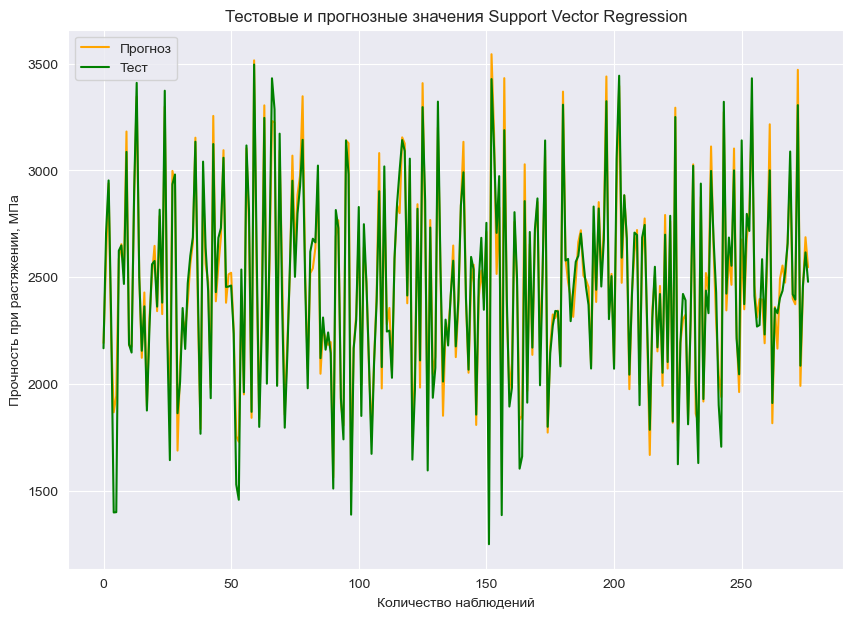

In [97]:
plt.figure(figsize = (10, 7))
plt.title("Тестовые и прогнозные значения Support Vector Regression")
plt.plot(y_pred_svr, label = "Прогноз", color = "orange")
plt.plot(y_test_1.values, label = "Тест", color = "green")
plt.xlabel("Количество наблюдений")
plt.ylabel("Прочность при растяжении, МПа")
plt.legend()
plt.grid(True);

Метод случайного леса - Random Forest Regressor - 2

In [98]:
#построение модели и вузуализация метода случайный лес
rfr = RandomForestRegressor(n_estimators=15,max_depth=7, random_state=33)
rfr.fit(x_train_1, y_train_1.values)
y_pred_forest = rfr.predict(x_test_1)
mae_rfr = mean_absolute_error(y_pred_forest, y_test_1)
mse_rfr_elast = mean_squared_error(y_test_1,y_pred_forest)
print('Random Forest Regressor Results Train:')
print("Test score: {:.2f}".format(rfr.score(x_train_1, y_train_1))) # Скор для тренировочной выборки
print('Random Forest Regressor Results:')
print('RF_MAE: ', round(mean_absolute_error(y_test_1, y_pred_forest)))
print('RF_MAPE: {:.2f}'.format(mean_absolute_percentage_error(y_test_1, y_pred_forest)))
print('RF_MSE: {:.2f}'.format(mse_rfr_elast))
print("RF_RMSE: {:.2f}".format (np.sqrt(mse_rfr_elast)))
print("Test score: {:.2f}".format(rfr.score(x_test_1, y_test_1))) # Скор для тестовой выборки

Random Forest Regressor Results Train:
Test score: 0.98
Random Forest Regressor Results:
RF_MAE:  77
RF_MAPE: 0.03
RF_MSE: 9505.97
RF_RMSE: 97.50
Test score: 0.96


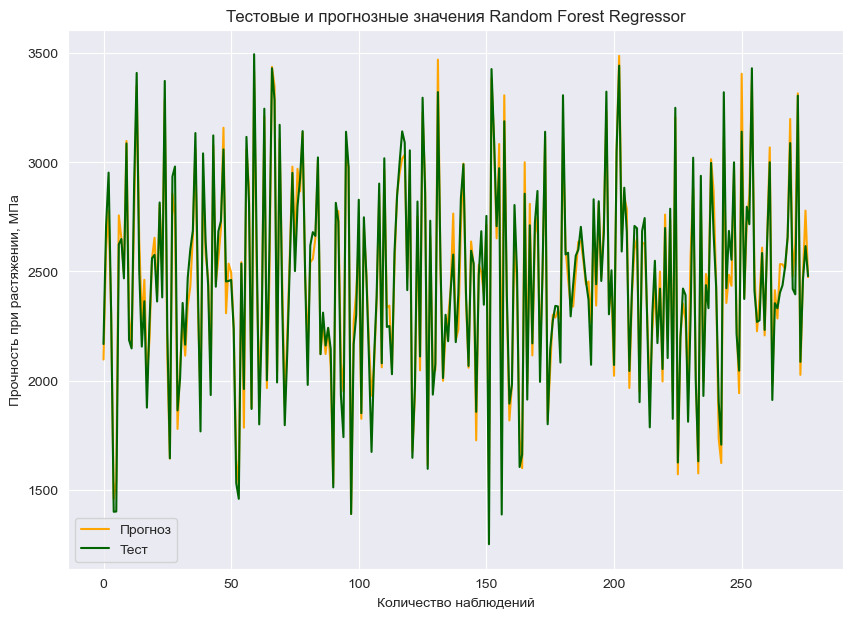

In [99]:
plt.figure(figsize = (10, 7))
plt.title("Тестовые и прогнозные значения Random Forest Regressor")
plt.plot(y_pred_forest, label = "Прогноз", color = "orange")
plt.plot(y_test_1.values, label = "Тест", color = 'darkgreen')
plt.xlabel("Количество наблюдений")
plt.ylabel("Прочность при растяжении, МПа")
plt.legend()
plt.grid(True);

Метод линейной регрессии - Linear Regression - 3

In [101]:
#построение модели и вузуализация Линейной регрессии
lr = LinearRegression()
lr.fit(x_train_1, y_train_1)
y_pred_lr = lr.predict(x_test_1)
mae_lr = mean_absolute_error(y_pred_lr, y_test_1)
mse_lin_elast = mean_squared_error(y_test_1, y_pred_lr)
print('Linear Regression Results Train:') # Скор для тренировочной выборки
print("Test score: {:.2f}".format(lr.score(x_train_1, y_train_1)))
print('Linear Regression Results:')    
print('lr_MAE: ', round(mean_absolute_error(y_test_1, y_pred_lr)))
print('lr_MAPE: {:.2f}'.format(mean_absolute_percentage_error(y_test_1, y_pred_lr)))
print('lr_MSE: {:.2f}'.format(mse_lin_elast))
print("lr_RMSE: {:.2f}".format (np.sqrt(mse_lin_elast)))
print("Test score: {:.2f}".format(lr.score(x_test_1, y_test_1))) # Скор для тестовой выборки

Linear Regression Results Train:
Test score: 0.97
Linear Regression Results:
lr_MAE:  62
lr_MAPE: 0.03
lr_MSE: 6149.31
lr_RMSE: 78.42
Test score: 0.97


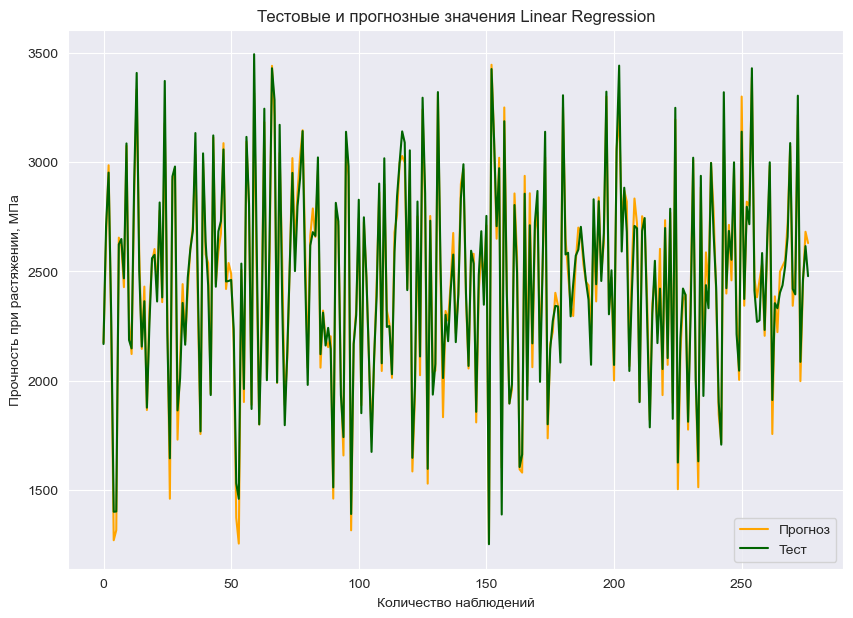

In [102]:
plt.figure(figsize = (10, 7))
plt.title("Тестовые и прогнозные значения Linear Regression")
plt.plot(y_pred_lr, label="Прогноз", color = 'orange')
plt.plot(y_test_1.values, label = "Тест", color = 'darkgreen')
plt.xlabel("Количество наблюдений")
plt.ylabel("Прочность при растяжении, МПа")
plt.legend()
plt.grid(True);

#Линейная регрессия с задачей справилась в 97 % случаев.

Визуализация гистограммы распределения ошибки

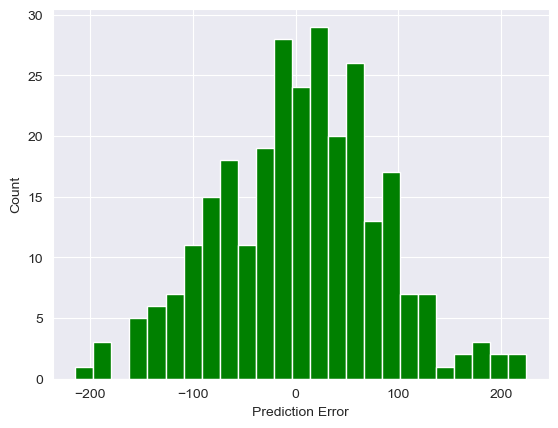

In [103]:
error = y_test_1 - y_pred_lr
plt.hist(error, bins = 25, color = "g")
plt.xlabel('Prediction Error')
_ = plt.ylabel('Count')

Метода градиентного бустинга - Gradient Boosting Regressor - 4 

In [104]:
gbr = make_pipeline(StandardScaler(), GradientBoostingRegressor())
gbr.fit(x_train_1, np.ravel(y_train_1))
y_pred_gbr = gbr.predict(x_test_1)
mae_gbr = mean_absolute_error(y_pred_gbr, y_test_1)
mse_gbr_elast = mean_squared_error(y_test_1,y_pred_gbr)
print('Gradient Boosting Regressor Results Train:')
print("Test score: {:.2f}".format(gbr.score(x_train_1, y_train_1))) # Скор для тренировочной выборки
print('Gradient Boosting Regressor Results:')
print('GBR_MAE: ', round(mean_absolute_error(y_test_1, y_pred_gbr)))
print('GBR_MAPE: {:.2f}'.format(mean_absolute_percentage_error(y_test_1, y_pred_gbr)))
print('GBR_MSE: {:.2f}'.format(mse_gbr_elast))
print("GBR_RMSE: {:.2f}".format (np.sqrt(mse_gbr_elast)))
print("Test score: {:.2f}".format(gbr.score(x_test_1, y_test_1)))# Скор для тестовой выборки

Gradient Boosting Regressor Results Train:
Test score: 0.99
Gradient Boosting Regressor Results:
GBR_MAE:  65
GBR_MAPE: 0.03
GBR_MSE: 6552.10
GBR_RMSE: 80.95
Test score: 0.97


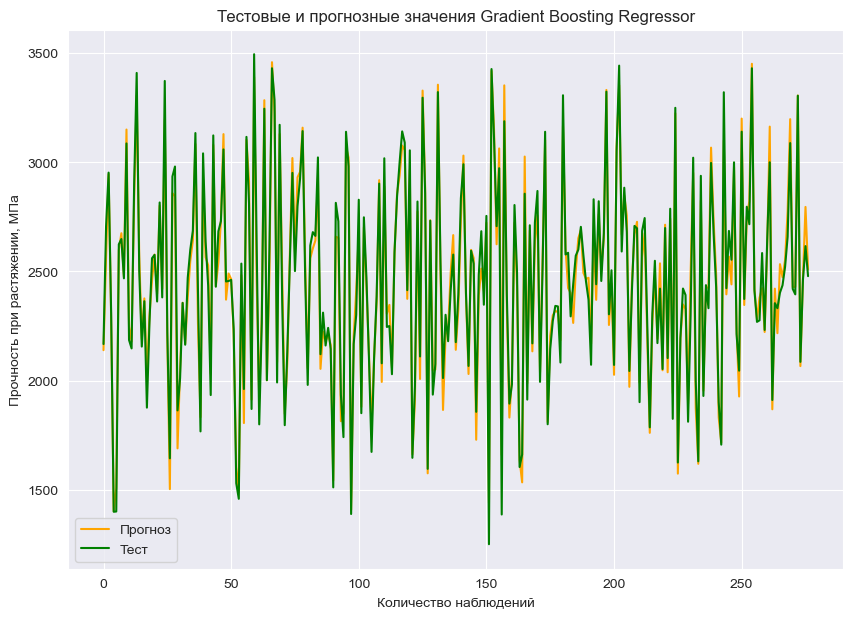

In [105]:
plt.figure(figsize = (10, 7))
plt.title("Тестовые и прогнозные значения Gradient Boosting Regressor")
plt.plot(y_pred_gbr, label = "Прогноз", color = "orange")
plt.plot(y_test_1.values, label = "Тест", color = "green")
plt.xlabel("Количество наблюдений")
plt.ylabel("Прочность при растяжении, МПа")
plt.legend()
plt.grid(True);
#Градиентный бустинг с задачей справился в 97 % случаев.

Метод К ближайших соседей - K Neighbors Regressor - 5

In [106]:
knn = KNeighborsRegressor(n_neighbors=5)
knn.fit(x_train_1, y_train_1)
y_pred_knn = knn.predict(x_test_1)
mae_knr = mean_absolute_error(y_pred_knn, y_test_1)
mse_knn_elast = mean_squared_error(y_test_1,y_pred_knn)
print('K Neighbors Regressor  Results Train:')
print("Test score: {:.2f}".format(knn.score(x_train_1, y_train_1)))# Скор для тренировочной выборки
print('K Neighbors Regressor  Results:')
print('KNN_MAE: ', round(mean_absolute_error(y_test_1, y_pred_knn)))
print('KNN_MAPE: {:.2f}'.format(mean_absolute_percentage_error(y_test_1, y_pred_knn)))
print('KNN_MSE: {:.2f}'.format(mse_knn_elast))
print("KNN_RMSE: {:.2f}".format (np.sqrt(mse_knn_elast)))
print("Test score: {:.2f}".format(knn.score(x_test_1, y_test_1)))# Скор для тестовой выборки

K Neighbors Regressor  Results Train:
Test score: 0.94
K Neighbors Regressor  Results:
KNN_MAE:  102
KNN_MAPE: 0.04
KNN_MSE: 16723.93
KNN_RMSE: 129.32
Test score: 0.92


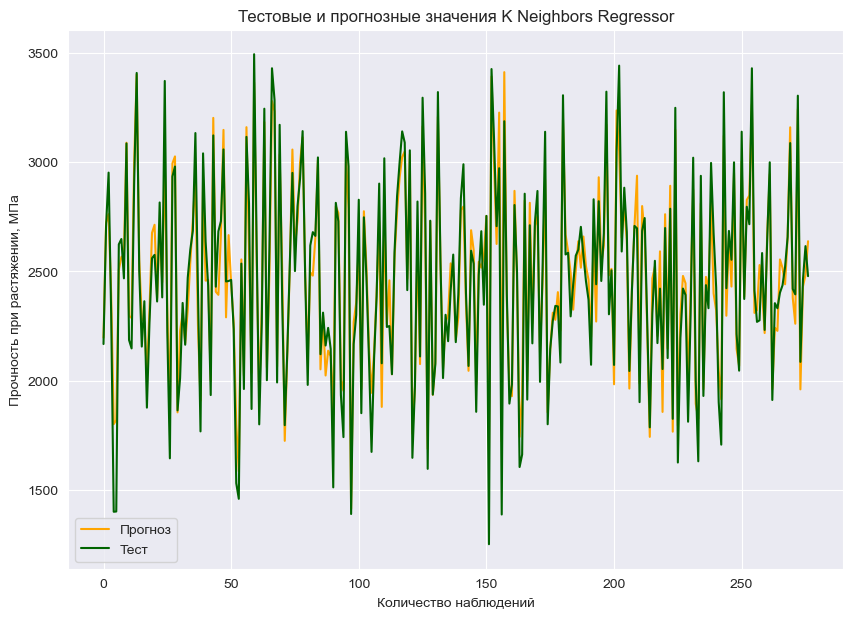

In [107]:
plt.figure(figsize = (10, 7))
plt.title("Тестовые и прогнозные значения K Neighbors Regressor")
plt.plot(y_pred_knn, label = "Прогноз", color = 'orange')
plt.plot(y_test_1.values, label = "Тест", color = 'darkgreen')
plt.xlabel("Количество наблюдений")
plt.ylabel("Прочность при растяжении, МПа")
plt.legend()
plt.grid(True);

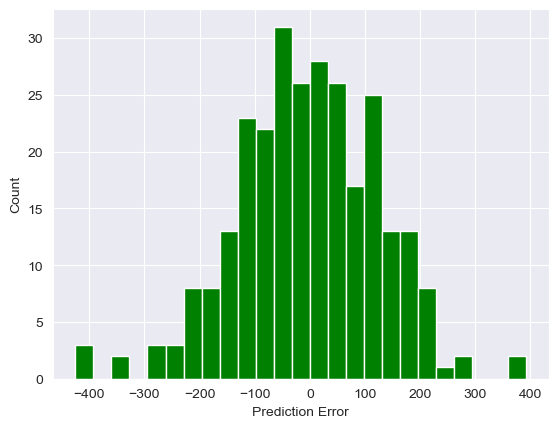

In [108]:
#Визуализация гистограммы распределения ошибки
error = y_test_1 - y_pred_knn
plt.hist(error, bins = 25, color = "g")
plt.xlabel('Prediction Error')
_ = plt.ylabel('Count')

Деревья решений - Decision Tree Regressor - 6


In [109]:
dtr = DecisionTreeRegressor()
dtr.fit(x_train_1, y_train_1.values)
y_pred_dtr = dtr.predict(x_test_1)
mae_dtr = mean_absolute_error(y_pred_dtr, y_test_1)
mse_dtr_elast = mean_squared_error(y_test_1,y_pred_dtr)
print('Decision Tree Regressor Results Train:')
print("Test score: {:.2f}".format(knn.score(x_train_1, y_train_1)))# Скор для тренировочной выборки
print('Decision Tree Regressor Results:')
print('DTR_MAE: ', round(mean_absolute_error(y_test_1, y_pred_dtr)))
print('DTR_MSE: {:.2f}'.format(mse_dtr_elast))
print("DTR_RMSE: {:.2f}".format (np.sqrt(mse_dtr_elast)))
print('DTR_MAPE: {:.2f}'.format(mean_absolute_percentage_error(y_test_1, y_pred_dtr)))
print("Test score: {:.2f}".format(dtr.score(x_test_1, y_test_1)))# Скор для тестовой выборки

Decision Tree Regressor Results Train:
Test score: 0.94
Decision Tree Regressor Results:
DTR_MAE:  105
DTR_MSE: 17488.96
DTR_RMSE: 132.25
DTR_MAPE: 0.05
Test score: 0.92


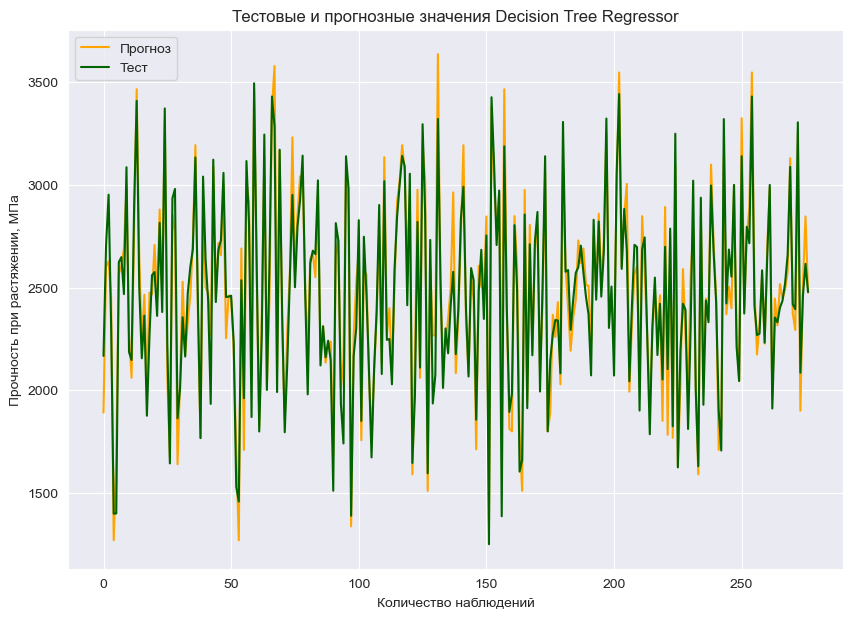

In [110]:
plt.figure(figsize = (10, 7))
plt.title("Тестовые и прогнозные значения Decision Tree Regressor")
plt.plot(y_pred_dtr, label = "Прогноз", color = 'orange')
plt.plot(y_test_1.values, label = "Тест", color = 'darkgreen')
plt.xlabel("Количество наблюдений")
plt.ylabel("Прочность при растяжении, МПа")
plt.legend()
plt.grid(True);

Стохастический градиентный спуск (SGD) - Stochastic Gradient Descent Regressor - 7

In [111]:
sdg = SGDRegressor()
sdg.fit(x_train_1, y_train_1)
y_pred_sdg = sdg.predict(x_test_1)
mae_sdg = mean_absolute_error(y_pred_sdg, y_test_1)
mse_sdg_elast = mean_squared_error(y_test_1,y_pred_sdg)
print('Stochastic Gradient Descent Regressor Results Train:')
print("Test score: {:.2f}".format(sdg.score(x_train_1, y_train_1)))# Скор для тренировочной выборки
print('Stochastic Gradient Descent Regressor Results:')
print('SGD_MAE: ', round(mean_absolute_error(y_test_1, y_pred_sdg)))
print('SGD_MSE: {:.2f}'.format(mse_sdg_elast))
print("SGD_RMSE: {:.2f}".format (np.sqrt(mse_sdg_elast)))
print('SGD_MAPE: {:.2f}'.format(mean_absolute_percentage_error(y_test_1, y_pred_sdg)))
print("Test score: {:.2f}".format(sdg.score(x_test_1, y_test_1)))# Скор для тестовой выборки

Stochastic Gradient Descent Regressor Results Train:
Test score: 0.74
Stochastic Gradient Descent Regressor Results:
SGD_MAE:  182
SGD_MSE: 52284.95
SGD_RMSE: 228.66
SGD_MAPE: 0.08
Test score: 0.76


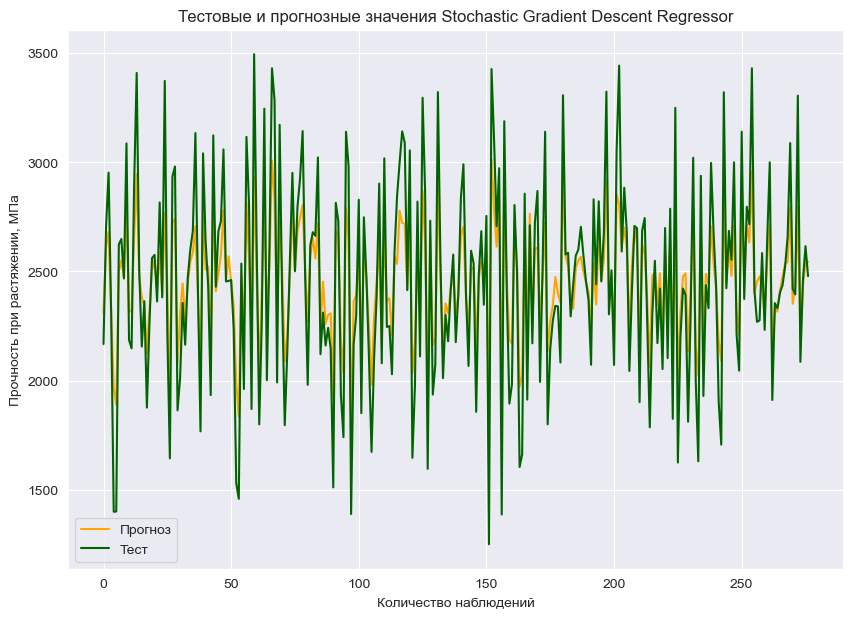

In [112]:
plt.figure(figsize = (10, 7))
plt.title("Тестовые и прогнозные значения Stochastic Gradient Descent Regressor")
plt.plot(y_pred_sdg, label = "Прогноз", color = 'orange')
plt.plot(y_test_1.values, label = "Тест", color = 'darkgreen')
plt.xlabel("Количество наблюдений")
plt.ylabel("Прочность при растяжении, МПа")
plt.legend()
plt.grid(True);

Многослойный перцептрон - Multi-layer Perceptron regressor - 8

In [113]:
mlp = MLPRegressor(random_state = 1, max_iter = 500)
mlp.fit(x_train_1, y_train_1)
y_pred_mlp = mlp.predict(x_test_1)
mae_mlp = mean_absolute_error(y_pred_mlp, y_test_1)
mse_mlp_elast = mean_squared_error(y_test_1,y_pred_mlp)
print('Multi-layer Perceptron regressor Results Train:')
print("Test score: {:.2f}".format(mlp.score(x_train_1, y_train_1)))# Скор для тренировочной выборки
print('Multi-layer Perceptron regressor Results:')
print('SGD_MAE: ', round(mean_absolute_error(y_test_1, y_pred_mlp)))
print('SGD_MAPE: {:.2f}'.format(mean_absolute_percentage_error(y_test_1, y_pred_mlp)))
print('SGD_MSE: {:.2f}'.format(mse_mlp_elast))
print("SGD_RMSE: {:.2f}".format (np.sqrt(mse_mlp_elast)))
print("Test score: {:.2f}".format(mlp.score(x_test_1, y_test_1)))# Скор для тестовой выборки

Multi-layer Perceptron regressor Results Train:
Test score: -16.28
Multi-layer Perceptron regressor Results:
SGD_MAE:  1809
SGD_MAPE: 0.72
SGD_MSE: 3519503.40
SGD_RMSE: 1876.03
Test score: -15.44


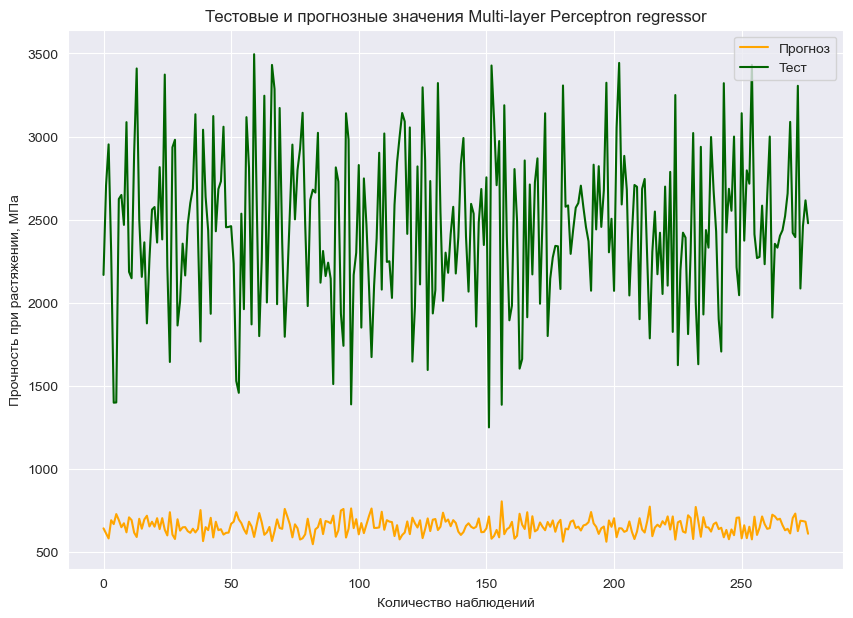

In [114]:
plt.figure(figsize = (10, 7))
plt.title("Тестовые и прогнозные значения Multi-layer Perceptron regressor")
plt.plot(y_pred_mlp, label = "Прогноз", color = 'orange')
plt.plot(y_test_1.values, label = "Тест", color = 'darkgreen')
plt.xlabel("Количество наблюдений")
plt.ylabel("Прочность при растяжении, МПа")
plt.legend()
plt.grid(True);

Лассо регрессия - the Lasso - 9

In [115]:
clf = linear_model.Lasso(alpha=0.1)
clf.fit(x_train_1, y_train_1)
y_pred_clf = clf.predict(x_test_1)
mae_clf = mean_absolute_error(y_pred_clf, y_test_1)
mse_clf_elast = mean_squared_error(y_test_1,y_pred_clf)
print('Lasso regressor Results Train:')
print("Test score: {:.2f}".format(clf.score(x_train_1, y_train_1)))# Скор для тренировочной выборки
print('Lasso regressor Results:')
print('SGD_MAE: ', round(mean_absolute_error(y_test_1, y_pred_clf)))
print('SGD_MAPE: {:.2f}'.format(mean_absolute_percentage_error(y_test_1, y_pred_clf)))
print('SGD_MSE: {:.2f}'.format(mse_clf_elast))
print("SGD_RMSE: {:.2f}".format (np.sqrt(mse_clf_elast)))
print("Test score: {:.2f}".format(clf.score(x_test_1, y_test_1)))# Скор для тестовой выборки

Lasso regressor Results Train:
Test score: 0.95
Lasso regressor Results:
SGD_MAE:  69
SGD_MAPE: 0.03
SGD_MSE: 7750.08
SGD_RMSE: 88.03
Test score: 0.96


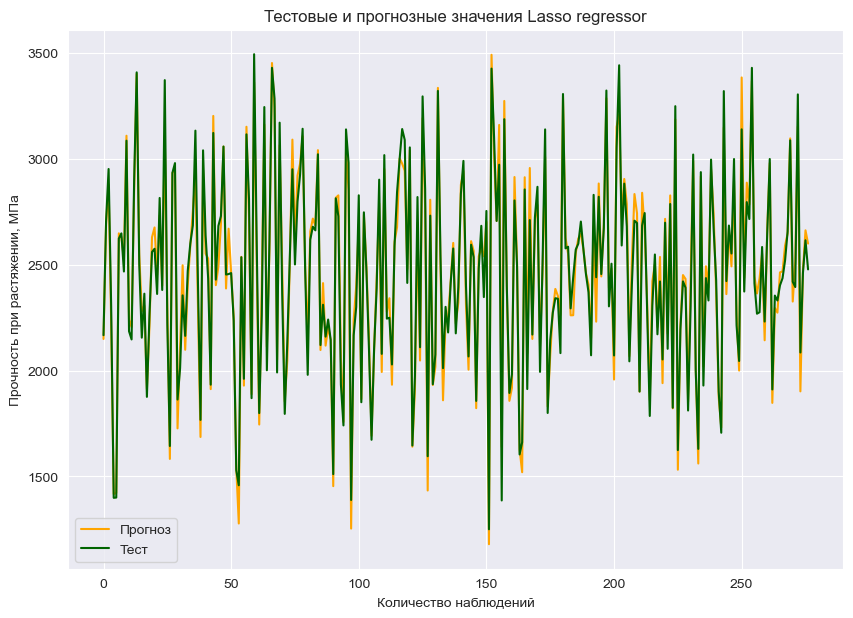

In [116]:
plt.figure(figsize = (10, 7))
plt.title("Тестовые и прогнозные значения Lasso regressor")
plt.plot(y_pred_clf, label = "Прогноз", color = 'orange')
plt.plot(y_test_1.values, label = "Тест", color = 'darkgreen')
plt.xlabel("Количество наблюдений")
plt.ylabel("Прочность при растяжении, МПа")
plt.legend()
plt.grid(True);

In [117]:
#сравним наши модели по метрике МАЕ
mae_df = {'Регрессор': ['Support Vector', 'RandomForest', 'Linear Regression', 'GradientBoosting', 'KNeighbors', 'DecisionTree', 'SGD', 'MLP', 'Lasso'], 'MAE': [mae_svr, mae_rfr, mae_lr, mae_gbr, mae_knr, mae_dtr, mae_sdg, mae_mlp, mae_clf]} 

mae_df = pd.DataFrame(mae_df)

In [118]:
mae_df

,Регрессор,MAE
0,Support Vector,78.477914
1,RandomForest,76.589025
2,Linear Regression,61.986894
3,GradientBoosting,64.990469
4,KNeighbors,102.030259
5,DecisionTree,104.870380
6,SGD,181.634547
7,MLP,1808.547264
8,Lasso,69.474334


Поиск оптимальных гиперпараметров.

В машинном обучении гиперпараметрами называют параметры алгоритмов, значения которых устанавливаются перед запуском процесса обучения. 
В этом смысле они и отличаются от обычных параметров, вычисляемых в процессе обучения. Гиперпараметры используются для управления процессом обучения.
Один из способов настройки гиперпараметров состоит в том, чтобы заставить компьютер попробовать все возможные комбинации значений параметров. 
Для этого используем модуль GridSearchCV из библиотеки Scikit Learn. Попытаемся найти наилучшую комбинацию гиперпараметров для построения классификатора для нашего набора данных.

Метод GridSearch:

ПЛЮСЫ: Этот метод получит требуемые оптимальные гиперпараметры.

МИНУСЫ: Операция является исчерпывающей. Если диапазон или число гиперпараметров велики, то вероятности могут исчисляться миллионами, и на завершение потребуется довольно много времени.

Проведем поиск  по сетке гиперпараметров с перекрестной проверкой, количество блоков равно 10 (cv = 10), для модели случайного леса - Random Forest Regressor - 2

In [129]:
# поиск гипермараметров не дал улучшений для уже имеющейся модели RandomForestRegressor
# вероятно, нужно указывать больше вариаций параметров при работе с GridSearchCV
mae_df

,Регрессор,MAE
0,Support Vector,78.477914
1,RandomForest,76.589025
2,Linear Regression,61.986894
3,GradientBoosting,64.990469
4,KNeighbors,102.030259
5,DecisionTree,104.870380
6,SGD,181.634547
7,MLP,1808.547264
8,Lasso,69.474334


In [130]:
# Проведем поиск  по сетке гиперпараметров с перекрестной проверкой, количество блоков равно 10 (cv = 10), для 
# Метода К ближайших соседей - K Neighbors Regressor - 5
knn = KNeighborsRegressor()
knn_params = {'n_neighbors' : range(1, 301, 2), 
          'weights' : ['uniform', 'distance'],
          'algorithm' : ['auto', 'ball_tree', 'kd_tree', 'brute']
          }
#Запустим обучение модели. В качестве оценки модели будем использовать коэффициент детерминации (R^2)
# Если R2<0, это значит, что разработанная модель даёт прогноз даже хуже, чем простое усреднение.
gs = GridSearchCV(knn, knn_params, cv = 10, verbose = 1, n_jobs =-1, scoring = 'r2')
gs.fit(x_train_1, y_train_1)
knn_3 = gs.best_estimator_
gs.best_params_

Fitting 10 folds for each of 1200 candidates, totalling 12000 fits


{'algorithm': 'brute', 'n_neighbors': 7, 'weights': 'distance'}

In [131]:
#Выводим гиперпараметры для оптимальной модели
print(gs.best_estimator_)
gs1 = gs.best_estimator_
print(f'R2-score KNR для прочности при растяжении, МПа: {gs1.score(x_test_1, y_test_1).round(3)}')

KNeighborsRegressor(algorithm='brute', n_neighbors=7, weights='distance')
R2-score KNR для прочности при растяжении, МПа: 0.923


In [132]:
#подставим оптимальные гиперпараметры в нашу модель метода к ближайших соседей
knn_grid = KNeighborsRegressor(algorithm = 'brute', n_neighbors = 7, weights = 'distance')
#Обучаем модель
knn_grid.fit(x_train_1, y_train_1)

predictions_knn_grid = knn_grid.predict(x_test_1)
#Оцениваем точность на тестовом наборе
mae_knn_grid = mean_absolute_error(predictions_knn_grid, y_test_1)
mae_knn_grid

99.28169380035496

In [133]:
new_row_in_mae_df = {'Регрессор': 'KNeighbors_GridSearchCV', 'MAE': mae_knn_grid} 

mae_df = mae_df.append(new_row_in_mae_df, ignore_index=True)
mae_df

,Регрессор,MAE
0,Support Vector,78.477914
1,RandomForest,76.589025
2,Linear Regression,61.986894
3,GradientBoosting,64.990469
4,KNeighbors,102.030259
5,DecisionTree,104.870380
6,SGD,181.634547
7,MLP,1808.547264
8,Lasso,69.474334
9,KNeighbors_GridSearchCV,99.281694


In [134]:
# Проведем поиск  по сетке гиперпараметров с перекрестной проверкой, количество блоков равно 10 (cv = 10), для 
#Деревья решений - Decision Tree Regressor - 6
criterion = ['squared_error', 'friedman_mse', 'absolute_error', 'poisson']
splitter = ['best', 'random']
max_depth = [3,5,7,9,11]
min_samples_leaf = [100,150,200]
min_samples_split = [200,250,300]
max_features = ['auto', 'sqrt', 'log2']
param_grid = {'criterion': criterion,
               'splitter': splitter,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'max_features': max_features}
#Запустим обучение модели. В качестве оценки модели будем использовать коэффициент детерминации (R^2)
# Если R2<0, это значит, что разработанная модель даёт прогноз даже хуже, чем простое усреднение.
gs4 = GridSearchCV(dtr, param_grid, cv = 10, verbose = 1, n_jobs =-1, scoring = 'r2')
gs4.fit(x_train_1, y_train_1)
dtr_3 = gs4.best_estimator_
gs.best_params_

Fitting 10 folds for each of 1080 candidates, totalling 10800 fits


{'algorithm': 'brute', 'n_neighbors': 7, 'weights': 'distance'}

In [135]:
#Выводим гиперпараметры для оптимальной модели
print(gs4.best_estimator_)
gs1 = gs4.best_estimator_
print(f'R2-score DTR для прочности при растяжении, МПа: {gs4.score(x_test_1, y_test_1).round(3)}')

DecisionTreeRegressor(max_depth=7, max_features='auto', min_samples_leaf=100,
                      min_samples_split=200)
R2-score DTR для прочности при растяжении, МПа: 0.826


In [136]:
#подставим оптимальные гиперпараметры в нашу модель метода деревья решений
dtr_grid = DecisionTreeRegressor(criterion = 'poisson', max_depth = 7, max_features = 'auto',
                      min_samples_leaf = 100, min_samples_split = 250)
#Обучаем модель
dtr_grid.fit(x_train_1, y_train_1)

predictions_dtr_grid = dtr_grid.predict(x_test_1)
#Оцениваем точность на тестовом наборе
mae_dtr_grid = mean_absolute_error(predictions_dtr_grid, y_test_1)
mae_dtr_grid

161.76987764643903

In [137]:
new_row_in_mae_df = {'Регрессор': 'DecisionTree_GridSearchCV', 'MAE': mae_dtr_grid} 

mae_df = mae_df.append(new_row_in_mae_df, ignore_index = True)
mae_df

,Регрессор,MAE
0,Support Vector,78.477914
1,RandomForest,76.589025
2,Linear Regression,61.986894
3,GradientBoosting,64.990469
4,KNeighbors,102.030259
5,DecisionTree,104.870380
6,SGD,181.634547
7,MLP,1808.547264
8,Lasso,69.474334
9,KNeighbors_GridSearchCV,99.281694


In [138]:
pipe = Pipeline([('preprocessing', StandardScaler()), ('regressor', SVR())])
param_grid = [
{'regressor': [SVR()], 'preprocessing': [StandardScaler(), MinMaxScaler(), None],
'regressor__gamma': [0.001, 0.01, 0.1, 1, 10, 100],
'regressor__C': [0.001, 0.01, 0.1, 1, 10, 100]},
{'regressor': [RandomForestRegressor(n_estimators = 100)],
'preprocessing':  [StandardScaler(), MinMaxScaler(), None]},
{'regressor': [LinearRegression()], 'preprocessing':  [StandardScaler(), MinMaxScaler(), None]},
{'regressor': [GradientBoostingRegressor()], 'preprocessing':  [StandardScaler(), MinMaxScaler(), None]},
{'regressor': [KNeighborsRegressor()], 'preprocessing':  [StandardScaler(), MinMaxScaler(), None]},
{'regressor': [DecisionTreeRegressor()], 'preprocessing':  [StandardScaler(), MinMaxScaler(), None]},
{'regressor': [SGDRegressor()], 'preprocessing':  [StandardScaler(), MinMaxScaler(), None]},
{'regressor': [MLPRegressor(random_state = 1, max_iter = 500)], 'preprocessing':  [StandardScaler(), MinMaxScaler(), None]},
{'regressor': [linear_model.Lasso(alpha = 0.1)], 'preprocessing':  [StandardScaler(), MinMaxScaler(), None]},]
grid = GridSearchCV(pipe, param_grid, cv = 10)
grid.fit(x_train_1, np.ravel(y_train_1))
print("Наилучшие параметры:\n{}\n".format(grid.best_params_))
print("Наилучшее значение правильности перекрестной проверки: {:.2f}".format(grid.best_score_))
print("Правильность на тестовом наборе: {:.2f}".format(grid.score(x_test_1, y_test_1)))

Наилучшие параметры:
{'preprocessing': MinMaxScaler(), 'regressor': Lasso(alpha=0.1)}

Наилучшее значение правильности перекрестной проверки: 0.97
Правильность на тестовом наборе: 0.97


In [139]:
print("Наилучшая модель:\n{}".format(grid.best_estimator_))

Наилучшая модель:
Pipeline(steps=[('preprocessing', MinMaxScaler()),
                ('regressor', Lasso(alpha=0.1))])


Прогнозируем модуль упругости при растяжении, ГПа

In [140]:
#разбиваем на тестовую, тренировочную выборки, выделяя предикторы и целевые переменные
normalizer = Normalizer()
res = normalizer.fit_transform(df)
df_norm_n = pd.DataFrame(res, columns = df.columns)
x_train_2, x_test_2, y_train_2, y_test_2 = train_test_split(
    df_norm_n.loc[:, df_norm_n.columns != 'Модуль упругости при растяжении, ГПа'],
    df[['Модуль упругости при растяжении, ГПа']],
       test_size = 0.3,
    random_state = 42)

In [141]:
# Проверка правильности разбивки
df_norm_n.shape[0] - x_train_2.shape[0] - x_test_2.shape[0]

0

In [142]:
x_train_2.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Прочность при растяжении, МПа","Потребление смолы, г/м2",Угол нашивки,Шаг нашивки,Плотность нашивки
481,0.000528,0.589066,0.132149,0.020997,0.006254,0.071450,0.186083,0.767682,0.073037,0.000291,0.002285,0.015563
650,0.000430,0.617300,0.232509,0.027252,0.007346,0.075579,0.081347,0.739980,0.056839,0.000308,0.001350,0.018310
483,0.000580,0.585434,0.170519,0.043402,0.007074,0.096550,0.132807,0.772505,0.041487,0.000295,0.002249,0.018929
355,0.000911,0.545896,0.306130,0.024469,0.006610,0.070488,0.159918,0.757679,0.050148,0.000000,0.001774,0.012540
850,0.000573,0.595720,0.263992,0.034166,0.007519,0.089582,0.095597,0.740762,0.086336,0.000322,0.002765,0.017180


In [143]:
y_train_2

,"Модуль упругости при растяжении, ГПа"
552,69.573625
735,80.691499
554,71.887367
403,68.314525
948,72.997468
...,...
120,74.519119
306,70.325533
959,77.995289
497,70.199234


In [144]:
y_train_2.shape

(645, 1)

In [145]:
# Функция для сравнения результатов предсказаний с моделью, выдающей среднее значение по тестовой выборке
def mean_model(y_test_2):
    return [np.mean(y_test_2) for _ in range(len(y_test_2))]
y_2_pred_mean = mean_model(y_test_2)

Проверка различных моделей при стандартных параметрах 
Метод опорных векторов - 1 

In [146]:
svr2 = make_pipeline(StandardScaler(), SVR(kernel = 'rbf', C = 500.0, epsilon = 1.0))
#обучаем модель
svr2.fit(x_train_2, np.ravel(y_train_2))
#вычисляем коэффициент детерминации
y_pred_svr2 = svr2.predict(x_test_2)
mae_svr2 = mean_absolute_error(y_pred_svr2, y_test_2)
mse_svr_elast2 = mean_squared_error(y_test_2,y_pred_svr2)
print('Support Vector Regression Results Train:') 
print("Test score: {:.2f}".format(svr2.score(x_train_2, y_train_2))) # Скор для тренировочной выборки
print('Support Vector Regression Results:')
print('SVR_MAE:', round(mean_absolute_error(y_test_2, y_pred_svr2)))
print('SVR_MAPE: {:.2f}'.format(mean_absolute_percentage_error(y_test_2, y_pred_svr2)))
print('SVR_MSE: {:.2f}'.format(mse_svr_elast2))
print("SVR_RMSE: {:.2f}".format (np.sqrt(mse_svr_elast2)))
print("Test score: {:.2f}".format(svr2.score(x_test_2, y_test_2))) # Скор для тестовой выборки

Support Vector Regression Results Train:
Test score: 0.90
Support Vector Regression Results:
SVR_MAE: 3
SVR_MAPE: 0.05
SVR_MSE: 19.21
SVR_RMSE: 4.38
Test score: -0.94


In [147]:
#Результаты модели, выдающей среднее значение
mse_lin_elast2_mean = mean_squared_error(y_test_2, y_2_pred_mean)
print("MAE for mean target: ", mean_absolute_error(y_test_2, y_2_pred_mean))
print("MSE for mean target: ", mse_lin_elast2_mean)
print("RMSE for mean target: ", np.sqrt(mse_lin_elast2_mean))

MAE for mean target:  2.5784995357561793
MSE for mean target:  9.910360742106828
RMSE for mean target:  3.148072543971442


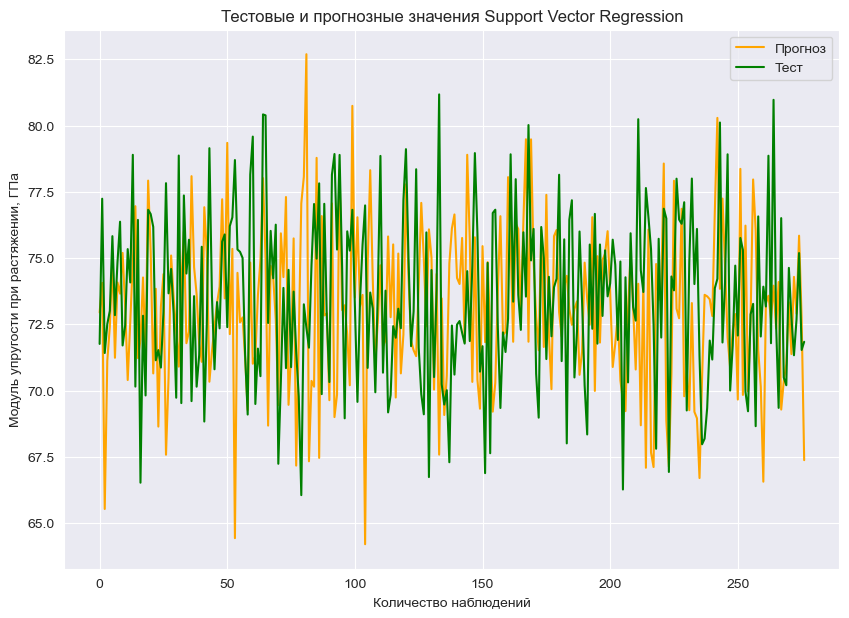

In [148]:
plt.figure(figsize = (10, 7))
plt.title("Тестовые и прогнозные значения Support Vector Regression")
plt.plot(y_pred_svr2, label = "Прогноз", color = "orange")
plt.plot(y_test_2.values, label = "Тест", color = "green")
plt.xlabel("Количество наблюдений")
plt.ylabel("Модуль упругости при растяжении, ГПа")
plt.legend()
plt.grid(True);

Метод случайного леса - Random Forest Regressor - 2

In [150]:
#построение модели и вузуализация метода случайный лес
rfr2 = RandomForestRegressor(n_estimators = 15,max_depth = 7, random_state = 33)
rfr2.fit(x_train_2, y_train_2.values)
y2_pred_forest = rfr2.predict(x_test_2)
mae_rfr2 = mean_absolute_error(y2_pred_forest, y_test_2)
mse_rfr_elast2 = mean_squared_error(y_test_2,y2_pred_forest)
print('Random Forest Regressor Results Train:')
print("Test score: {:.2f}".format(rfr2.score(x_train_2, y_train_2))) # Скор для тренировочной выборки
print('Random Forest Regressor Results:')
print('RF_MAE: ', round(mean_absolute_error(y_test_2, y2_pred_forest)))
print('RF_MAPE: {:.2f}'.format(mean_absolute_percentage_error(y_test_2, y2_pred_forest)))
print('RF_MSE: {:.2f}'.format(mse_rfr_elast2))
print("RF_RMSE: {:.2f}".format (np.sqrt(mse_rfr_elast2)))
print("Test score: {:.2f}".format(rfr2.score(x_test_2, y_test_2))) # Скор для тестовой выборки

Random Forest Regressor Results Train:
Test score: 0.43
Random Forest Regressor Results:
RF_MAE:  3
RF_MAPE: 0.04
RF_MSE: 10.26
RF_RMSE: 3.20
Test score: -0.04


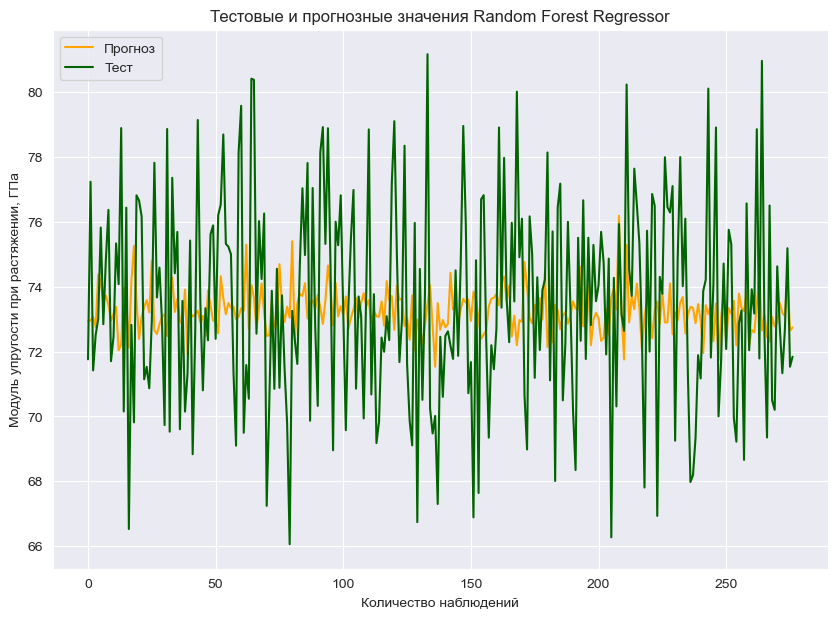

In [151]:
plt.figure(figsize=(10, 7))
plt.title("Тестовые и прогнозные значения Random Forest Regressor")
plt.plot(y2_pred_forest, label = "Прогноз", color = "orange")
plt.plot(y_test_2.values, label = "Тест", color = 'darkgreen')
plt.xlabel("Количество наблюдений")
plt.ylabel("Модуль упругости при растяжении, ГПа")
plt.legend()
plt.grid(True);

Метод линейной регрессии - Linear Regression - 3

In [152]:
#построение модели и вузуализация Линейной регрессии
lr2 = LinearRegression()
lr2.fit(x_train_2, y_train_2)
y_pred_lr2 = lr2.predict(x_test_2)
mae_lr2 = mean_absolute_error(y_pred_lr2, y_test_2)
mse_lin_elast2 = mean_squared_error(y_test_2, y_pred_lr2)
print('Linear Regression Results Train:') # Скор для тренировочной выборки
print("Test score: {:.2f}".format(lr2.score(x_train_2, y_train_2)))
print('Linear Regression Results:')    
print('lr_MAE: ', round(mean_absolute_error(y_test_2, y_pred_lr2)))
print('lr_MAPE: {:.2f}'.format(mean_absolute_percentage_error(y_test_2, y_pred_lr2)))
print('lr_MSE: {:.2f}'.format(mse_lin_elast2))
print("lr_RMSE: {:.2f}".format (np.sqrt(mse_lin_elast2)))
print("Test score: {:.2f}".format(lr2.score(x_test_2, y_test_2))) # Скор для тестовой выборки

Linear Regression Results Train:
Test score: 0.02
Linear Regression Results:
lr_MAE:  3
lr_MAPE: 0.04
lr_MSE: 10.16
lr_RMSE: 3.19
Test score: -0.03


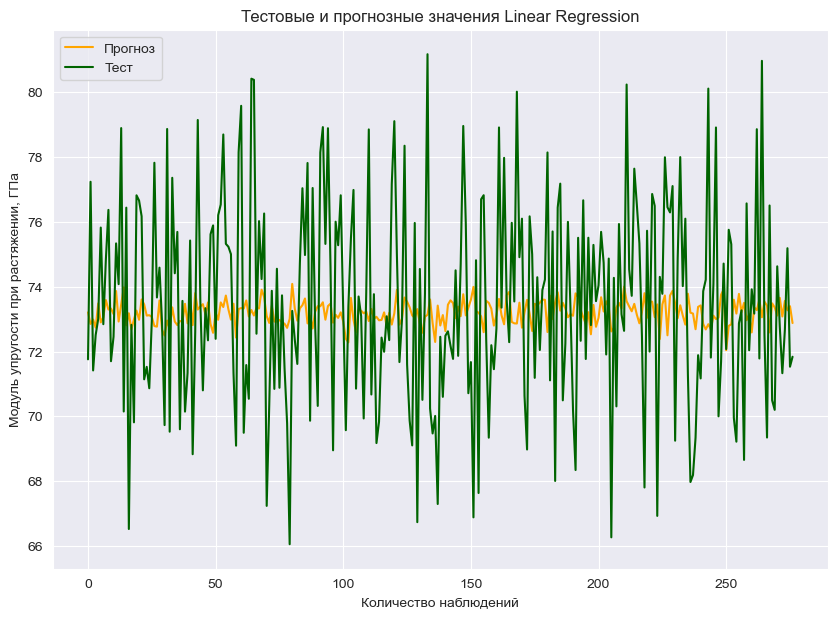

In [153]:
plt.figure(figsize = (10, 7))
plt.title("Тестовые и прогнозные значения Linear Regression")
plt.plot(y_pred_lr2, label = "Прогноз", color = 'orange')
plt.plot(y_test_2.values, label = "Тест", color = 'darkgreen')
plt.xlabel("Количество наблюдений")
plt.ylabel("Модуль упругости при растяжении, ГПа")
plt.legend()
plt.grid(True);

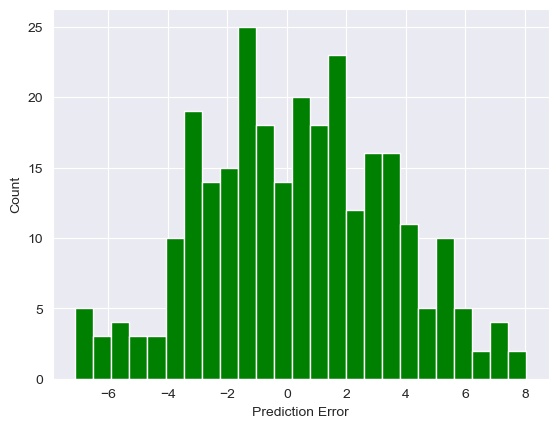

In [154]:
error = y_test_2 - y_pred_lr2
plt.hist(error, bins = 25, color = "g")
plt.xlabel('Prediction Error')
_ = plt.ylabel('Count')

In [155]:
gbr2 = make_pipeline(StandardScaler(), GradientBoostingRegressor())
gbr2.fit(x_train_2, np.ravel(y_train_2))
y_pred_gbr2 = gbr2.predict(x_test_2)
mae_gbr2 = mean_absolute_error(y_pred_gbr2, y_test_2)
mse_gbr_elast2 = mean_squared_error(y_test_2,y_pred_gbr2)
print('Gradient Boosting Regressor Results Train:')
print("Test score: {:.2f}".format(gbr2.score(x_train_2, y_train_2))) # Скор для тренировочной выборки
print('Gradient Boosting Regressor Results:')
print('GBR_MAE: ', round(mean_absolute_error(y_test_2, y_pred_gbr2)))
print('GBR_MAPE: {:.2f}'.format(mean_absolute_percentage_error(y_test_2, y_pred_gbr2)))
print('GBR_MSE: {:.2f}'.format(mse_gbr_elast2))
print("GBR_RMSE: {:.2f}".format (np.sqrt(mse_gbr_elast2)))
print("Test score: {:.2f}".format(gbr2.score(x_test_2, y_test_2)))# Скор для тестовой выборки

Gradient Boosting Regressor Results Train:
Test score: 0.52
Gradient Boosting Regressor Results:
GBR_MAE:  3
GBR_MAPE: 0.04
GBR_MSE: 11.04
GBR_RMSE: 3.32
Test score: -0.11


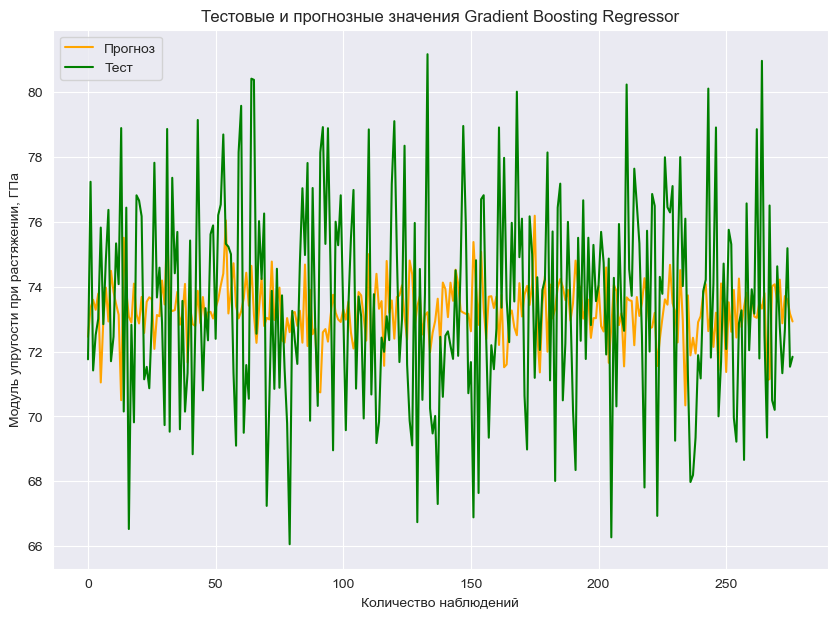

In [156]:
plt.figure(figsize = (10, 7))
plt.title("Тестовые и прогнозные значения Gradient Boosting Regressor")
plt.plot(y_pred_gbr2, label = "Прогноз", color = "orange")
plt.plot(y_test_2.values, label = "Тест", color = "green")
plt.xlabel("Количество наблюдений")
plt.ylabel("Модуль упругости при растяжении, ГПа")
plt.legend()
plt.grid(True);

In [157]:
# Метод К ближайших соседей - K Neighbors Regressor - 5
knn2 = KNeighborsRegressor(n_neighbors=5)
knn2.fit(x_train_2, y_train_2)
y_pred_knn2 = knn2.predict(x_test_2)
mae_knr2 = mean_absolute_error(y_pred_knn2, y_test_2)
mse_knn_elast2 = mean_squared_error(y_test_2,y_pred_knn2)
print('K Neighbors Regressor  Results Train:')
print("Test score: {:.2f}".format(knn2.score(x_train_2, y_train_2)))# Скор для тренировочной выборки
print('K Neighbors Regressor  Results:')
print('KNN_MAE: ', round(mean_absolute_error(y_test_2, y_pred_knn2)))
print('KNN_MAPE: {:.2f}'.format(mean_absolute_percentage_error(y_test_2, y_pred_knn2)))
print('KNN_MSE: {:.2f}'.format(mse_knn_elast2))
print("KNN_RMSE: {:.2f}".format (np.sqrt(mse_knn_elast2)))
print("Test score: {:.2f}".format(knn2.score(x_test_2, y_test_2)))# Скор для тестовой выборки

K Neighbors Regressor  Results Train:
Test score: 0.16
K Neighbors Regressor  Results:
KNN_MAE:  3
KNN_MAPE: 0.04
KNN_MSE: 11.57
KNN_RMSE: 3.40
Test score: -0.17


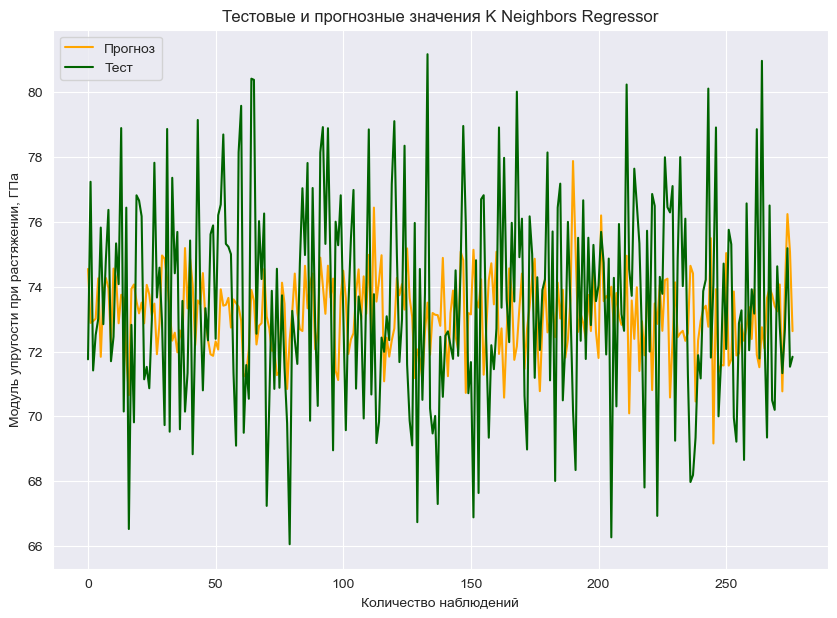

In [158]:
plt.figure(figsize = (10, 7))
plt.title("Тестовые и прогнозные значения K Neighbors Regressor")
plt.plot(y_pred_knn2, label = "Прогноз", color = 'orange')
plt.plot(y_test_2.values, label = "Тест", color = 'darkgreen')
plt.xlabel("Количество наблюдений")
plt.ylabel("Модуль упругости при растяжении, ГПа")
plt.legend()
plt.grid(True);

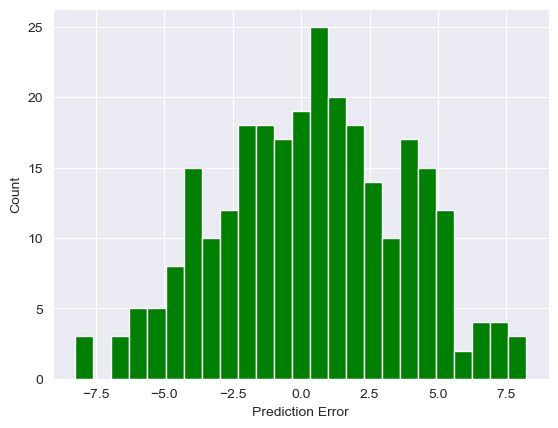

In [159]:
#Визуализация гистограммы распределения ошибки
error = y_test_2 - y_pred_knn2
plt.hist(error, bins = 25, color = "g")
plt.xlabel('Prediction Error')
_ = plt.ylabel('Count')

In [160]:
#Деревья решений - Decision Tree Regressor - 6

dtr2 = DecisionTreeRegressor()
dtr2.fit(x_train_2, y_train_2.values)
y_pred_dtr2 = dtr2.predict(x_test_2)
mae_dtr2 = mean_absolute_error(y_pred_dtr2, y_test_2)
mse_dtr_elast2 = mean_squared_error(y_test_2,y_pred_dtr2)
print('Decision Tree Regressor Results Train:')
print("Test score: {:.2f}".format(dtr2.score(x_train_2, y_train_2)))# Скор для тренировочной выборки
print('Decision Tree Regressor Results:')
print('DTR_MAE: ', round(mean_absolute_error(y_test_2, y_pred_dtr2)))
print('DTR_MSE: {:.2f}'.format(mse_dtr_elast2))
print("DTR_RMSE: {:.2f}".format (np.sqrt(mse_dtr_elast2)))
print('DTR_MAPE: {:.2f}'.format(mean_absolute_percentage_error(y_test_2, y_pred_dtr2)))
print("Test score: {:.2f}".format(dtr2.score(x_test_2, y_test_2)))# Скор для тестовой выборки

Decision Tree Regressor Results Train:
Test score: 1.00
Decision Tree Regressor Results:
DTR_MAE:  4
DTR_MSE: 22.39
DTR_RMSE: 4.73
DTR_MAPE: 0.05
Test score: -1.26


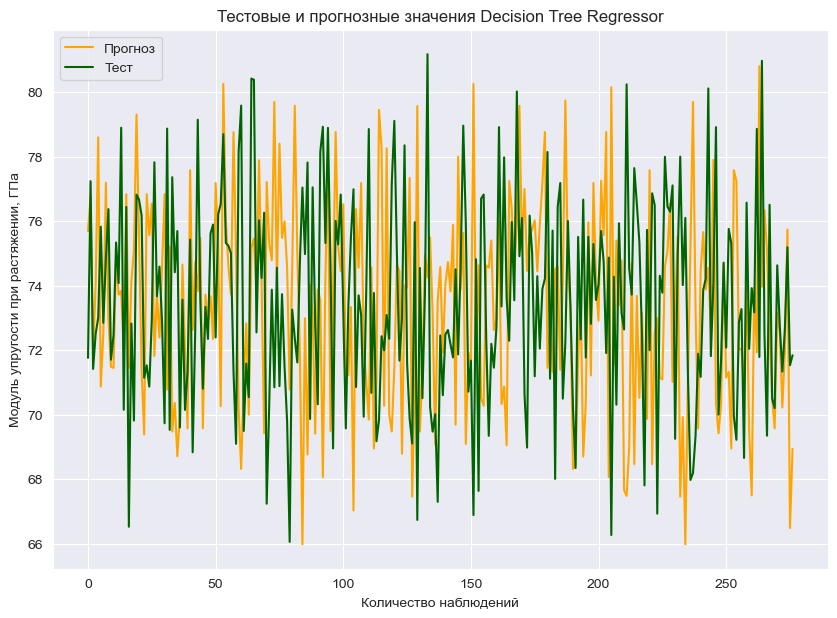

In [161]:
plt.figure(figsize = (10, 7))
plt.title("Тестовые и прогнозные значения Decision Tree Regressor")
plt.plot(y_pred_dtr2, label = "Прогноз", color = 'orange')
plt.plot(y_test_2.values, label = "Тест", color = 'darkgreen')
plt.xlabel("Количество наблюдений")
plt.ylabel("Модуль упругости при растяжении, ГПа")
plt.legend()
plt.grid(True);

In [162]:
# Стохастический градиентный спуск (SGD) - Stochastic Gradient Descent Regressor - 7 

sdg2 = SGDRegressor()
sdg2.fit(x_train_2, y_train_2)
y_pred_sdg2 = sdg2.predict(x_test_2)
mae_sdg2 = mean_absolute_error(y_pred_sdg2, y_test_2)
mse_sdg_elast2 = mean_squared_error(y_test_2,y_pred_sdg2)
print('Stochastic Gradient Descent Regressor Results Train:')
print("Test score: {:.2f}".format(sdg2.score(x_train_2, y_train_2)))# Скор для тренировочной выборки
print('Stochastic Gradient Descent Regressor Results:')
print('SGD_MAE: ', round(mean_absolute_error(y_test_2, y_pred_sdg2)))
print('SGD_MSE: {:.2f}'.format(mse_sdg_elast2))
print("SGD_RMSE: {:.2f}".format (np.sqrt(mse_sdg_elast2)))
print('SGD_MAPE: {:.2f}'.format(mean_absolute_percentage_error(y_test_2, y_pred_sdg2)))
print("Test score: {:.2f}".format(sdg2.score(x_test_2, y_test_2)))# Скор для тестовой выборки

Stochastic Gradient Descent Regressor Results Train:
Test score: -0.02
Stochastic Gradient Descent Regressor Results:
SGD_MAE:  3
SGD_MSE: 10.26
SGD_RMSE: 3.20
SGD_MAPE: 0.04
Test score: -0.04


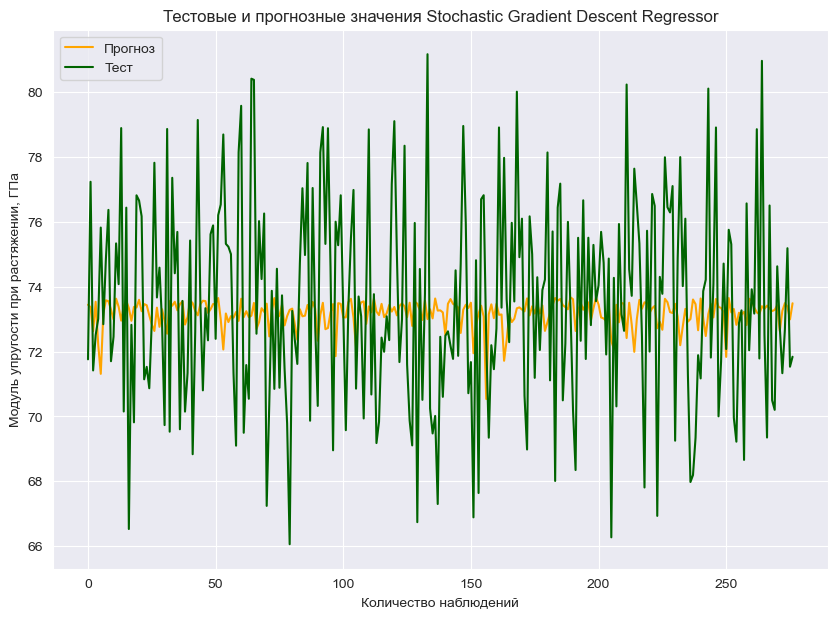

In [163]:
plt.figure(figsize = (10, 7))
plt.title("Тестовые и прогнозные значения Stochastic Gradient Descent Regressor")
plt.plot(y_pred_sdg2, label = "Прогноз", color = 'orange')
plt.plot(y_test_2.values, label = "Тест", color = 'darkgreen')
plt.xlabel("Количество наблюдений")
plt.ylabel("Модуль упругости при растяжении, ГПа")
plt.legend()
plt.grid(True);

In [164]:
# Многослойный перцептрон - Multi-layer Perceptron regressor - 8

mlp2 = MLPRegressor(random_state = 1, max_iter = 500)
mlp2.fit(x_train_2, y_train_2)
y_pred_mlp2 = mlp2.predict(x_test_2)
mae_mlp2 = mean_absolute_error(y_pred_mlp2, y_test_2)
mse_mlp_elast2 = mean_squared_error(y_test_2,y_pred_mlp2)
print('Multi-layer Perceptron regressor Results Train:')
print("Test score: {:.2f}".format(mlp2.score(x_train_2, y_train_2)))# Скор для тренировочной выборки
print('Multi-layer Perceptron regressor Results:')
print('SGD_MAE: ', round(mean_absolute_error(y_test_2, y_pred_mlp2)))
print('SGD_MAPE: {:.2f}'.format(mean_absolute_percentage_error(y_test_2, y_pred_mlp2)))
print('SGD_MSE: {:.2f}'.format(mse_mlp_elast2))
print("SGD_RMSE: {:.2f}".format (np.sqrt(mse_mlp_elast2)))
print("Test score: {:.2f}".format(mlp2.score(x_test_2, y_test_2)))# Скор для тестовой выборки

Multi-layer Perceptron regressor Results Train:
Test score: -0.38
Multi-layer Perceptron regressor Results:
SGD_MAE:  3
SGD_MAPE: 0.04
SGD_MSE: 14.03
SGD_RMSE: 3.75
Test score: -0.42


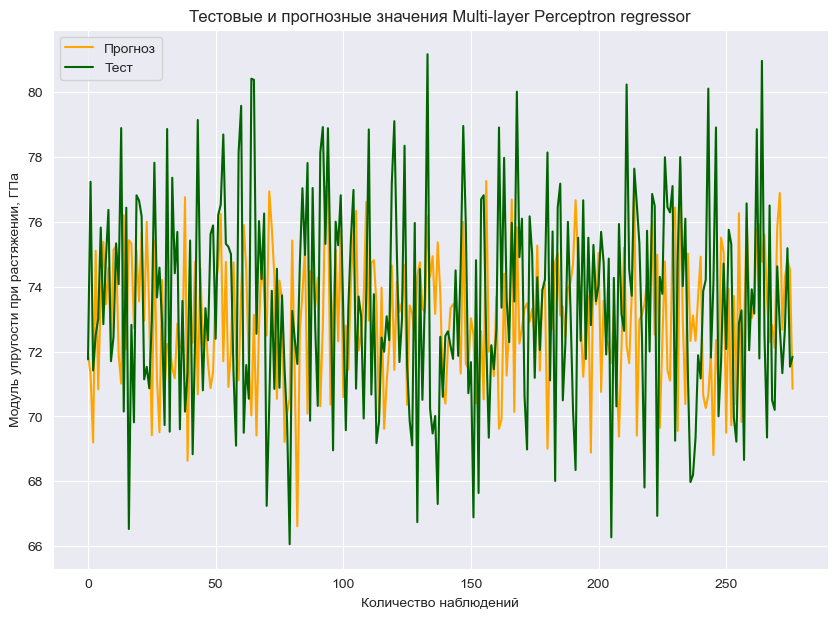

In [165]:
plt.figure(figsize = (10, 7))
plt.title("Тестовые и прогнозные значения Multi-layer Perceptron regressor")
plt.plot(y_pred_mlp2, label = "Прогноз", color = 'orange')
plt.plot(y_test_2.values, label = "Тест", color = 'darkgreen')
plt.xlabel("Количество наблюдений")
plt.ylabel("Модуль упругости при растяжении, ГПа")
plt.legend()
plt.grid(True);

In [166]:
# Лассо регрессия - the Lasso - 9

clf2 = linear_model.Lasso(alpha = 0.1)
clf2.fit(x_train_2, y_train_2)
y_pred_clf2 = clf2.predict(x_test_2)
mae_clf2 = mean_absolute_error(y_pred_clf2, y_test_2)
mse_clf_elast2 = mean_squared_error(y_test_2,y_pred_clf2)
print('Lasso regressor Results Train:')
print("Test score: {:.2f}".format(clf2.score(x_train_2, y_train_2)))# Скор для тренировочной выборки
print('Lasso regressor Results:')
print('SGD_MAE: ', round(mean_absolute_error(y_test_2, y_pred_clf2)))
print('SGD_MAPE: {:.2f}'.format(mean_absolute_percentage_error(y_test_2, y_pred_clf2)))
print('SGD_MSE: {:.2f}'.format(mse_clf_elast2))
print("SGD_RMSE: {:.2f}".format (np.sqrt(mse_clf_elast2)))
print("Test score: {:.2f}".format(clf2.score(x_test_2, y_test_2)))# Скор для тестовой выборки

Lasso regressor Results Train:
Test score: 0.00
Lasso regressor Results:
SGD_MAE:  3
SGD_MAPE: 0.04
SGD_MSE: 10.00
SGD_RMSE: 3.16
Test score: -0.01


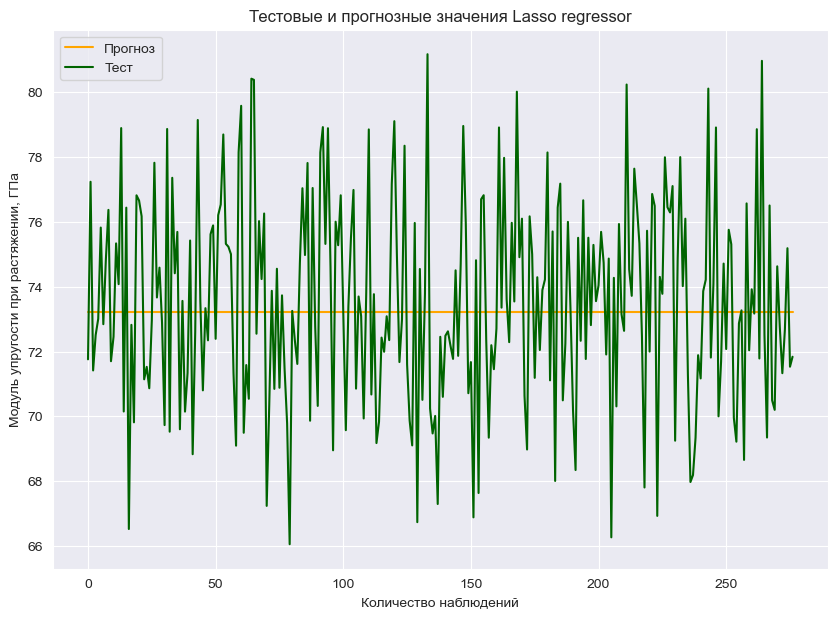

In [167]:
plt.figure(figsize = (10, 7))
plt.title("Тестовые и прогнозные значения Lasso regressor")
plt.plot(y_pred_clf2, label = "Прогноз", color = 'orange')
plt.plot(y_test_2.values, label = "Тест", color = 'darkgreen')
plt.xlabel("Количество наблюдений")
plt.ylabel("Модуль упругости при растяжении, ГПа")
plt.legend()
plt.grid(True);

In [168]:
#сравним наши модели по метрике МАЕ
mae_df2 = {'Регрессор': ['Support Vector', 'RandomForest', 'Linear Regression', 'GradientBoosting', 'KNeighbors', 'DecisionTree', 'SGD', 'MLP', 'Lasso'], 'MAE': [mae_svr2, mae_rfr2, mae_lr2, mae_gbr2, mae_knr2, mae_dtr2, mae_sdg2, mae_mlp2, mae_clf2]} 
mae_df2 = pd.DataFrame(mae_df2)

In [174]:
mae_df

,Регрессор,MAE
0,Support Vector,78.477914
1,RandomForest,76.589025
2,Linear Regression,61.986894
3,GradientBoosting,64.990469
4,KNeighbors,102.030259
5,DecisionTree,104.870380
6,SGD,181.634547
7,MLP,1808.547264
8,Lasso,69.474334
9,KNeighbors_GridSearchCV,99.281694


In [175]:
# Проведем поиск  по сетке гиперпараметров с перекрестной проверкой, количество блоков равно 10 (cv = 10), для 
# Метода К ближайших соседей - K Neighbors Regressor - 5
knn21 = KNeighborsRegressor()
knn21_params = {'n_neighbors' : range(1, 301, 2), 
          'weights' : ['uniform', 'distance'],
          'algorithm' : ['auto', 'ball_tree', 'kd_tree', 'brute']
          }
#Запустим обучение модели. В качестве оценки модели будем использовать коэффициент детерминации (R^2)
# Если R2<0, это значит, что разработанная модель даёт прогноз даже хуже, чем простое усреднение.
gs21 = GridSearchCV(knn21, knn21_params, cv = 10, verbose = 1, n_jobs=-1, scoring = 'r2')
gs21.fit(x_train_2, y_train_2)
knn_21 = gs21.best_estimator_
gs21.best_params_

Fitting 10 folds for each of 1200 candidates, totalling 12000 fits


{'algorithm': 'auto', 'n_neighbors': 113, 'weights': 'uniform'}

In [176]:
#Выводим гиперпараметры для оптимальной модели
print(gs21.best_estimator_)
gs121 = gs21.best_estimator_
print(f'R2-score KNR для модуля упругости при растяжении: {gs121.score(x_test_2, y_test_2).round(3)}')

KNeighborsRegressor(n_neighbors=113)
R2-score KNR для модуля упругости при растяжении: -0.037


In [177]:
#подставим оптимальные гиперпараметры в нашу модель метода к ближайших соседей
knn21_grid = KNeighborsRegressor(algorithm = 'brute', n_neighbors = 7, weights = 'distance')
#Обучаем модель
knn21_grid.fit(x_train_2, y_train_2)

predictions_knn21_grid = knn21_grid.predict(x_test_2)
#Оцениваем точность на тестовом наборе
mae_knn21_grid = mean_absolute_error(predictions_knn21_grid, y_test_2)
mae_knn21_grid

2.757780819908342

In [178]:
new_row_in_mae_df = {'Регрессор': 'KNeighbors1_GridSearchCV', 'MAE': mae_knn21_grid} 

mae_df = mae_df.append(new_row_in_mae_df, ignore_index=True)
mae_df

,Регрессор,MAE
0,Support Vector,78.477914
1,RandomForest,76.589025
2,Linear Regression,61.986894
3,GradientBoosting,64.990469
4,KNeighbors,102.030259
5,DecisionTree,104.870380
6,SGD,181.634547
7,MLP,1808.547264
8,Lasso,69.474334
9,KNeighbors_GridSearchCV,99.281694


In [179]:
# Проведем поиск  по сетке гиперпараметров с перекрестной проверкой, количество блоков равно 10 (cv = 10), для 
#Деревья решений - Decision Tree Regressor - 6
criterion21 = ['squared_error', 'friedman_mse', 'absolute_error', 'poisson']
splitter21 = ['best', 'random']
max_depth21 = [3,5,7,9,11]
min_samples_leaf21 = [100,150,200]
min_samples_split21 = [200,250,300]
max_features21 = ['auto', 'sqrt', 'log2']
param_grid21 = {'criterion': criterion21,
               'splitter': splitter21,
               'max_depth': max_depth21,
               'min_samples_split': min_samples_split21,
               'min_samples_leaf': min_samples_leaf21,
               'max_features': max_features21}
#Запустим обучение модели. В качестве оценки модели будем использовать коэффициент детерминации (R^2)
# Если R2<0, это значит, что разработанная модель даёт прогноз даже хуже, чем простое усреднение.
gs21 = GridSearchCV(dtr2, param_grid21, cv = 10, verbose = 1, n_jobs=-1, scoring = 'r2')
gs21.fit(x_train_2, y_train_2)
dtr_21 = gs21.best_estimator_
gs21.best_params_

Fitting 10 folds for each of 1080 candidates, totalling 10800 fits


{'criterion': 'poisson',
 'max_depth': 9,
 'max_features': 'sqrt',
 'min_samples_leaf': 100,
 'min_samples_split': 250,
 'splitter': 'random'}

In [180]:
#Выводим гиперпараметры для оптимальной модели
print(gs21.best_estimator_)
gs21 = gs21.best_estimator_
print(f'R2-score DTR для модуля упругости при растяжении: {gs21.score(x_test_2, y_test_2).round(3)}')

DecisionTreeRegressor(criterion='poisson', max_depth=9, max_features='sqrt',
                      min_samples_leaf=100, min_samples_split=250,
                      splitter='random')
R2-score DTR для модуля упругости при растяжении: -0.009


In [181]:
#подставим оптимальные гиперпараметры в нашу модель метода деревья решений
dtr21_grid = DecisionTreeRegressor(criterion='poisson', max_depth=7, max_features='auto',
                      min_samples_leaf=100, min_samples_split=250)
#Обучаем модель
dtr21_grid.fit(x_train_2, y_train_2)

predictions_dtr21_grid = dtr21_grid.predict(x_test_2)
#Оцениваем точность на тестовом наборе
mae_dtr21_grid = mean_absolute_error(predictions_dtr21_grid, y_test_2)
mae_dtr21_grid

2.6022301458385946

In [182]:
new_row_in_mae_df = {'Регрессор': 'DecisionTree1_GridSearchCV', 'MAE': mae_dtr21_grid} 

mae_df = mae_df.append(new_row_in_mae_df, ignore_index=True)
mae_df

,Регрессор,MAE
0,Support Vector,78.477914
1,RandomForest,76.589025
2,Linear Regression,61.986894
3,GradientBoosting,64.990469
4,KNeighbors,102.030259
5,DecisionTree,104.870380
6,SGD,181.634547
7,MLP,1808.547264
8,Lasso,69.474334
9,KNeighbors_GridSearchCV,99.281694


In [183]:
pipe2 = Pipeline([('preprocessing', StandardScaler()), ('regressor', SVR())])
param_grid2 = [
{'regressor': [SVR()], 'preprocessing': [StandardScaler(), MinMaxScaler(), None],
'regressor__gamma': [0.001, 0.01, 0.1, 1, 10, 100],
'regressor__C': [0.001, 0.01, 0.1, 1, 10, 100]},
{'regressor': [RandomForestRegressor(n_estimators=100)],
'preprocessing':  [StandardScaler(), MinMaxScaler(), None]},
{'regressor': [LinearRegression()], 'preprocessing':  [StandardScaler(), MinMaxScaler(), None]},
{'regressor': [GradientBoostingRegressor()], 'preprocessing':  [StandardScaler(), MinMaxScaler(), None]},
{'regressor': [KNeighborsRegressor()], 'preprocessing':  [StandardScaler(), MinMaxScaler(), None]},
{'regressor': [DecisionTreeRegressor()], 'preprocessing':  [StandardScaler(), MinMaxScaler(), None]},
{'regressor': [SGDRegressor()], 'preprocessing':  [StandardScaler(), MinMaxScaler(), None]},
{'regressor': [MLPRegressor(random_state=1, max_iter=500)], 'preprocessing':  [StandardScaler(), MinMaxScaler(), None]},
{'regressor': [linear_model.Lasso(alpha=0.1)], 'preprocessing':  [StandardScaler(), MinMaxScaler(), None]},]
grid2 = GridSearchCV(pipe2, param_grid2, cv=10)
grid2.fit(x_train_2, np.ravel(y_train_2))
print("Наилучшие параметры:\n{}\n".format(grid2.best_params_))
print("Наилучшее значение правильности перекрестной проверки: {:.2f}".format(grid2.best_score_))
print("Правильность на тестовом наборе: {:.2f}".format(grid2.score(x_test_2, y_test_2)))

Наилучшие параметры:
{'preprocessing': StandardScaler(), 'regressor': SVR(C=1, gamma=1), 'regressor__C': 1, 'regressor__gamma': 1}

Наилучшее значение правильности перекрестной проверки: -0.00
Правильность на тестовом наборе: -0.01


In [184]:
print("Наилучшая модель:\n{}".format(grid2.best_estimator_))

Наилучшая модель:
Pipeline(steps=[('preprocessing', StandardScaler()),
                ('regressor', SVR(C=1, gamma=1))])


После обучения моделей была проведена оценка точности этих моделей на обучающей и тестовых выборках. В качестве параметра оценки модели использовалась средняя абсолютная ошибка (MAE). Обе модели даже на тренировочном датасете не смогли обучиться и приблизиться к исходным данным. Поэтому ошибка на тестовом датасете выше.

Написать нейронную сеть, которая будет рекомендовать соотношение матрица-наполнитель.

In [185]:
# Сформируем входы и выход для модели

tv = df['Соотношение матрица-наполнитель']
tr_v = df.loc[:, df.columns != 'Соотношение матрица-наполнитель']

# Разбиваем выборки на обучающую и тестовую
x_train, x_test, y_train, y_test = train_test_split(tr_v, tv, test_size = 0.3, random_state = 14)

In [186]:
# Нормализуем данные

x_train_n = tf.keras.layers.Normalization(axis =-1)
x_train_n.adapt(np.array(x_train))

In [187]:
def create_model(lyrs=[32], act='softmax', opt='SGD', dr=0.1):
    
    seed = 7
    np.random.seed(seed)
    tf.random.set_seed(seed)
    
    model = Sequential()
    model.add(Dense(lyrs[0], input_dim=x_train.shape[1], activation=act)) 
    for i in range(1,len(lyrs)):
        model.add(Dense(lyrs[i], activation=act))
    
    model.add(Dropout(dr))
    model.add(Dense(3, activation='tanh'))  # выходной слой
    
    model.compile(loss='binary_crossentropy', optimizer=opt, metrics=['mae', 'accuracy'])
 
    return model

In [188]:
# строим модель
model = KerasClassifier(build_fn=create_model, verbose=0)

# определяем параметры
batch_size = [4, 10, 20, 50, 100]
epochs = [10, 50, 100, 200, 300]
param_grid = dict(batch_size=batch_size, epochs=epochs)

# поиск оптимальных параметров
grid = GridSearchCV(estimator=model, 
                    param_grid=param_grid,
                    cv=10,
                    verbose=1, n_jobs=-1)

grid_result = grid.fit(x_train, y_train)

Fitting 10 folds for each of 25 candidates, totalling 250 fits


In [189]:
# результаты
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Best: 0.004639 using {'batch_size': 20, 'epochs': 200}
0.003101 (0.006202) with: {'batch_size': 4, 'epochs': 10}
0.003077 (0.009231) with: {'batch_size': 4, 'epochs': 50}
0.001538 (0.004615) with: {'batch_size': 4, 'epochs': 100}
0.001538 (0.004615) with: {'batch_size': 4, 'epochs': 200}
0.001538 (0.004615) with: {'batch_size': 4, 'epochs': 300}
0.001538 (0.004615) with: {'batch_size': 10, 'epochs': 10}
0.001538 (0.004615) with: {'batch_size': 10, 'epochs': 50}
0.001538 (0.004615) with: {'batch_size': 10, 'epochs': 100}
0.001538 (0.004615) with: {'batch_size': 10, 'epochs': 200}
0.001538 (0.004615) with: {'batch_size': 10, 'epochs': 300}
0.001538 (0.004615) with: {'batch_size': 20, 'epochs': 10}
0.001538 (0.004615) with: {'batch_size': 20, 'epochs': 50}
0.003077 (0.009231) with: {'batch_size': 20, 'epochs': 100}
0.004639 (0.009877) with: {'batch_size': 20, 'epochs': 200}
0.003101 (0.006202) with: {'batch_size': 20, 'epochs': 300}
0.000000 (0.000000) with: {'batch_size': 50, 'epochs': 1

In [190]:
model = KerasClassifier(build_fn=create_model, epochs=50, batch_size=4, verbose=0)

optimizer = ['SGD', 'RMSprop', 'Adagrad', 'Adadelta', 'Adam', 'Nadam']
param_grid = dict(opt=optimizer)

grid = GridSearchCV(estimator=model, param_grid=param_grid, cv=10, verbose=2)
grid_result = grid.fit(x_train, y_train)

Fitting 10 folds for each of 6 candidates, totalling 60 fits
[CV] END ............................................opt=SGD; total time=  13.4s
[CV] END ............................................opt=SGD; total time=  10.2s
[CV] END ............................................opt=SGD; total time=  13.9s
[CV] END ............................................opt=SGD; total time=  11.9s
[CV] END ............................................opt=SGD; total time=  11.6s
[CV] END ............................................opt=SGD; total time=  14.2s
[CV] END ............................................opt=SGD; total time=  14.5s
[CV] END ............................................opt=SGD; total time=  14.9s
[CV] END ............................................opt=SGD; total time=  17.0s
[CV] END ............................................opt=SGD; total time=  12.1s
[CV] END ........................................opt=RMSprop; total time=  14.3s
[CV] END .......................................

In [191]:
# результаты
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Best: 0.003101 using {'opt': 'Adam'}
0.003077 (0.009231) with: {'opt': 'SGD'}
0.001538 (0.004615) with: {'opt': 'RMSprop'}
0.003077 (0.009231) with: {'opt': 'Adagrad'}
0.001538 (0.004615) with: {'opt': 'Adadelta'}
0.003101 (0.006202) with: {'opt': 'Adam'}
0.000000 (0.000000) with: {'opt': 'Nadam'}


In [192]:
model = KerasClassifier(build_fn=create_model, epochs=50, batch_size=4, verbose=0)

layers = [[8],[16, 4],[32, 8, 3],[12, 6, 3], [64, 64, 3], [128, 64, 16, 3]]
param_grid = dict(lyrs=layers)

grid = GridSearchCV(estimator=model, param_grid=param_grid, cv=10, verbose=2)
grid_result = grid.fit(x_train, y_train)

Fitting 10 folds for each of 6 candidates, totalling 60 fits
[CV] END ...........................................lyrs=[8]; total time=   9.6s
[CV] END ...........................................lyrs=[8]; total time=   9.6s
[CV] END ...........................................lyrs=[8]; total time=   9.6s
[CV] END ...........................................lyrs=[8]; total time=  10.0s
[CV] END ...........................................lyrs=[8]; total time=  10.0s
[CV] END ...........................................lyrs=[8]; total time=  10.7s
[CV] END ...........................................lyrs=[8]; total time=  10.9s
[CV] END ...........................................lyrs=[8]; total time=  10.7s
[CV] END ...........................................lyrs=[8]; total time=  10.6s
[CV] END ...........................................lyrs=[8]; total time=  10.7s
[CV] END .......................................lyrs=[16, 4]; total time=  10.1s
[CV] END .......................................

In [193]:
# результаты
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Best: 0.003101 using {'lyrs': [64, 64, 3]}
0.001538 (0.004615) with: {'lyrs': [8]}
0.001538 (0.004615) with: {'lyrs': [16, 4]}
0.001538 (0.004615) with: {'lyrs': [32, 8, 3]}
0.001538 (0.004615) with: {'lyrs': [12, 6, 3]}
0.003101 (0.006202) with: {'lyrs': [64, 64, 3]}
0.001538 (0.004615) with: {'lyrs': [128, 64, 16, 3]}


In [194]:
model = KerasClassifier(build_fn=create_model, epochs=50, batch_size=4, verbose=0)

activation = ['softmax', 'softplus', 'softsign', 'relu', 'tanh', 'sigmoid', 'hard_sigmoid', 'linear']
param_grid = dict(act=activation)

grid = GridSearchCV(estimator=model, param_grid=param_grid, n_jobs=-1, cv=10)
grid_result = grid.fit(x_train, y_train)

In [195]:
# результаты
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Best: 0.003101 using {'act': 'softplus'}
0.001538 (0.004615) with: {'act': 'softmax'}
0.003101 (0.006202) with: {'act': 'softplus'}
0.001538 (0.004615) with: {'act': 'softsign'}
0.001538 (0.004615) with: {'act': 'relu'}
0.001538 (0.004615) with: {'act': 'tanh'}
0.001538 (0.004615) with: {'act': 'sigmoid'}
0.001538 (0.004615) with: {'act': 'hard_sigmoid'}
0.003101 (0.006202) with: {'act': 'linear'}


In [196]:
model = KerasClassifier(build_fn=create_model, epochs=50, batch_size=4, verbose=0)

drops = [0.0, 0.01, 0.05, 0.1, 0.2, 0.3, 0.5]
param_grid = dict(dr=drops)

grid = GridSearchCV(estimator=model, param_grid=param_grid, cv=10, verbose=2)
grid_result = grid.fit(x_train, y_train)

Fitting 10 folds for each of 7 candidates, totalling 70 fits
[CV] END .............................................dr=0.0; total time=   9.4s
[CV] END .............................................dr=0.0; total time=   9.3s
[CV] END .............................................dr=0.0; total time=   9.7s
[CV] END .............................................dr=0.0; total time=   9.6s
[CV] END .............................................dr=0.0; total time=   9.2s
[CV] END .............................................dr=0.0; total time=  10.4s
[CV] END .............................................dr=0.0; total time=  10.3s
[CV] END .............................................dr=0.0; total time=  10.4s
[CV] END .............................................dr=0.0; total time=  10.4s
[CV] END .............................................dr=0.0; total time=  10.5s
[CV] END ............................................dr=0.01; total time=   9.7s
[CV] END .......................................

In [197]:
# результаты
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Best: 0.003101 using {'dr': 0.05}
0.001538 (0.004615) with: {'dr': 0.0}
0.001538 (0.004615) with: {'dr': 0.01}
0.003101 (0.006202) with: {'dr': 0.05}
0.003101 (0.006202) with: {'dr': 0.1}
0.001538 (0.004615) with: {'dr': 0.2}
0.001538 (0.004615) with: {'dr': 0.3}
0.001538 (0.004615) with: {'dr': 0.5}


In [198]:
# построение окончательной модели
model = create_model(lyrs=[128, 64, 16, 3], dr=0.05)

print(model.summary())

Model: "sequential_195"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_492 (Dense)           (None, 128)               1664      
                                                                 
 dense_493 (Dense)           (None, 64)                8256      
                                                                 
 dense_494 (Dense)           (None, 16)                1040      
                                                                 
 dense_495 (Dense)           (None, 3)                 51        
                                                                 
 dropout_195 (Dropout)       (None, 3)                 0         
                                                                 
 dense_496 (Dense)           (None, 3)                 12        
                                                                 
Total params: 11,023
Trainable params: 11,023
Non-tr

In [199]:
# обучаем нейросеть, 80/20 CV
model_hist = model.fit(x_train, 
    y_train, 
    epochs = 100, 
    verbose = 1, 
    validation_split = 0.2)

Epoch 1/100
17/17 [==============================] - 1s 21ms/step - loss: 45.4275 - mae: 3.3094 - accuracy: 0.0000e+00 - val_loss: 42.8621 - val_mae: 3.0983 - val_accuracy: 0.0000e+00
Epoch 2/100
17/17 [==============================] - 0s 6ms/step - loss: 40.7696 - mae: 3.2267 - accuracy: 0.0000e+00 - val_loss: 28.3920 - val_mae: 2.8588 - val_accuracy: 0.0000e+00
Epoch 3/100
17/17 [==============================] - 0s 6ms/step - loss: 30.0757 - mae: 3.0278 - accuracy: 0.0000e+00 - val_loss: 27.7067 - val_mae: 2.7970 - val_accuracy: 0.0000e+00
Epoch 4/100
17/17 [==============================] - 0s 6ms/step - loss: 29.4330 - mae: 2.9845 - accuracy: 0.0000e+00 - val_loss: 27.1990 - val_mae: 2.7699 - val_accuracy: 0.0000e+00
Epoch 5/100
17/17 [==============================] - 0s 5ms/step - loss: 28.8266 - mae: 2.9655 - accuracy: 0.0000e+00 - val_loss: 26.7537 - val_mae: 2.7517 - val_accuracy: 0.0000e+00
Epoch 6/100
17/17 [==============================] - 0s 6ms/step - loss: 15.4651 - m

Epoch 46/100
17/17 [==============================] - 0s 6ms/step - loss: -4.6672 - mae: 2.5204 - accuracy: 0.0000e+00 - val_loss: -3.7957 - val_mae: 2.3167 - val_accuracy: 0.0000e+00
Epoch 47/100
17/17 [==============================] - 0s 10ms/step - loss: -4.6968 - mae: 2.5210 - accuracy: 0.0000e+00 - val_loss: -3.7957 - val_mae: 2.3167 - val_accuracy: 0.0000e+00
Epoch 48/100
17/17 [==============================] - 0s 9ms/step - loss: -4.6762 - mae: 2.5198 - accuracy: 0.0000e+00 - val_loss: -3.7957 - val_mae: 2.3167 - val_accuracy: 0.0000e+00
Epoch 49/100
17/17 [==============================] - 0s 6ms/step - loss: -4.6649 - mae: 2.5183 - accuracy: 0.0000e+00 - val_loss: -3.7957 - val_mae: 2.3168 - val_accuracy: 0.0000e+00
Epoch 50/100
17/17 [==============================] - 0s 6ms/step - loss: -4.6967 - mae: 2.5207 - accuracy: 0.0000e+00 - val_loss: -3.7957 - val_mae: 2.3168 - val_accuracy: 0.0000e+00
Epoch 51/100
17/17 [==============================] - 0s 5ms/step - loss: -4.72

In [200]:
# оценим модель
scores = model.evaluate(x_test, y_test)
print("\n%s: %.2f%%" % (model.metrics_names[1], scores[1]*100))

9/9 [==============================] - 0s 3ms/step - loss: -4.3965 - mae: 2.4413 - accuracy: 0.0000e+00

mae: 244.13%


In [201]:
# Посмотрим на потери модели

model_hist.history

{'loss': [45.427490234375,
  40.76960754394531,
  30.07573699951172,
  29.432987213134766,
  28.82655143737793,
  15.465112686157227,
  4.921175003051758,
  4.067899703979492,
  3.245962619781494,
  2.412680149078369,
  1.7036118507385254,
  0.8885805010795593,
  0.2168910950422287,
  -0.1765945702791214,
  -0.5987160205841064,
  -1.0987284183502197,
  -1.467533826828003,
  -2.0331544876098633,
  -2.411543130874634,
  -2.8287041187286377,
  -3.2978262901306152,
  -3.65167498588562,
  -4.063839435577393,
  -4.439083576202393,
  -4.5421953201293945,
  -4.577002048492432,
  -4.608506202697754,
  -4.615278244018555,
  -4.644814491271973,
  -4.603656768798828,
  -4.620148181915283,
  -4.63484525680542,
  -4.633997917175293,
  -4.664905548095703,
  -4.61798095703125,
  -4.621001720428467,
  -4.635817527770996,
  -4.67287540435791,
  -4.6570281982421875,
  -4.646577835083008,
  -4.630847930908203,
  -4.638269901275635,
  -4.658440589904785,
  -4.576848983764648,
  -4.647779941558838,
  -4.667

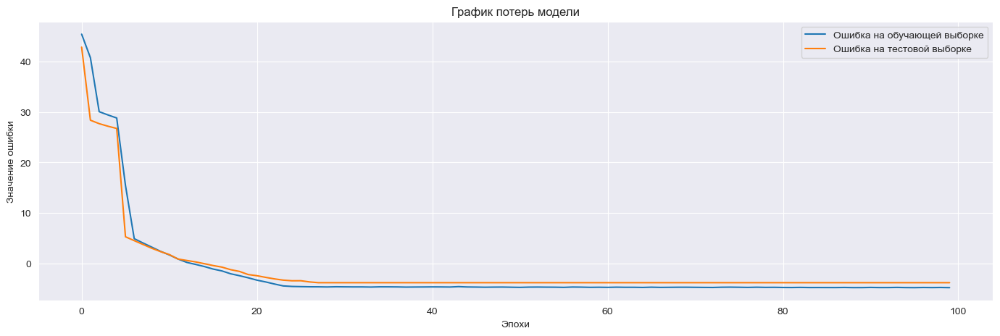

In [202]:
# Посмотрим на график потерь на тренировочной и тестовой выборках
def model_loss_plot(model_hist):
    plt.figure(figsize = (17,5))
    plt.plot(model_hist.history['loss'],
             label = 'ошибка на обучающей выборке')
    plt.plot(model_hist.history['val_loss'],
            label = 'ошибка на тестовой выборке')
    plt.title('График потерь модели')
    plt.ylabel('Значение ошибки')
    plt.xlabel('Эпохи')
    plt.legend(['Oшибка на обучающей выборке', 'Ошибка на тестовой выборке'], loc='best')
    plt.show()
model_loss_plot(model_hist)

9/9 [==============================] - 0s 2ms/step


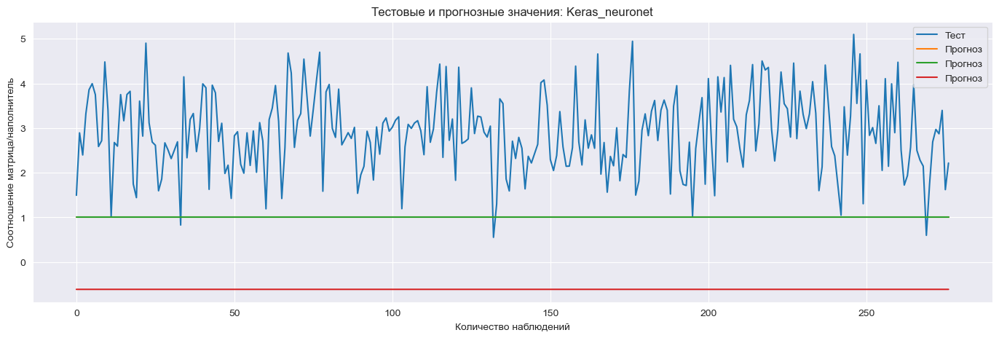

In [203]:
# Зададим функцию для визуализации факт/прогноз для результатов моделей
# Посмотрим на график результата работы модели
def actual_and_predicted_plot(orig, predict, var, model_name):    
    plt.figure(figsize=(17,5))
    plt.title(f'Тестовые и прогнозные значения: {model_name}')
    plt.plot(orig, label = 'Тест')
    plt.plot(predict, label = 'Прогноз')
    plt.legend(loc = 'best')
    plt.ylabel(var)
    plt.xlabel('Количество наблюдений')
    plt.show()
actual_and_predicted_plot(y_test.values, model.predict(x_test.values), 'Cоотношение матрица/наполнитель', 'Keras_neuronet')

# Заключение.

Подводя итоги, стоит сказать, что машинное обучение в задачах моделей прогнозирования – довольно сложный процесс, требующий не только навыков программирования, но и профессионального подхода к сфере самих композитных материалов. Необходимо понимать, на какие атрибуты нужно в первую очередь обратить внимание, чтобы суметь впоследствии грамотно и чётко спрогнозировать тот или иной признак. И, естественно, обладать всеми необходимыми знаниями, умениями и навыками для прогнозов и расчетов. В ходе работы был задействован дата-сет с реальными данными, произведена его подробный анализ; построено множество разнообразных графиков; осуществлено разбиение данных на обучающую и тестовую выборки с использованием множества вспомогательных модулей из библиотеки SkLearn, которая во многом облегчила процесс машинного обучения и в целом была очень полезным инструментом в ходе работы над выпускной квалификационной работой. В рамках машинного обучения и поиска гиперпараметров были задействованы несколько алгоритмов: линейная регрессия, градиентный бустинг, К ближайших соседей, деревья решений, стохастический градиентный спуск, многослойный перцептрон, лассо регрессия, а также опорные вектора и случайный лес. Поиск гиперпараметров осуществлялся при помощи таких методов, как «GridSearch». Для каждой из выборок были составлены классификационные отчёты, содержащие в себе основополагающие метрики, оценивающие качество проводимого обучения. В конечном итоге было представлено сравнение результатов оценок работы алгоритмов, а также различные графики и диаграммы, позволяющие наглядно оценить итоги проведенного обучения. Обучена нейронная сеть и разработано пользовательское приложение, предсказывающе вероятный прогноз по заданным параметрам. Что касается перспектив решения данной проблемы композитных материалов, то я думаю, что в таких случаях необходимо уделить больше внимания изучению самой проблемы композитных материалов, углубить знания по статистике и регрессиям, поискать иные варианты решений с данным датасетом, создать плодтворную команду программистов и сотрудников, работающих с природными материалами, способную к совместной работе над усовершенствованием уже существующих разработок и поддержанием их качественного и бесперебойного функционирования.